# CGMF Summary File Analysis Tool and Sensitivity Coefficient Calculator

### Austin Carter, LANL, University of Michigan

In [1]:
import numpy as np
import scipy as sp
import scipy.optimize as opt
import os
from statistics import *
from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import sympy as sym
from sympy.interactive import printing
printing.init_printing(use_latex = 'mathjax')
from IPython.display import display, Math, Latex
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as ticker
from matplotlib.pyplot import cm
import pylab as pl
from scipy.stats import chisquare
%matplotlib inline

In [2]:
### rcParams are the default parameters for matplotlib
import matplotlib as mpl

print ("Matplotbib Version: ", mpl.__version__)

mpl.rcParams['font.size'] = 18
mpl.rcParams['font.family'] = 'Helvetica', 'serif'
#mpl.rcParams['font.color'] = 'darkred'
mpl.rcParams['font.weight'] = 'normal'

mpl.rcParams['axes.labelsize'] = 18.
mpl.rcParams['xtick.labelsize'] = 18.
mpl.rcParams['ytick.labelsize'] = 18.
mpl.rcParams['lines.linewidth'] = 2.

font = {'family' : 'serif',
        'color'  : 'darkred',
        'weight' : 'normal',
        'size'   : 18,
        }

mpl.rcParams['xtick.major.pad']='10'
mpl.rcParams['ytick.major.pad']='10'

mpl.rcParams['image.cmap'] = 'inferno'

Matplotbib Version:  2.0.2


In [3]:
param_labels = [r'$w_{S2}$', r'$w_{S1}$', r'$w_{SL}$',
               r'$d_{min}^{S2}$', r'$d_{min}^{S1}$', r'$d_{min}^{SL}$',
               r'$d_{max}^{S2}$', r'$d_{max}^{S1}$', r'$d_{max}^{SL}$',
               r'$d_{dec}^{S2}$', r'$d_{dec}^{S1}$', r'$d_{dec}^{SL}$',
               r'$\overline{A}_{S2}$', r'$\overline{A}_{S1}$', 
               r'$\sigma_{\overline{A}}^{S2}$', r'$\sigma_{\overline{A}}^{S1}$', r'$\sigma_{\overline{A}}^{SL}$']

response_labels = [r'$\left \langle TXE \right \rangle$', 
                   r'$\sigma_{\left \langle TXE \right \rangle}$',
                   r'$\left \langle TKE \right \rangle$', 
                   r'$\sigma_{\left \langle TKE \right \rangle}$',
                   r'$\left \langle J \right \rangle$', 
                   r'$\sigma_{\left \langle J \right \rangle}$',
                   r'$\overline{\nu}$', 
                   r'$\left \langle \nu(\nu-1) \right \rangle$',
                   r'$\left \langle \nu(\nu-1)(\nu-2) \right \rangle$',
                   r'$\overline{N}_{\gamma}$', 
                   r'$\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$',
                   r'$\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$',
                   r'$\overline{E}_{n}^{CM}$',
                   r'$\sigma_{\overline{E}_{n}}^{CM}$',
                   r'$\overline{E}_{\gamma}^{CM}$',
                   r'$\sigma_{\overline{E}_{\gamma}}^{CM}$',
                   r'$\overline{E}_{n}^{Lab}$',
                   r'$\sigma_{\overline{E}_{n}}^{Lab}$',
                   r'$\overline{E}_{\gamma}^{Lab}$',
                   r'$\sigma_{\overline{E}_{\gamma}}^{Lab}$']

In [4]:

DATAPATHbase = '/home/austinlc/Documents/SensitivityData'

param_keys = ['w0', 'w1','w2', 'dmin0', 'dmin1', 'dmin2', 'dmax0', 'dmax1', 'dmax2', 'ddec0', 'ddec1', 'ddec2', 
       'Abar0', 'Abar1', 'sigA0', 'sigA1', 'sigA2']

Rdata = {}
for k in param_keys:
    
    Rdata[k] = {}
    
    # parameter array: 3rd column
    Rdata[k][k] = []
    
    DATAPATH = os.path.join(DATAPATHbase,k)
    SummaryFileName = 'summary_{}.txt'.format(k)
    SummaryFilePath = os.path.join(DATAPATH, SummaryFileName)
    
    SummaryFile = open(SummaryFilePath, 'r')
    
    #skip first four lines
    for i in range(4): SummaryFile.readline()
    
    #responses
    line = SummaryFile.readline()
    line = line.split()
    response_keys = []
    
    # offset of 4: "# [space] Hist" counts for 2 indices
    for i in range(4, len(line)):
        response_keys.append(line[i])
        if(response_keys[i-4] == '1sig'):
            response_keys[i-4] = line[i-1] + response_keys[i-4]
        Rdata[k][response_keys[i-4]] = []
    
    #skip dashed line
    SummaryFile.readline()
    
    #gather data
    while True:
        
        line = SummaryFile.readline()
        if (len(line)==0):
            break
        line = line.split()
        Rdata[k][k].append(float(line[2]))
        
        # use 3 this time: 3rd column starts response data
        for i in range(3, len(line)):
            Rdata[k][response_keys[i-3]].append(float(line[i]))
    
    SummaryFile.close()
print(response_keys)

['<TXE>', '<TXE>1sig', '<TKE>', '<TKE>1sig', '<J>', '<J>1sig', '<nn>', 'n-mom2', 'n-mom3', '<ng>', 'g-mom2', 'g-mom3', '<En>CM', '<En>CM1sig', '<Eg>CM', '<Eg>CM1sig', '<En>Lab', '<En>Lab1sig', '<Eg>Lab', '<Eg>Lab1sig']


In [5]:
# move on to calculating the sensitivity coefficients

def get_SRx(x_arr, R_arr, x, R):
    fit = np.polyfit(x_arr, R_arr,1)
    dRdx = fit[0]
    SRx = x/R * dRdx
    return SRx

def test_SRx(x_arr, R_arr, x, R, param_name, response_name):
    # MAIN QUESTION: IS THE CORRELATION BETWEEN RESPONSE AND PARAMETER LINEAR
    fit = np.polyfit(x_arr, R_arr,1)
    print(fit)
    dRdx = fit[0]
    SRx = x/R * dRdx
    fittedR = []
    for i in range(len(x_arr)):
        fittedR.append(dRdx * x_arr[i] + fit[1])
    chi2 = chisquare(R_arr, fittedR)[0] / len(x_arr)
    if (np.abs(chi2) >= 0.1):
        print("BAD LINEAR FIT between {} and {}. ".format(param_name, response_name))
        print('chi^2/dof' + ' = {:0.1f}'.format(chi2))
        fig, axes = pl.subplots(1, 1, figsize=(6,6))
        plt.plot(x_arr, fittedR, '-', label='Fit')
        plt.plot(x_arr, R_arr, 'o', label='CGMF')
        plt.ylabel(response_name)
        plt.xlabel(param_name)
        
        if (response_name == r'$\left \langle TKE \right \rangle$'):
            if (min(R_arr) < 184.):
                if(fit[0] >= 0.0):
                    plt.plot([min(x_arr), max(x_arr)], [184., 184.], 'k-.', label = 'Lower Bound')
                    xcoord = (184. - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'k-.')
                else:
                    plt.plot([min(x_arr), max(x_arr)], [184., 184.], 'r--', label = 'Upper Bound')
                    xcoord = (184. - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'r--')
            if (max(R_arr) > 188.):
                if(fit[0] >= 0.0):
                    plt.plot([min(x_arr), max(x_arr)], [188., 188.], 'r--', label = 'Upper Bound')
                    xcoord = (188. - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'r--')
                else:
                    plt.plot([min(x_arr), max(x_arr)], [188., 188.], 'k-.', label = 'Lower Bound')
                    xcoord = (188. - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'k-.')
                
        if (response_name == r'$\overline{\nu}$'):
            if (min(R_arr) < 3.6):
                if (fit[0] >= 0.0):
                    plt.plot([min(x_arr), max(x_arr)], [3.6, 3.6], 'k-.', label = 'Lower Bound')
                    xcoord = (3.6 - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'k-.')
                else:
                    plt.plot([min(x_arr), max(x_arr)], [3.6, 3.6], 'r--', label = 'Upper Bound')
                    xcoord = (3.6 - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'r--')
            if (max(R_arr) > 3.9):
                if (fit[0] >= 0.0):
                    plt.plot([min(x_arr), max(x_arr)], [3.9, 3.9], 'r--', label = 'Upper Bound')
                    xcoord = (3.9 - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'r--')
                else:
                    plt.plot([min(x_arr), max(x_arr)], [3.9, 3.9], 'k-.', label = 'Lower Bound')
                    xcoord = (3.9 - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'k-.')
        
        
        
        lg = plt.legend(numpoints=1,fontsize=12, loc='best')
        lg.draw_frame(False)
        plt.show()
    else:
        print("ACCEPTABLE LINEAR FIT between {} and {}. ".format(param_name, response_name))
        print('chi^2/dof' + ' = {:0.1E}'.format(chi2))
        fig, axes = pl.subplots(1, 1, figsize=(6,6))
        plt.plot(x_arr, fittedR, '-', label='Fit')
        plt.plot(x_arr, R_arr, 'o', label='CGMF')
        plt.ylabel(response_name)
        plt.xlabel(param_name)
        
        if (response_name == r'$\left \langle TKE \right \rangle$'):
            if (min(R_arr) < 184.):
                if(fit[0] >= 0.0):
                    plt.plot([min(x_arr), max(x_arr)], [184., 184.], 'k-.', label = 'Lower Bound')
                    xcoord = (184. - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'k-.')
                else:
                    plt.plot([min(x_arr), max(x_arr)], [184., 184.], 'r--', label = 'Upper Bound')
                    xcoord = (184. - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'r--')
            if (max(R_arr) > 188.):
                if(fit[0] >= 0.0):
                    plt.plot([min(x_arr), max(x_arr)], [188., 188.], 'r--', label = 'Upper Bound')
                    xcoord = (188. - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'r--')
                else:
                    plt.plot([min(x_arr), max(x_arr)], [188., 188.], 'k-.', label = 'Lower Bound')
                    xcoord = (188. - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'k-.')
                
        if (response_name == r'$\overline{\nu}$'):
            if (min(R_arr) < 3.6):
                if (fit[0] >= 0.0):
                    plt.plot([min(x_arr), max(x_arr)], [3.6, 3.6], 'k-.', label = 'Lower Bound')
                    xcoord = (3.6 - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'k-.')
                else:
                    plt.plot([min(x_arr), max(x_arr)], [3.6, 3.6], 'r--', label = 'Upper Bound')
                    xcoord = (3.6 - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'r--')
            if (max(R_arr) > 3.9):
                if (fit[0] >= 0.0):
                    plt.plot([min(x_arr), max(x_arr)], [3.9, 3.9], 'r--', label = 'Upper Bound')
                    xcoord = (3.9 - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'r--')
                else:
                    plt.plot([min(x_arr), max(x_arr)], [3.9, 3.9], 'k-.', label = 'Lower Bound')
                    xcoord = (3.9 - fit[1])/fit[0]
                    plt.plot([xcoord, xcoord], [min(R_arr), max(R_arr)], 'k-.')
        
                
        
        lg = plt.legend(numpoints=1,fontsize=16, loc='best')
        lg.draw_frame(False)
        plt.show()

[-22.01174013  51.18683696]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 1.3E-05


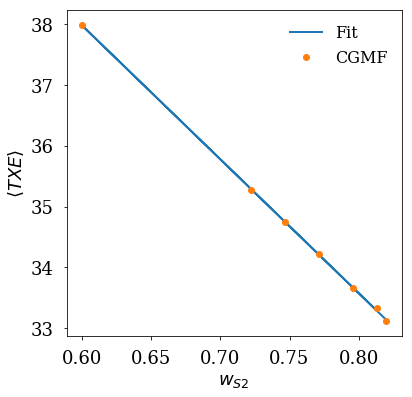

[-15.3929996   23.29367356]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 1.4E-03


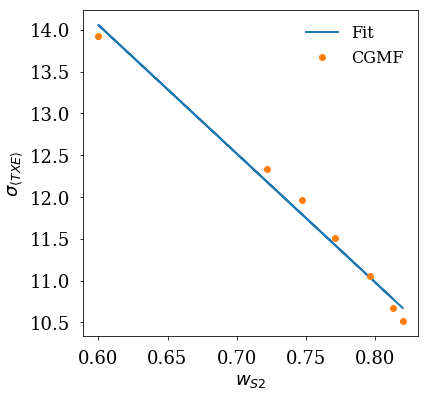

[  17.67589586  170.46952925]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 8.1E-06


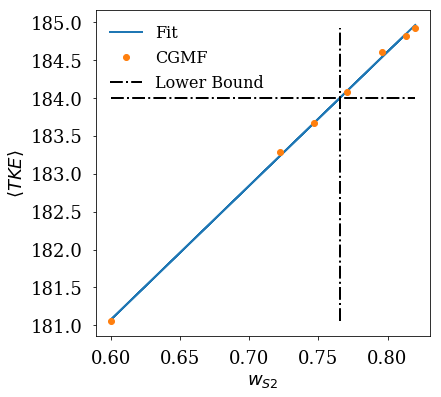

[-11.50907398  20.6230444 ]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 6.2E-04


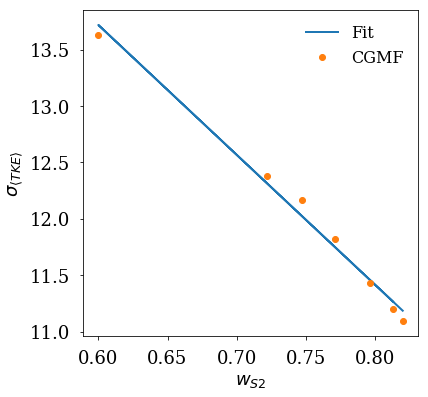

[ -1.16889464  11.77155798]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 5.3E-06


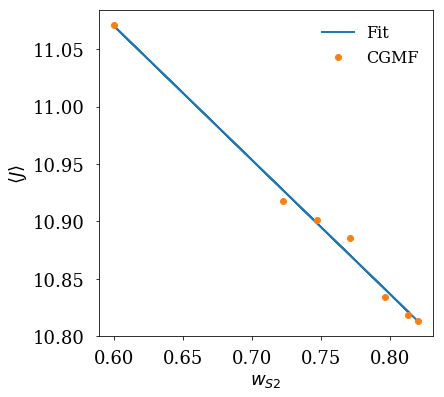

[-0.75973742  6.69529378]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 7.1E-06


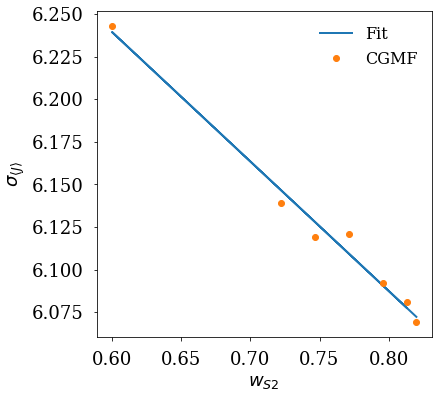

[-1.93364294  5.44876638]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\overline{\nu}$. 
chi^2/dof = 3.9E-07


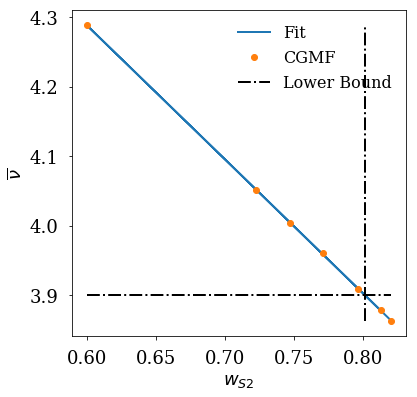

[-16.08152156  26.20579101]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 7.2E-06


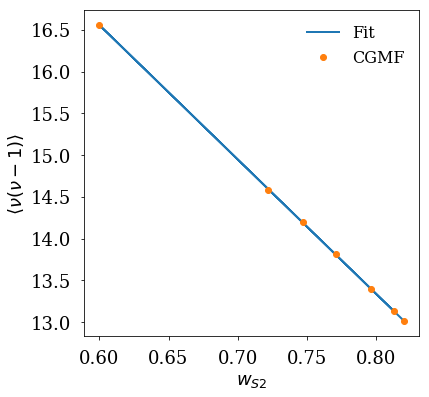

[ -84.23954144  106.69816341]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 7.5E-05


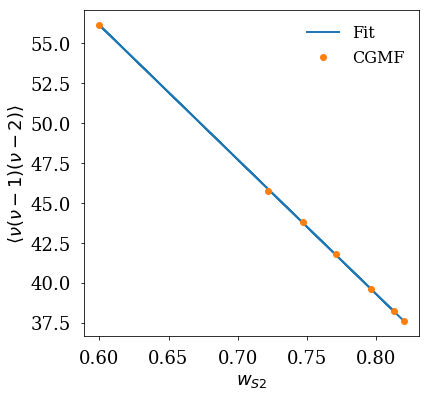

[ -0.83904612  10.03827629]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 4.1E-05


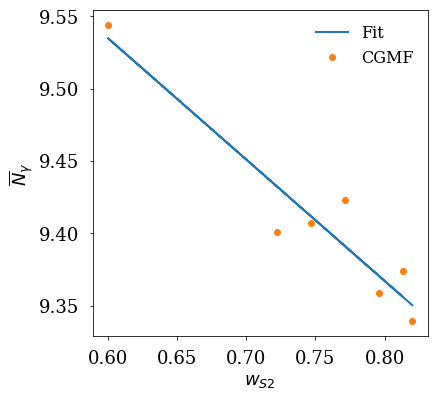

[ -16.79843987  106.17556852]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 1.8E-03


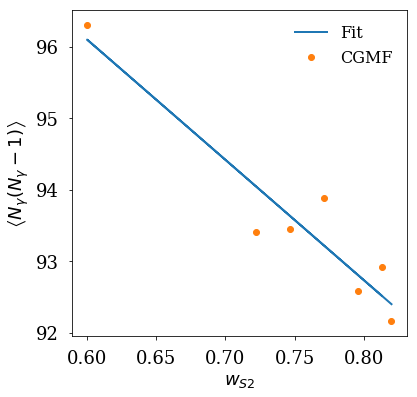

[ -263.52838399  1177.15586504]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 5.2E-02


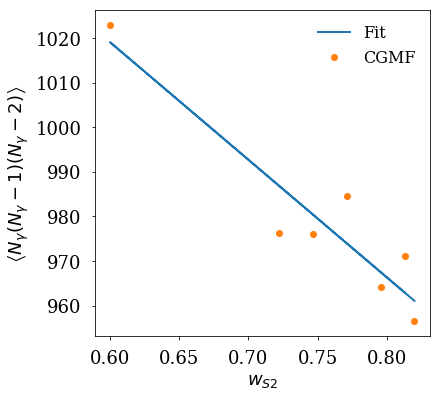

[-0.63212896  2.40666964]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 1.1E-05


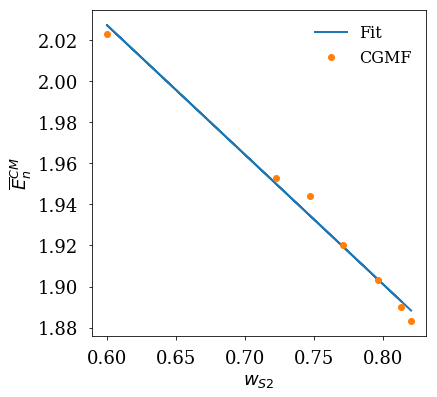

[-0.54534928  2.03506362]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 2.5E-05


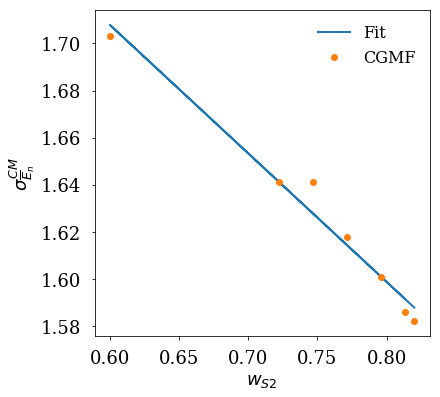

[-0.4900483   1.29800921]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 2.4E-06


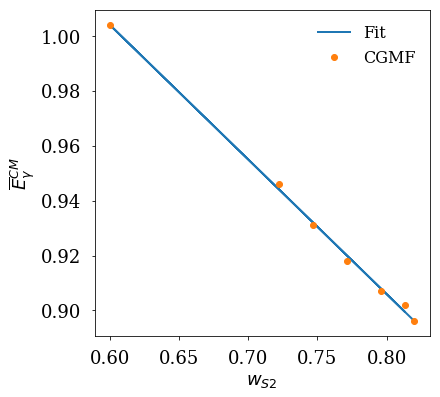

[-0.58429155  1.34666174]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 3.3E-06


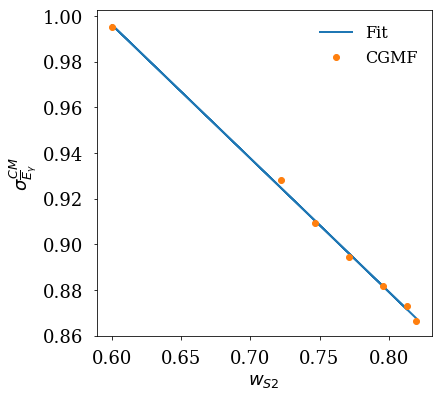

[-0.53037845  2.55079487]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 6.2E-06


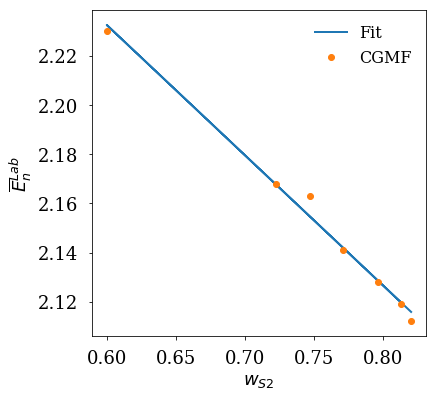

[-0.53819971  2.07311061]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 2.0E-05


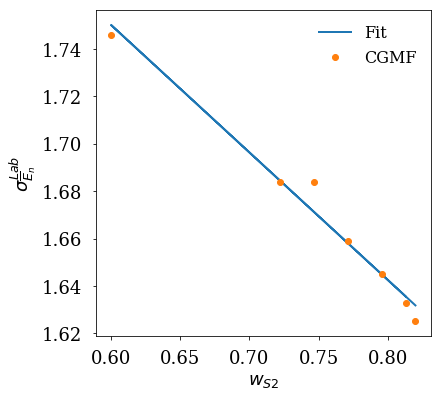

[-0.35475869  1.02174622]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 2.0E-06


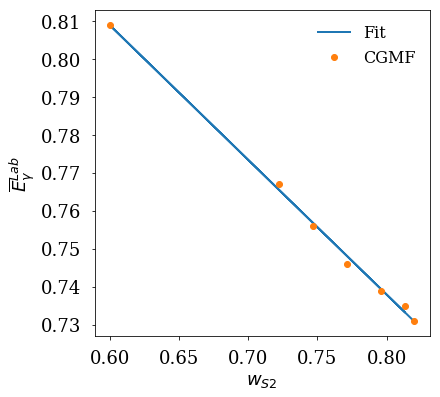

[-0.50877852  1.24469343]
ACCEPTABLE LINEAR FIT between $w_{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 3.4E-06


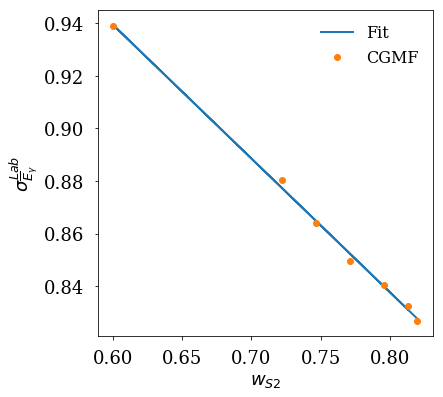

[ -5.18600083  34.22601635]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 3.1E-05


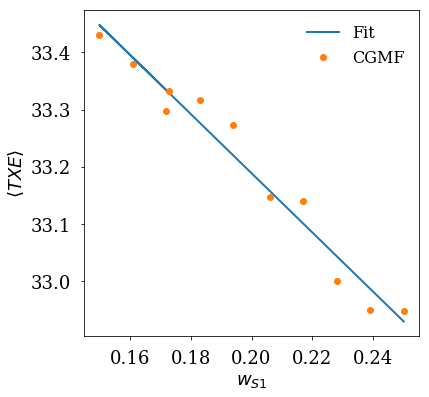

[ -0.69521432  10.81460916]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 1.1E-04


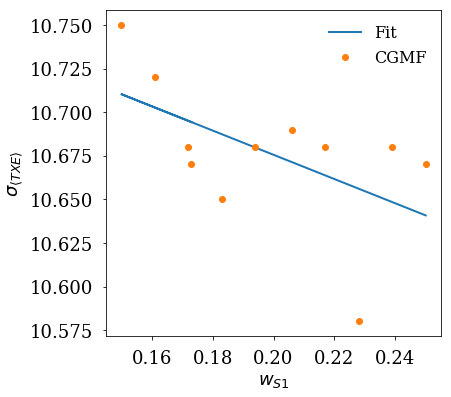

[  14.06906367  182.36362951]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 4.5E-06


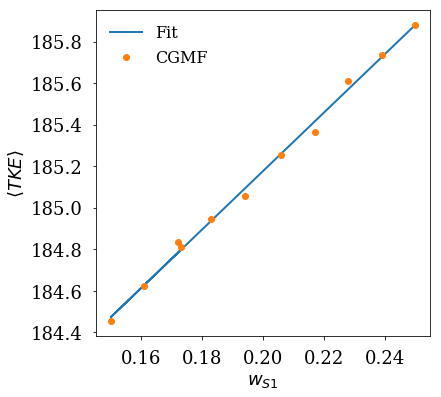

[  4.20266334  10.50069205]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 1.2E-04


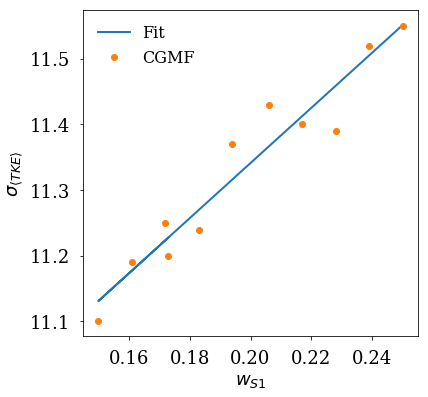

[ -0.70439451  10.94796811]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 1.5E-05


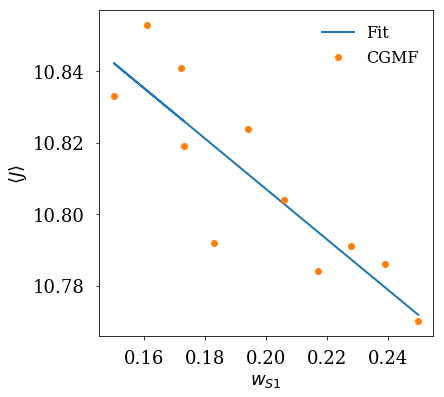

[-0.27594673  6.12069384]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 3.4E-05


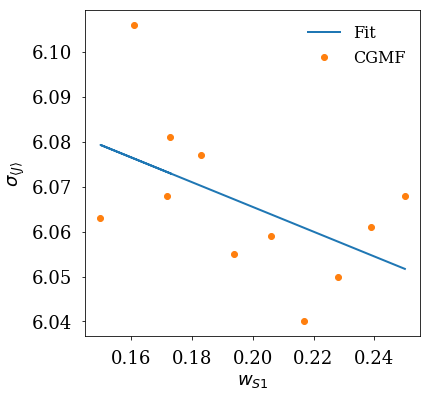

[-0.80744902  4.01959879]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\overline{\nu}$. 
chi^2/dof = 3.9E-06


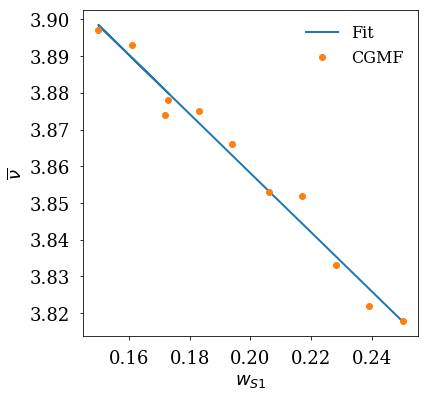

[ -5.60173949  14.13214363]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 5.5E-05


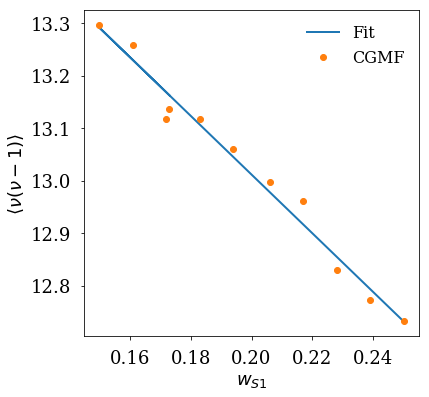

[-24.39612984  42.59289001]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 4.7E-04


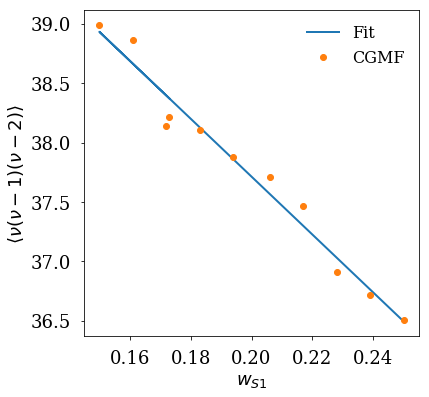

[-1.16209738  9.57311251]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 1.0E-05


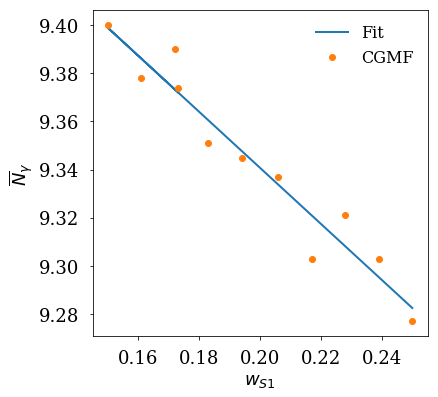

[-20.77834374  96.39503099]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 4.5E-04


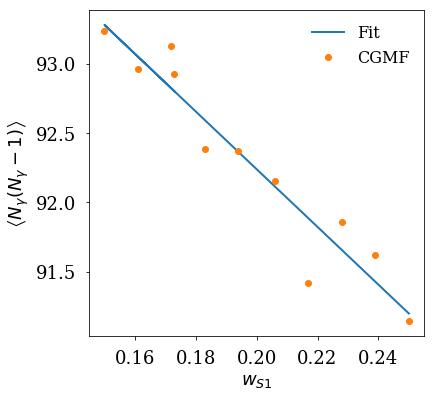

[ -289.11743654  1016.5856536 ]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 1.4E-02


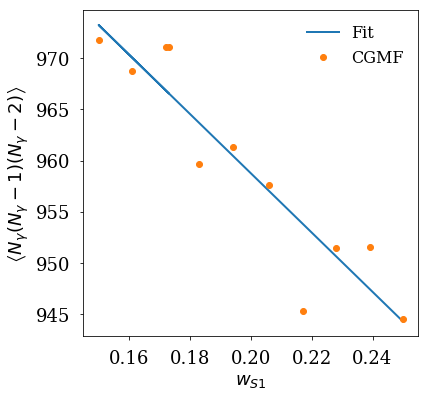

[ 0.1082397   1.87207228]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 2.9E-06


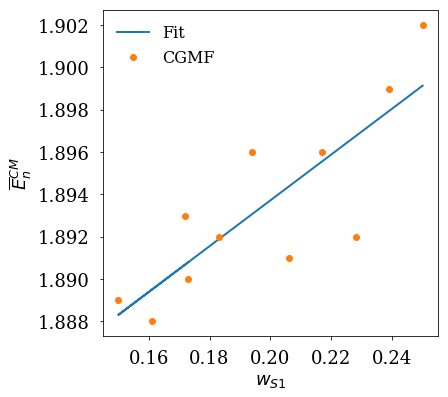

[ 0.07253433  1.57712572]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 3.7E-06


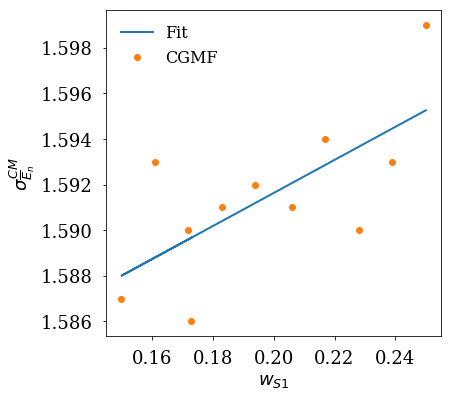

[ 0.05007907  0.89110711]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 1.3E-06


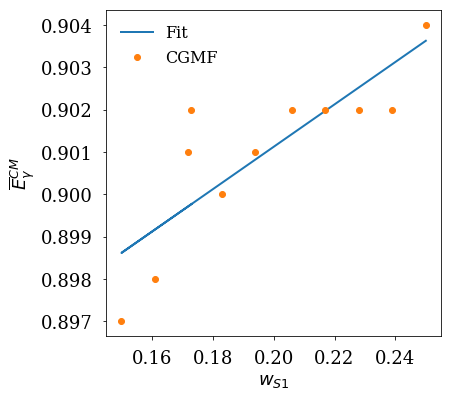

[ 0.03998502  0.86411023]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 1.8E-06


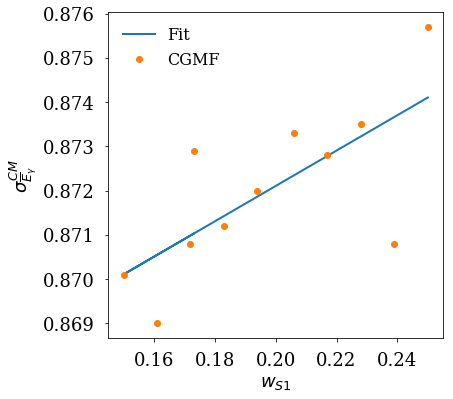

[ 0.09127757  2.10296853]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 5.0E-06


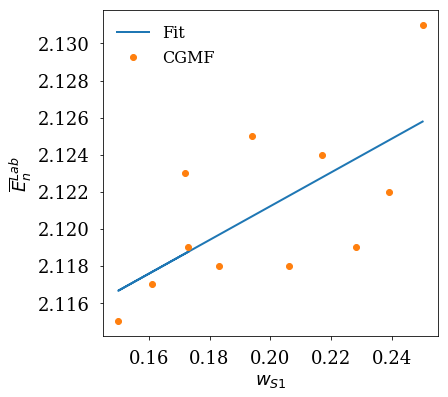

[ 0.03569705  1.62913003]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 4.1E-06


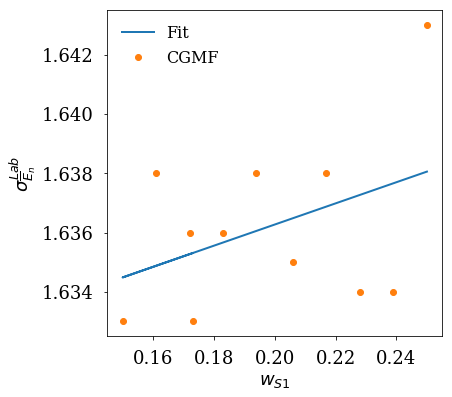

[ 0.06070745  0.7228257 ]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 1.4E-06


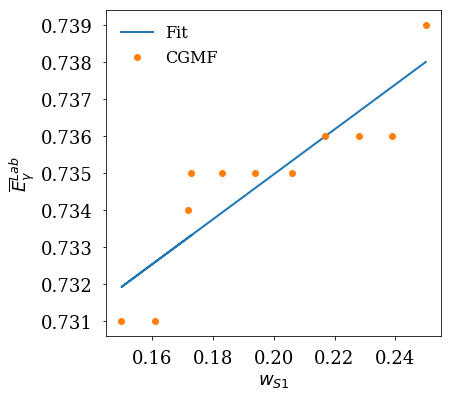

[ 0.06058926  0.81973087]
ACCEPTABLE LINEAR FIT between $w_{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 1.8E-06


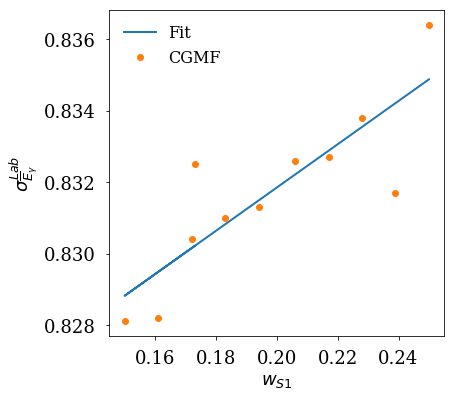

[ 27.01901318  32.98554401]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 7.7E-05


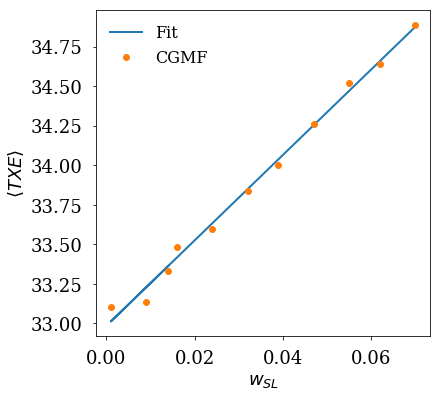

[ 19.74326148  10.43679423]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 6.9E-05


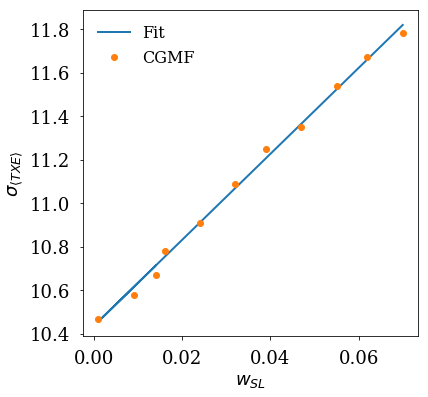

[ -32.20385108  185.20120191]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 1.8E-05


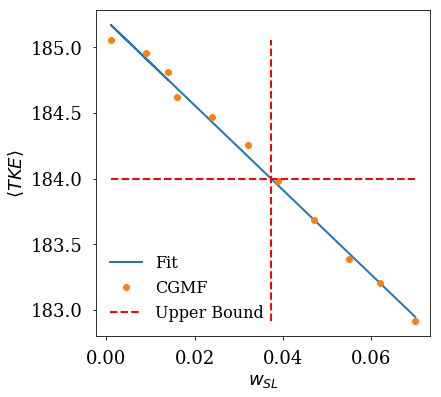

[  7.93242448  11.12844867]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 6.1E-05


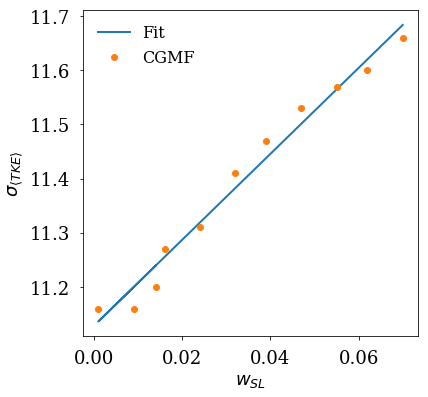

[  1.79867479  10.79757173]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 3.7E-05


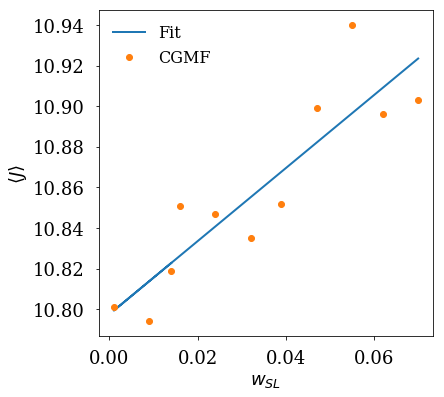

[ 0.9017681   6.07165887]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 1.8E-05


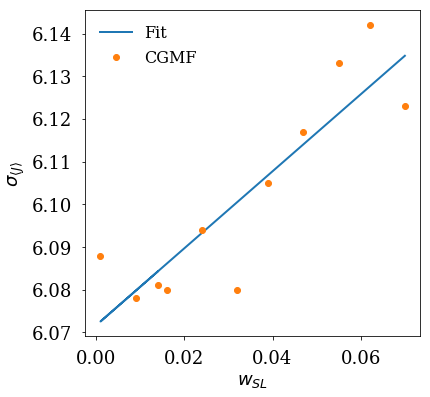

[ 2.88500398  3.84440305]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\overline{\nu}$. 
chi^2/dof = 1.2E-05


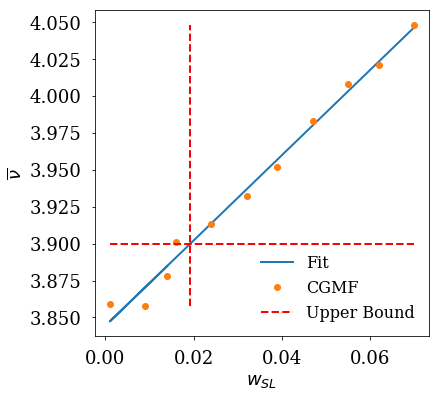

[ 22.58060275  12.87770524]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 2.1E-04


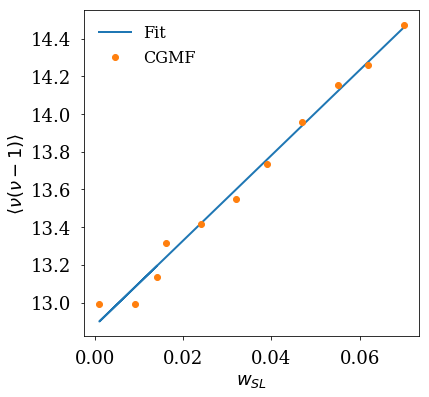

[ 111.94559012   36.96164339]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 1.7E-03


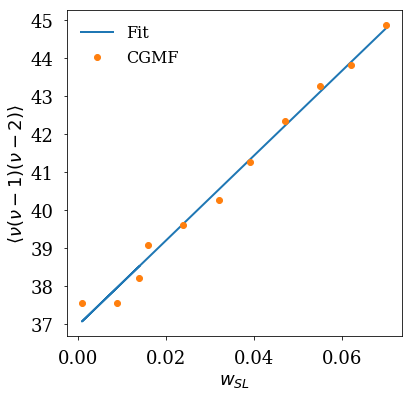

[ 1.53271513  9.34558437]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 1.7E-05


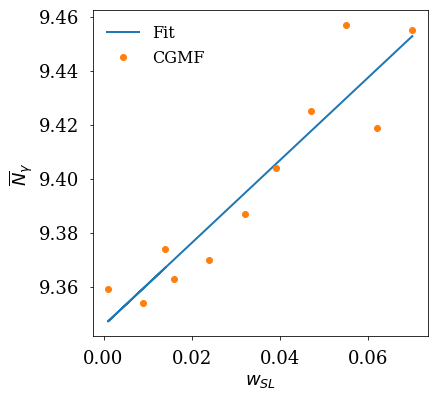

[ 28.44199163  92.34308228]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 8.9E-04


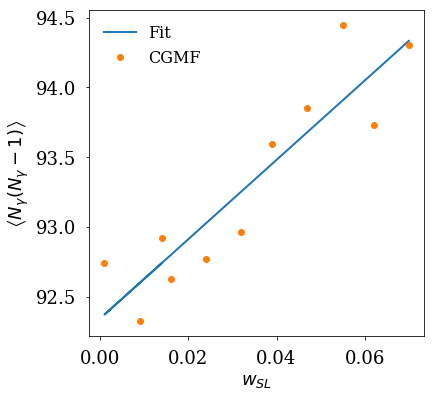

[ 407.76253417  960.99960226]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 2.8E-02


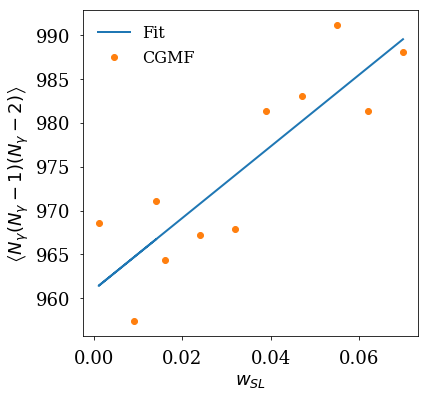

[ 0.52939345  1.88560489]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 4.3E-06


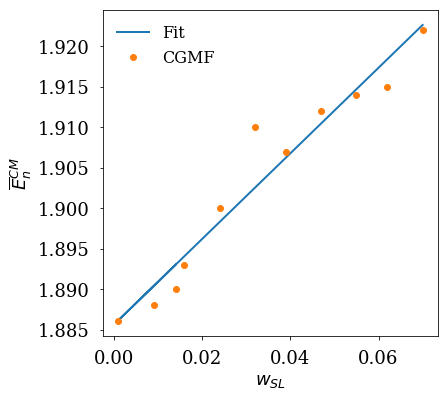

[ 0.56873465  1.58083063]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 7.8E-06


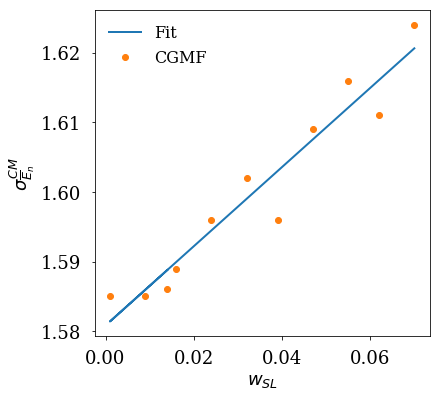

[ 0.38519428  0.89489666]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 5.6E-06


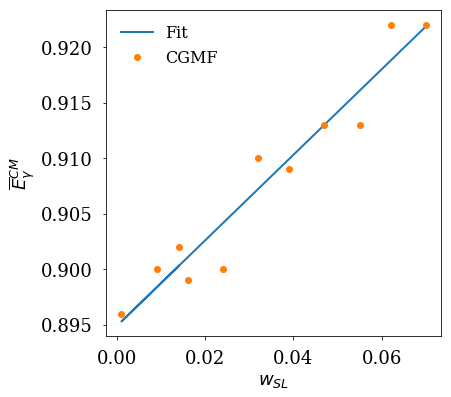

[ 0.5811356   0.86288736]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 8.0E-06


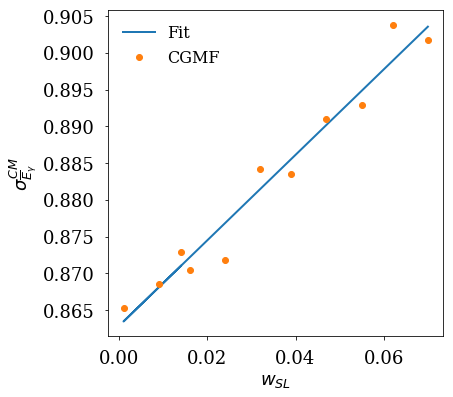

[ 0.43001972  2.11330207]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 3.1E-06


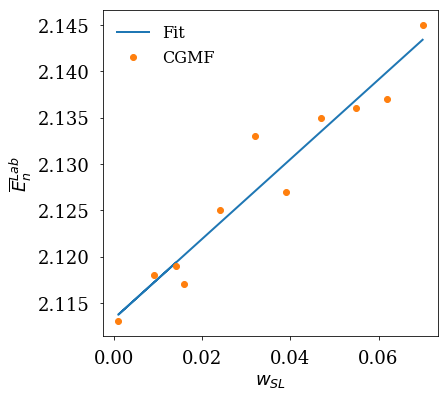

[ 0.5510536   1.62624193]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 8.7E-06


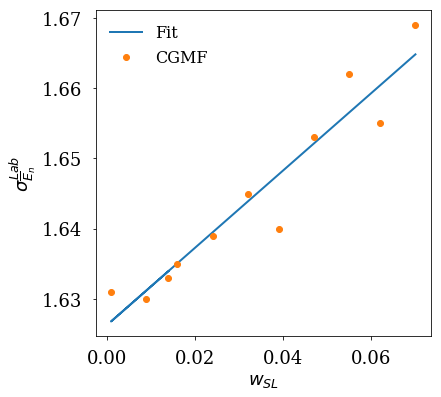

[ 0.2520847   0.73027098]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 3.2E-06


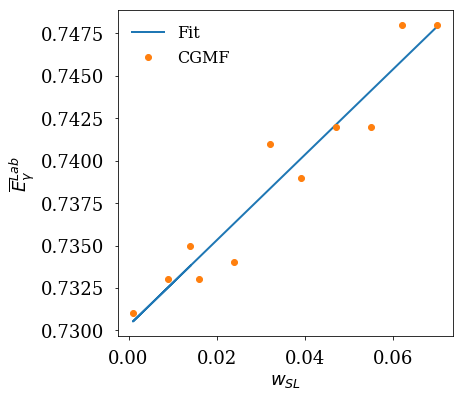

[ 0.46588526  0.82377167]
ACCEPTABLE LINEAR FIT between $w_{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 7.2E-06


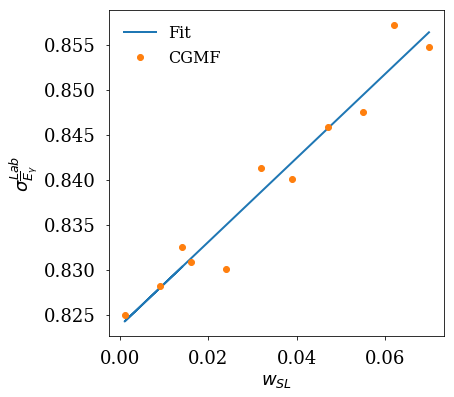

[  0.10280844  31.96871626]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 4.4E-04


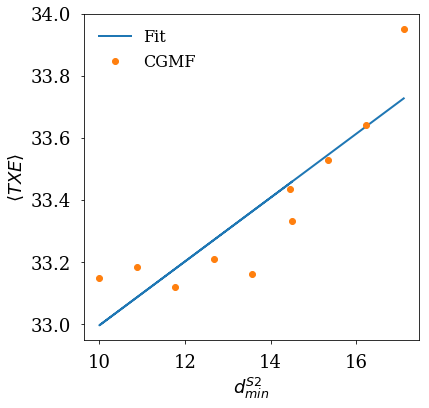

[ -0.84259827  22.4444451 ]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 1.3E-02


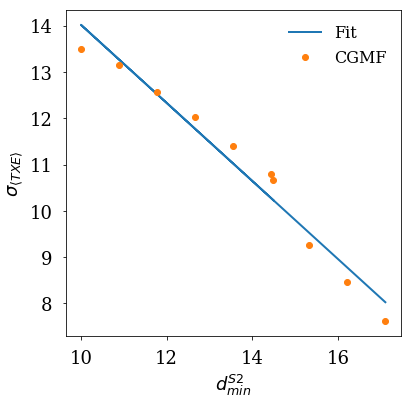

[ -1.04378407e-01   1.86180913e+02]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 6.8E-05


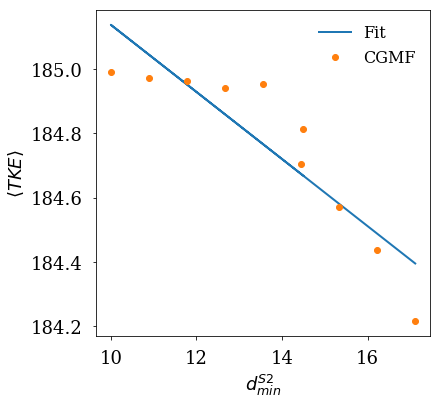

[ -0.79283074  22.31634321]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 7.5E-03


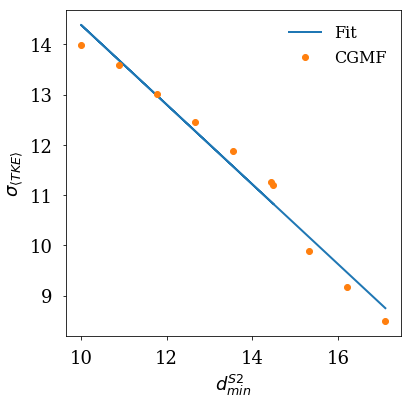

[  0.02243172  10.52291818]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 5.7E-05


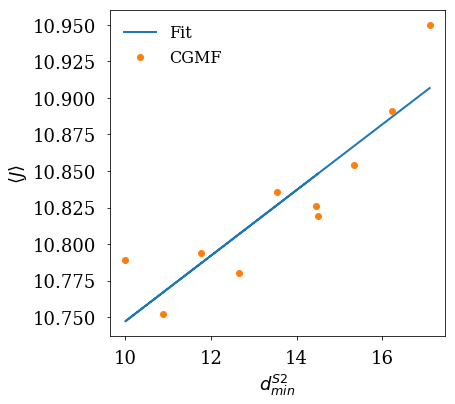

[ -4.80218368e-04   6.09705474e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 1.5E-05


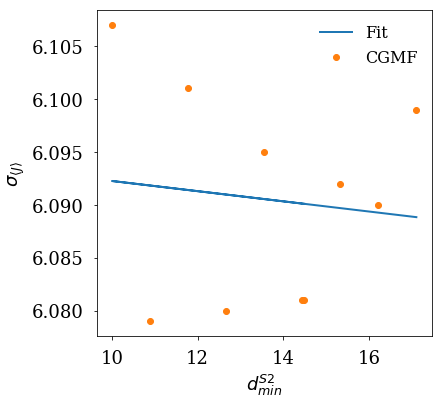

[ 0.02552517  3.5332942 ]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\overline{\nu}$. 
chi^2/dof = 1.0E-04


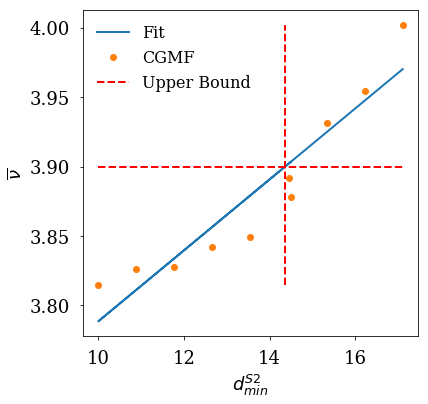

[ -0.11467639  14.88397543]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 5.7E-04


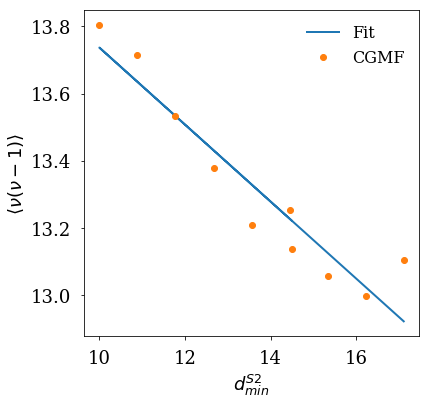

[ -1.68391447  62.33609055]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 4.1E-03


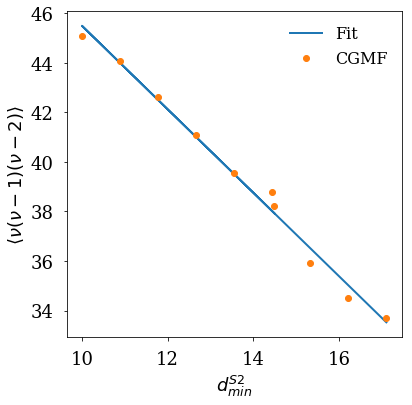

[ -5.99596033e-03   9.45124186e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 1.3E-05


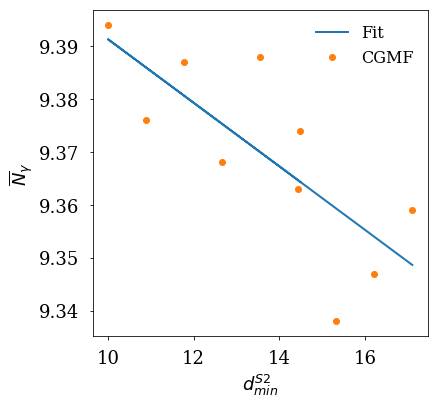

[ -8.56035692e-02   9.39778459e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 5.6E-04


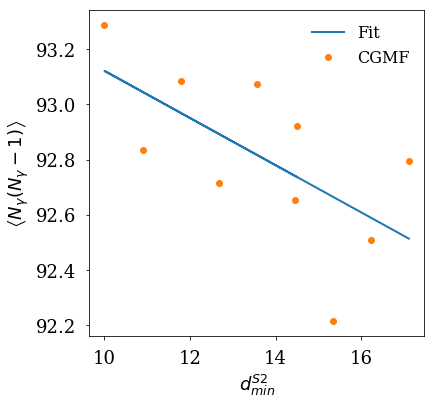

[ -7.69958346e-01   9.78462546e+02]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 1.8E-02


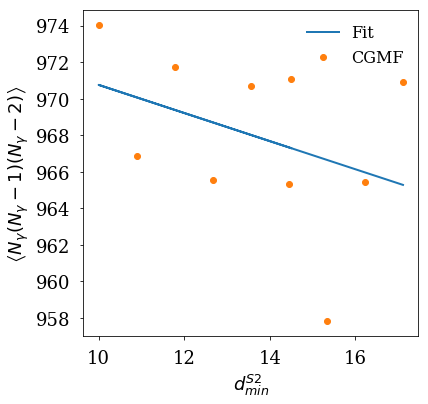

[-0.01280316  2.07065678]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 2.4E-05


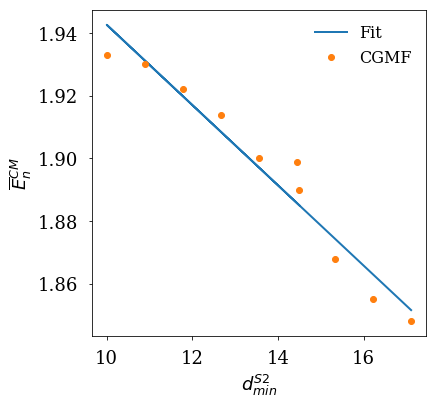

[-0.00687956  1.68750262]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 1.9E-05


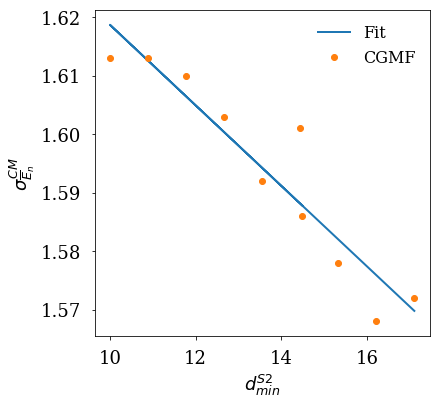

[-0.00334281  0.94692773]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 6.4E-06


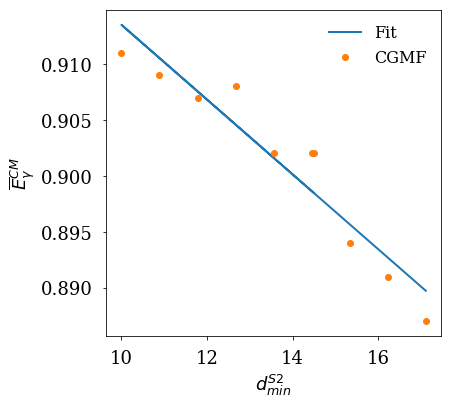

[-0.00452722  0.93581429]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 3.0E-06


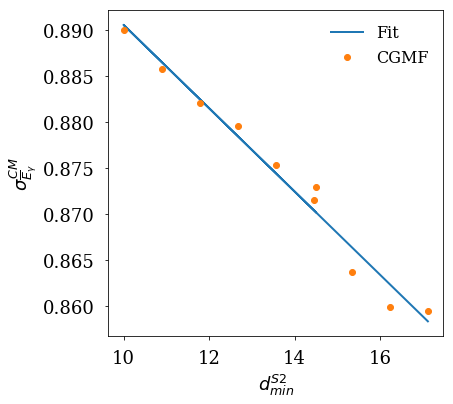

[-0.00613961  2.20650266]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 4.4E-06


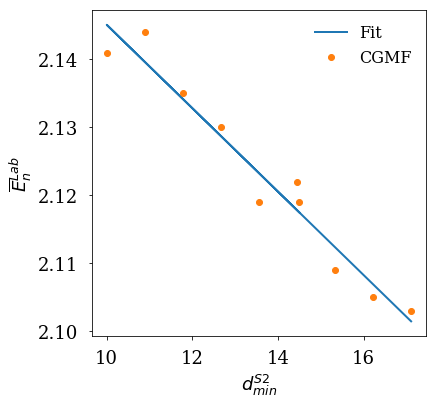

[-0.00673385  1.73071364]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 1.5E-05


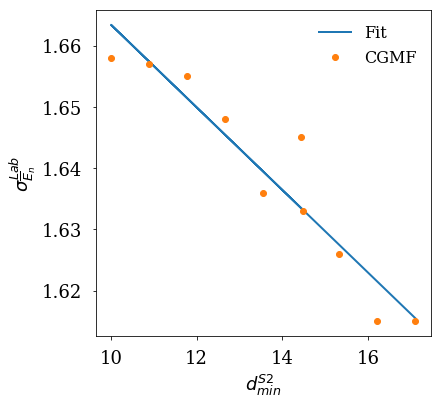

[-0.00234304  0.76608128]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 4.1E-06


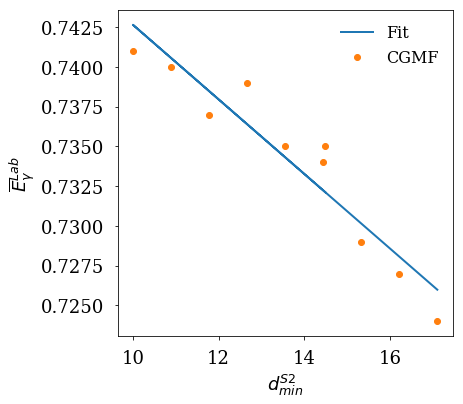

[-0.00392119  0.88642228]
ACCEPTABLE LINEAR FIT between $d_{min}^{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 2.4E-06


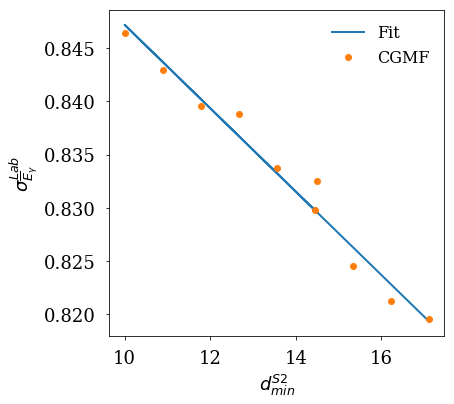

[  4.54721777e-03   3.32922980e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 2.9E-05


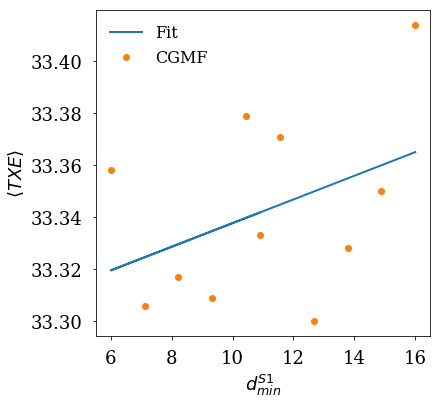

[ -0.06842705  11.43929848]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 1.1E-04


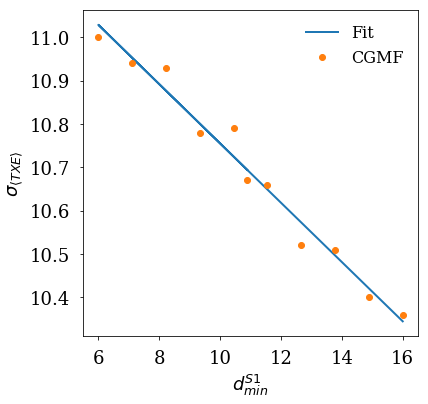

[ -1.34268008e-03   1.84791574e+02]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 3.2E-06


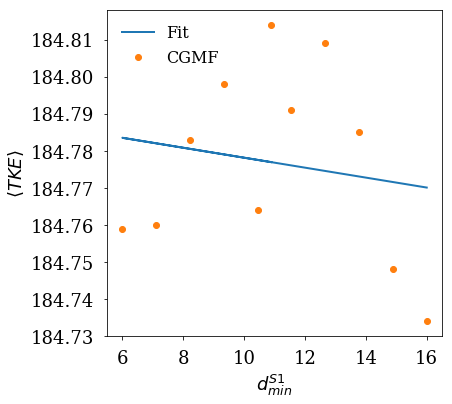

[ -0.06914477  11.96900449]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 1.3E-04


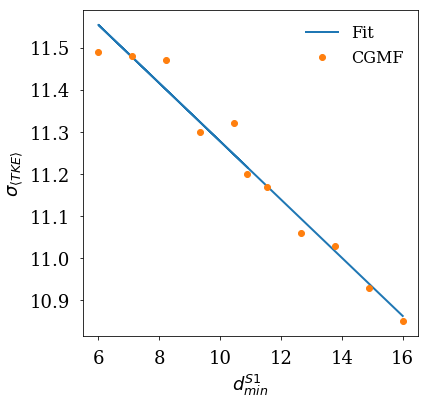

[ -1.39270379e-03   1.08375788e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 1.3E-05


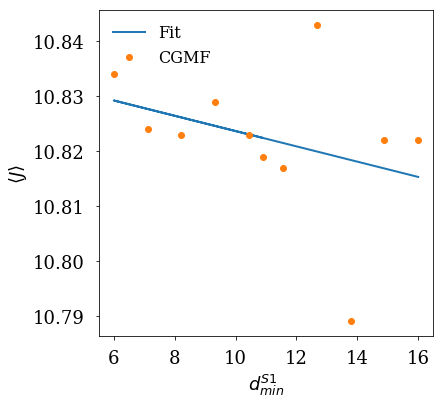

[ -1.95943041e-03   6.09598904e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 3.0E-05


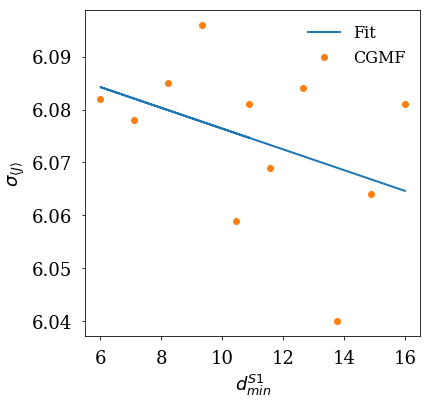

[  1.00849792e-03   3.87164370e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\overline{\nu}$. 
chi^2/dof = 3.3E-06


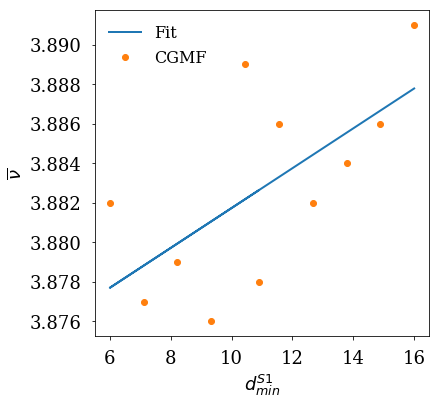

[ -0.01785255  13.36102093]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 5.8E-05


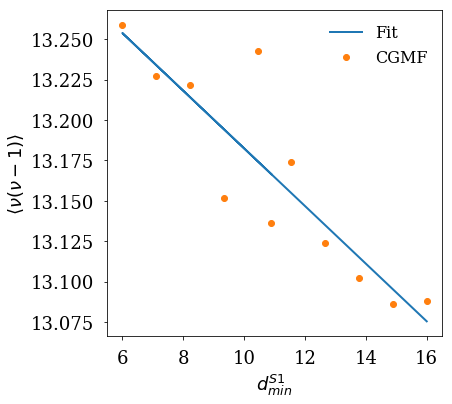

[ -0.12365371  39.67634041]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 7.1E-04


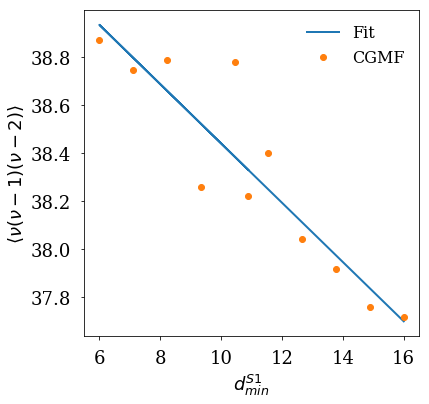

[ -1.84111636e-03   9.38087057e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 7.7E-06


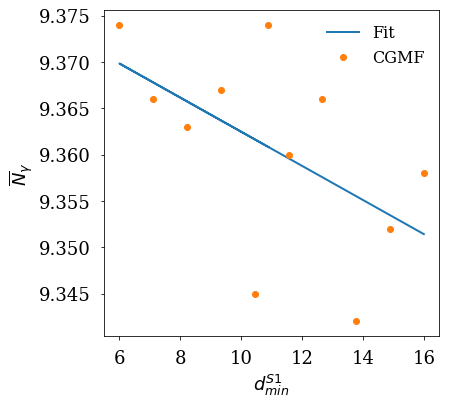

[ -3.82562021e-02   9.30389881e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 4.1E-04


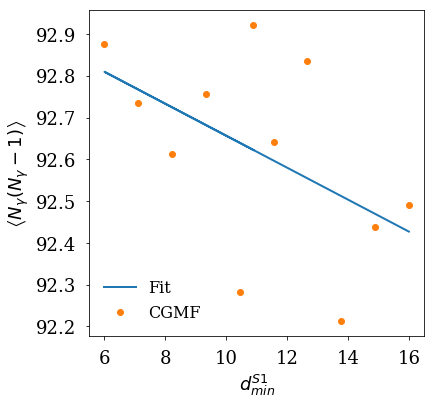

[ -6.86061593e-01   9.72295396e+02]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 1.4E-02


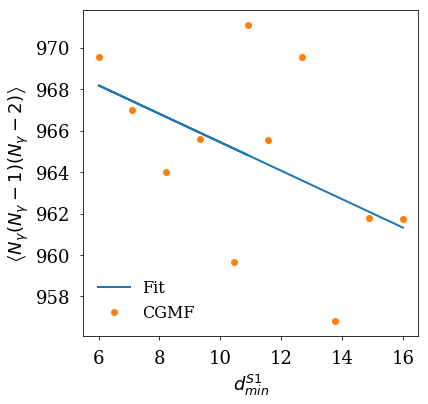

[ -5.36560683e-04   1.89907872e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 2.8E-06


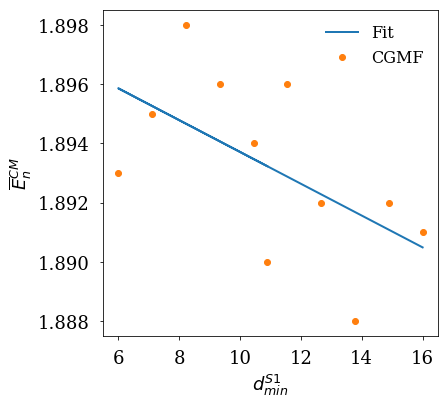

[ -7.62889551e-04   1.60011157e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 7.2E-06


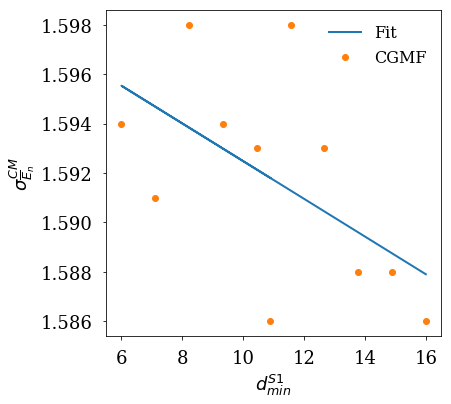

[  1.99579945e-04   8.97715671e-01]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 1.3E-06


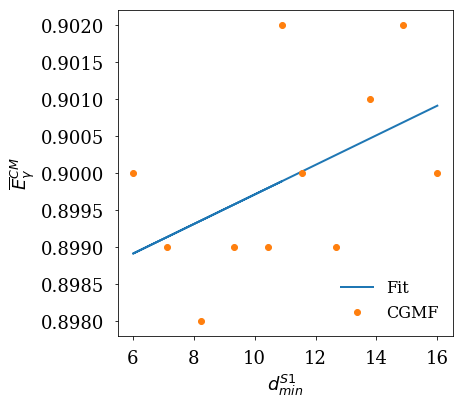

[  1.19942958e-04   8.70545441e-01]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 4.5E-06


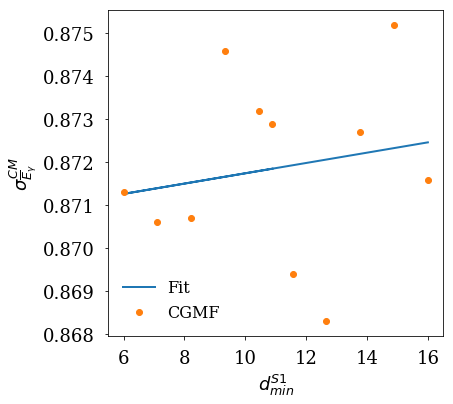

[ -2.28864188e-04   2.12169708e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 1.7E-06


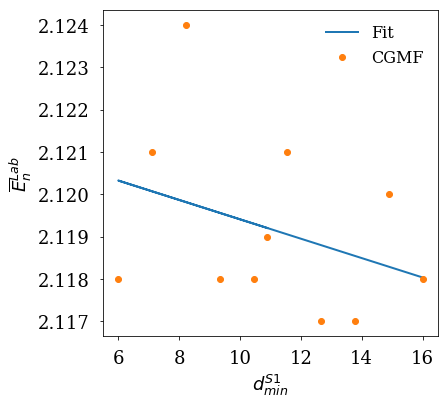

[ -6.35456913e-04   1.64243833e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 5.0E-06


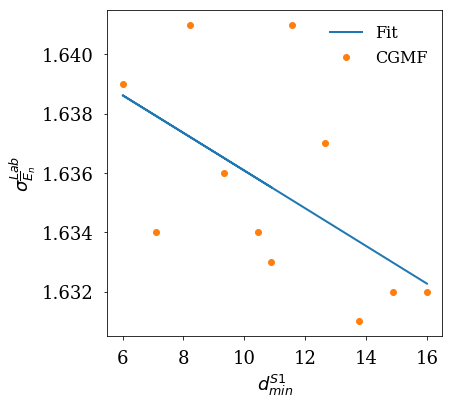

[  2.32866621e-04   7.30895299e-01]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 1.1E-06


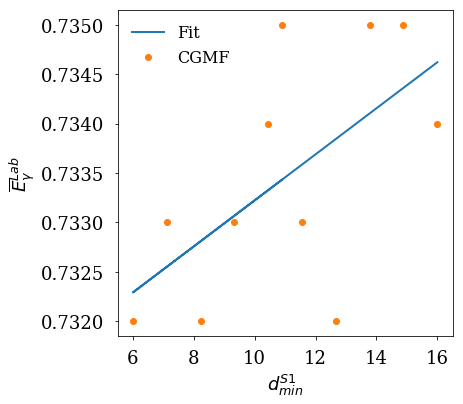

[  2.56188533e-04   8.28038987e-01]
ACCEPTABLE LINEAR FIT between $d_{min}^{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 4.5E-06


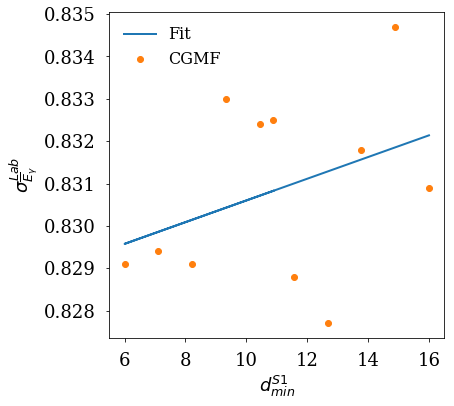

[  3.94979090e-03   3.32442290e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 5.2E-05


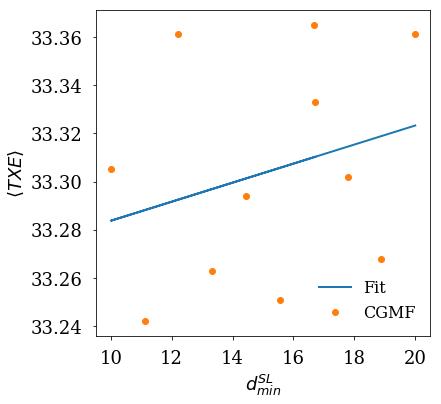

[ -1.21196329e-03   1.06974591e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 1.3E-04


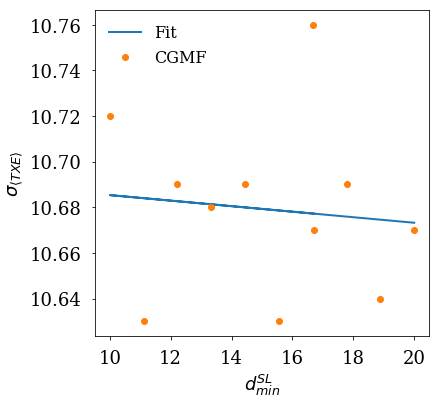

[ -6.85671727e-03   1.84921191e+02]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 6.7E-06


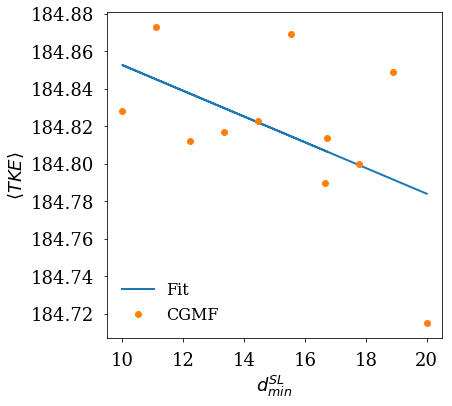

[  4.79946196e-04   1.12218170e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 6.5E-05


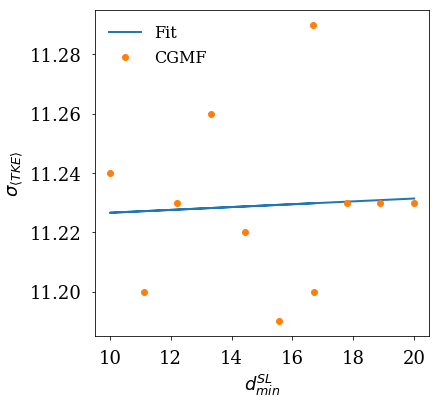

[  2.13861847e-03   1.07929513e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 1.6E-05


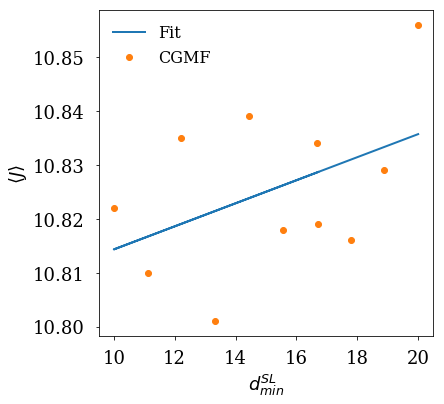

[  1.50192789e-04   6.07345099e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 1.6E-05


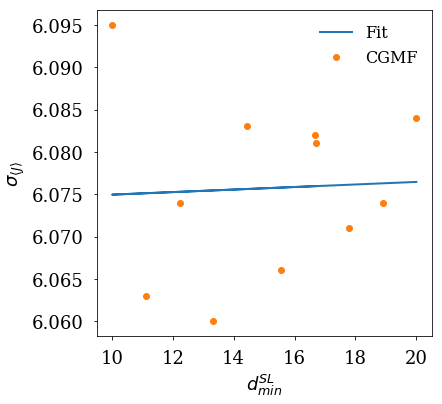

[  4.14553700e-04   3.87171714e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\overline{\nu}$. 
chi^2/dof = 6.0E-06


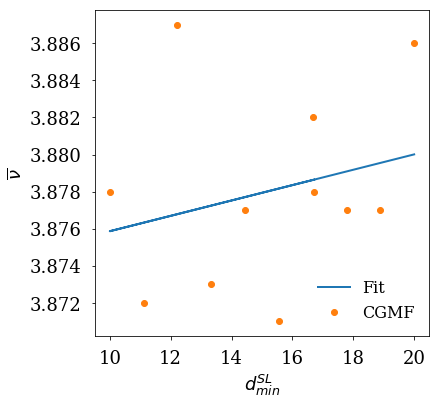

[  4.19531542e-03   1.30781442e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 1.1E-04


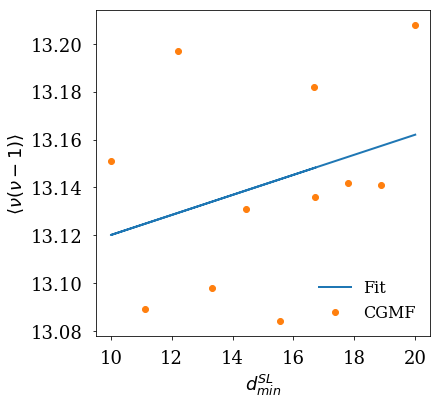

[  2.43724478e-02   3.78831633e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 8.2E-04


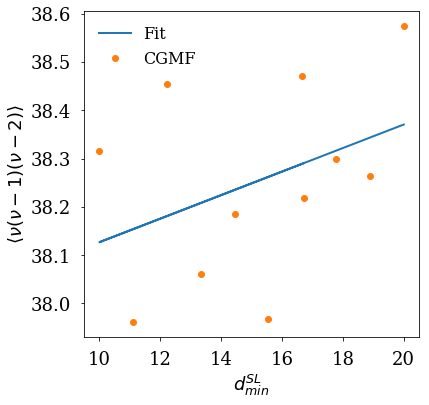

[  1.98164013e-03   9.33851226e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 1.8E-05


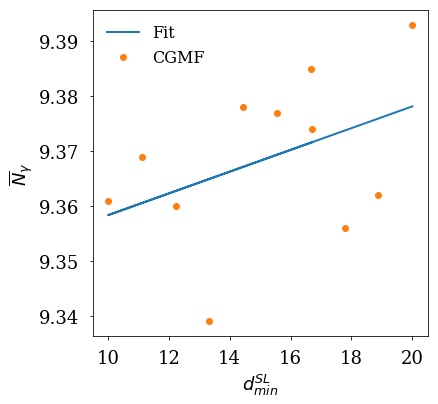

[  3.87913573e-02   9.21534524e+01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 9.0E-04


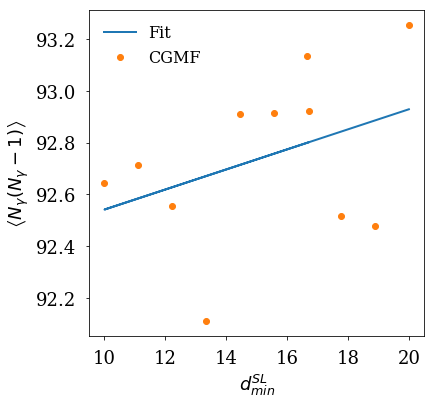

[  6.35518245e-01   9.56625532e+02]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 2.7E-02


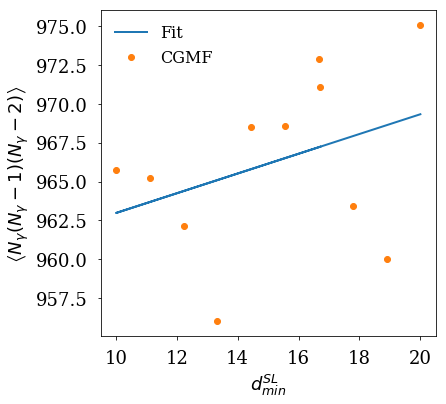

[ -1.33974253e-04   1.89339411e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 3.1E-06


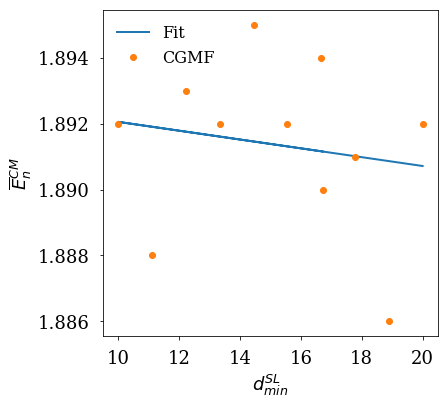

[ -5.97090500e-04   1.59904934e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 9.8E-06


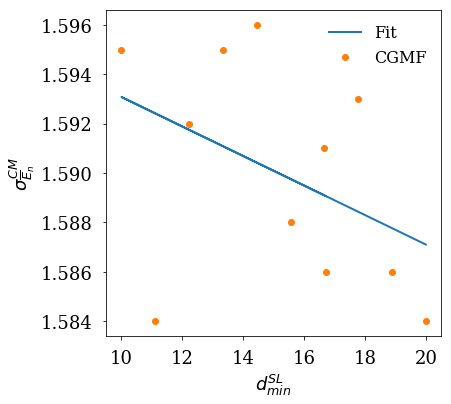

[  4.17152423e-05   8.98822321e-01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 4.1E-06


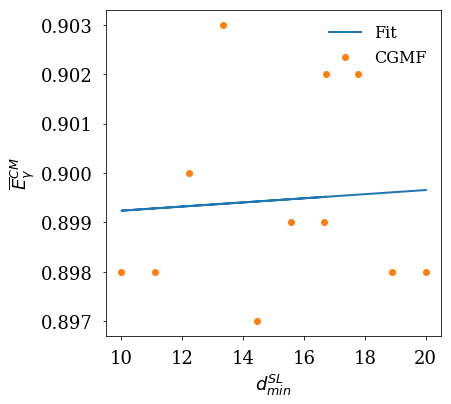

[  1.02644944e-04   8.69362523e-01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 4.9E-06


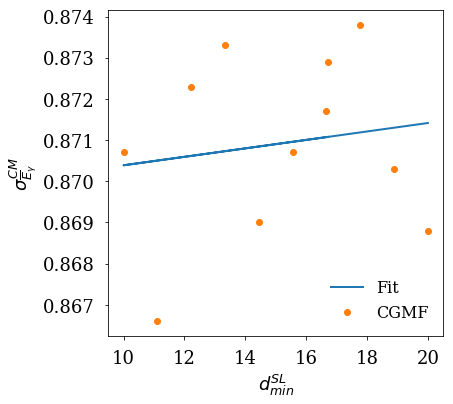

[ -1.33534175e-04   2.12138744e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 3.0E-06


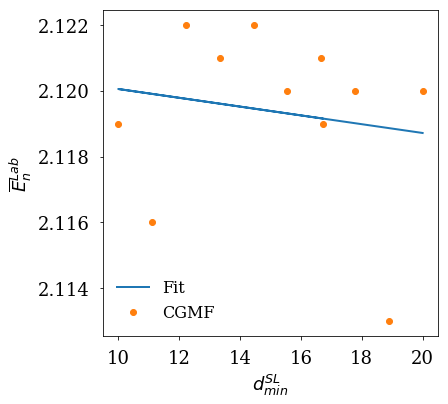

[ -3.57667935e-04   1.64078435e+00]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 9.2E-06


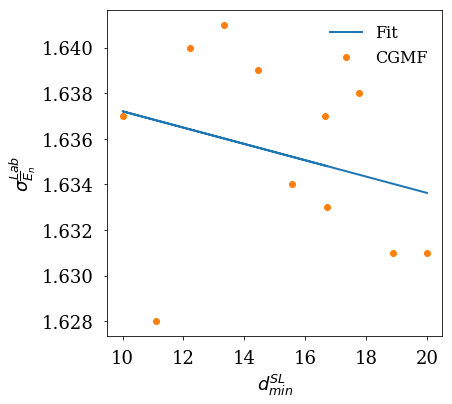

[ -3.10063820e-05   7.33469924e-01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 1.7E-06


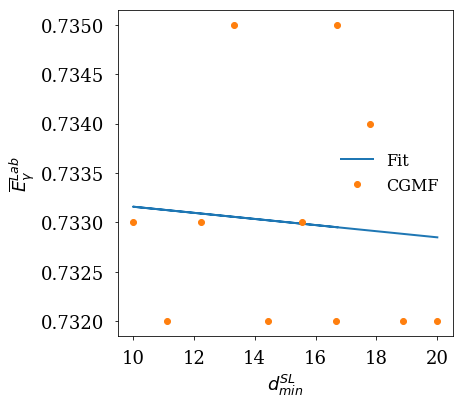

[  1.02862896e-04   8.28686493e-01]
ACCEPTABLE LINEAR FIT between $d_{min}^{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 3.5E-06


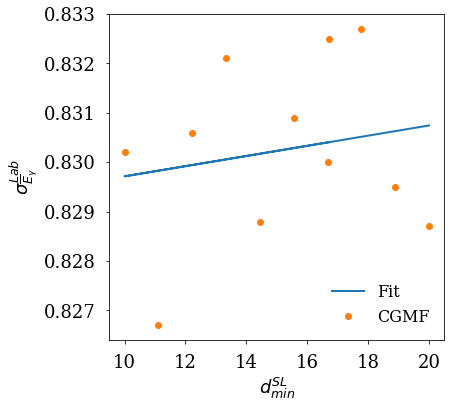

[  6.64565322 -88.57264783]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 7.9E-02


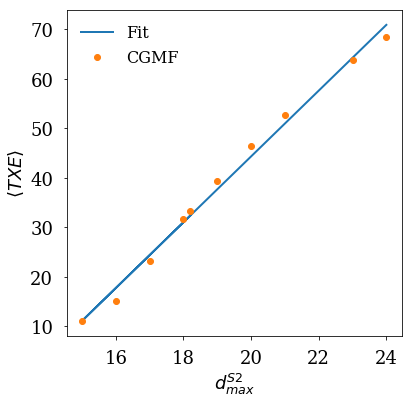

[ 1.08522406 -7.3119181 ]
BAD LINEAR FIT between $d_{max}^{S2}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 0.2


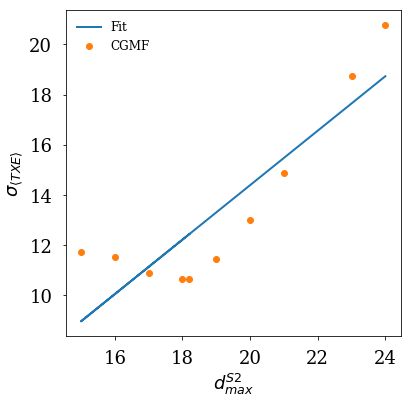

[  -6.65501934  306.87913171]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 1.5E-02


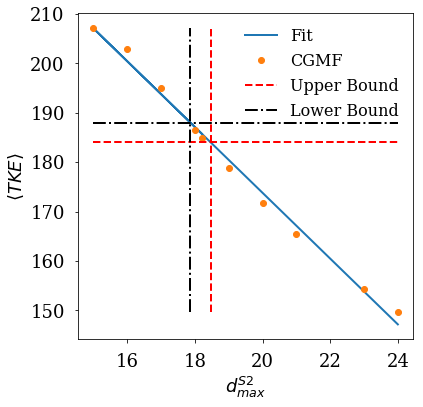

[  1.60946266 -16.49186985]
BAD LINEAR FIT between $d_{max}^{S2}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 0.2


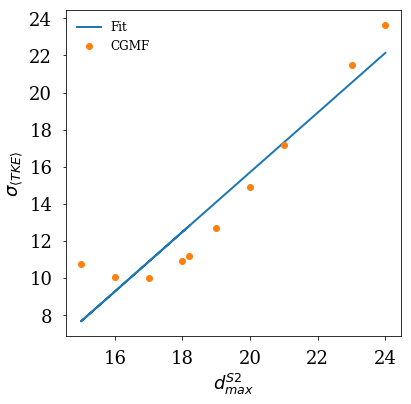

[ 0.49686047  1.43162906]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 1.2E-02


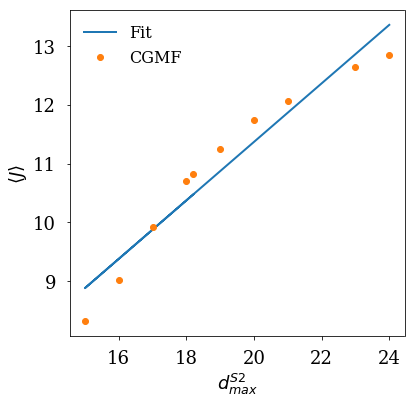

[ 0.23393255  1.76161606]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 1.9E-03


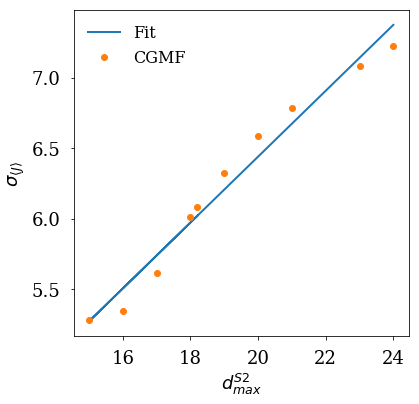

[ 0.69768339 -9.15788547]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\overline{\nu}$. 
chi^2/dof = 6.4E-02


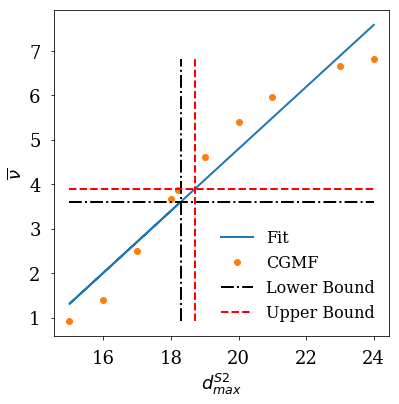

[  5.16140484 -78.96982505]
BAD LINEAR FIT between $d_{max}^{S2}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = -0.6


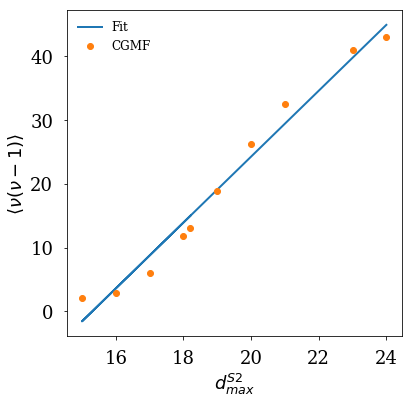

[  29.69829921 -479.28046018]
BAD LINEAR FIT between $d_{max}^{S2}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = -3.7


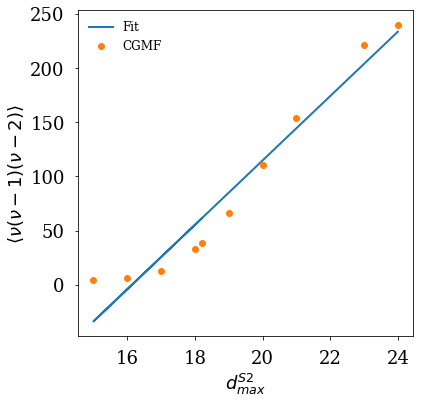

[ 0.48336924  0.52608677]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 8.1E-03


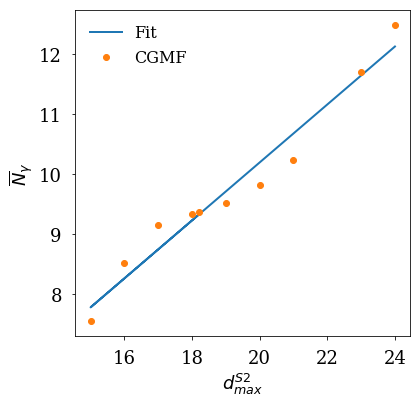

[ 10.20971856 -92.12050274]
BAD LINEAR FIT between $d_{max}^{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 0.4


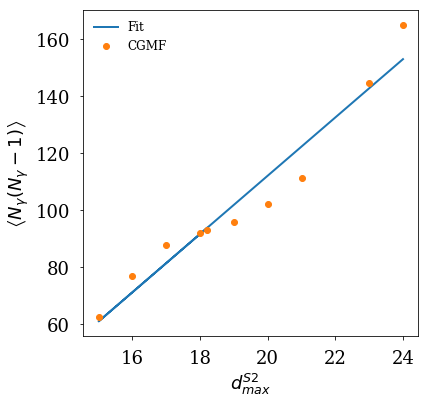

[  173.62821998 -2155.06901727]
BAD LINEAR FIT between $d_{max}^{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 16.2


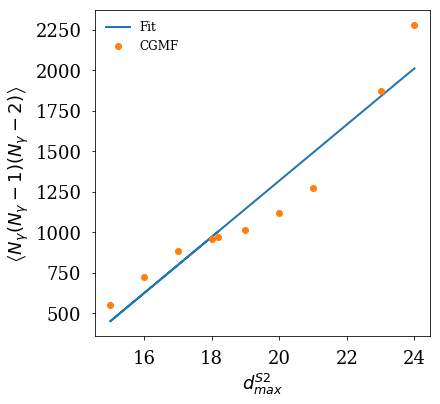

[ 0.08481087  0.44108227]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 3.5E-03


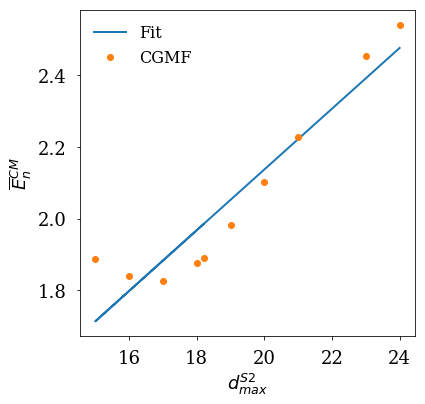

[ 0.06027625  0.5410939 ]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 1.5E-03


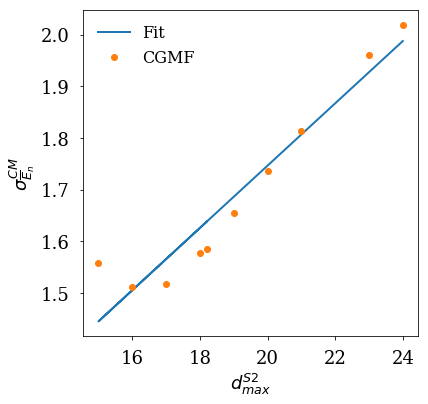

[ 0.10949296 -1.0237491 ]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 1.0E-02


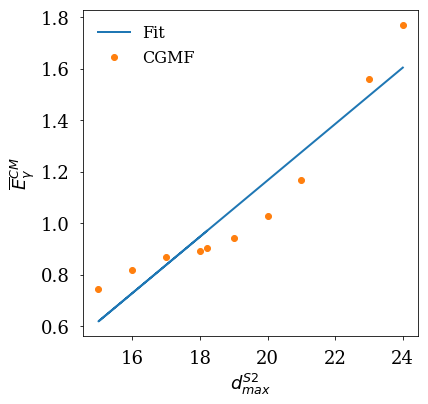

[ 0.10094045 -0.89001187]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 9.3E-03


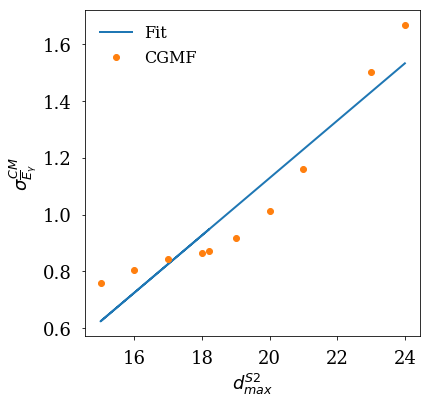

[ 0.07314887  0.83576441]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 1.4E-03


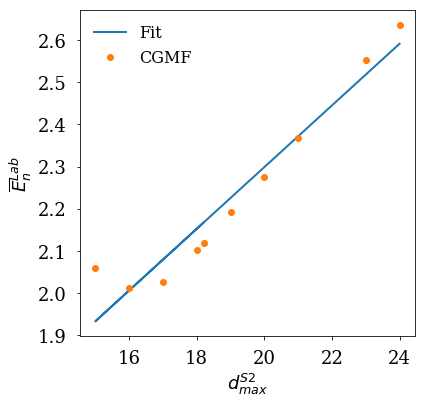

[ 0.06153051  0.56001202]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 1.4E-03


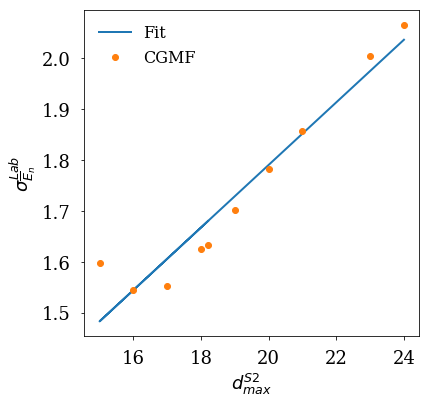

[ 0.07443557 -0.57733783]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 5.1E-03


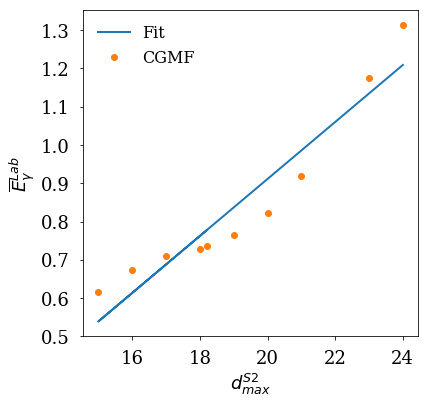

[ 0.09195584 -0.7743024 ]
ACCEPTABLE LINEAR FIT between $d_{max}^{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 8.8E-03


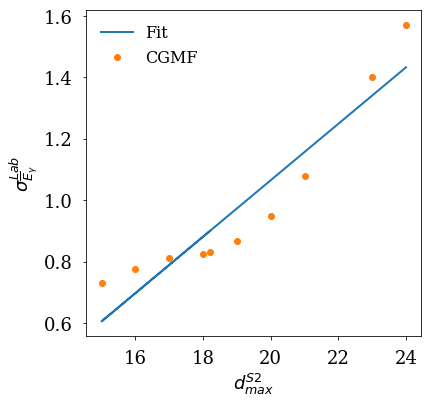

[ 1.42603087  8.94611442]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 1.5E-02


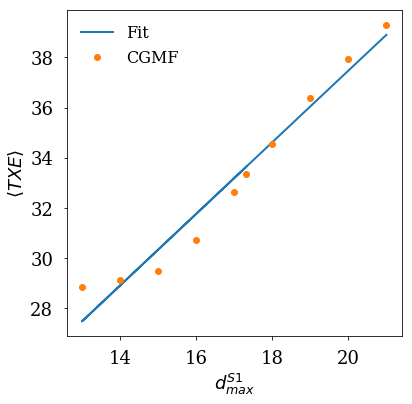

[ -0.31046042  18.26985495]
BAD LINEAR FIT between $d_{max}^{S1}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 0.2


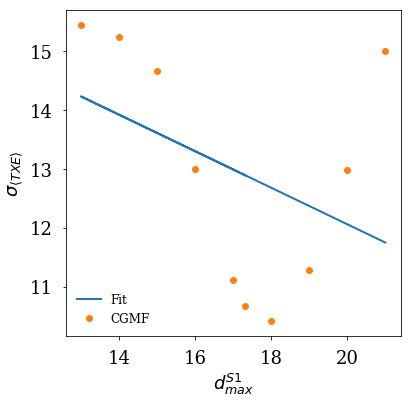

[  -1.44096499  209.45044803]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 2.3E-03


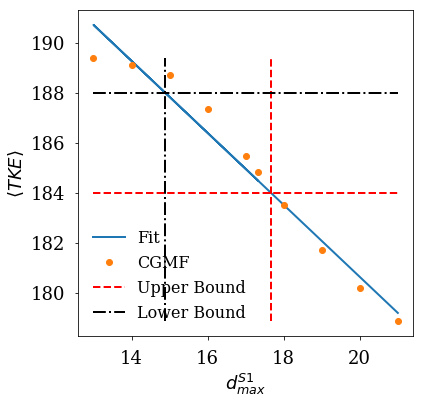

[ -1.09457174  31.95787424]
BAD LINEAR FIT between $d_{max}^{S1}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 0.2


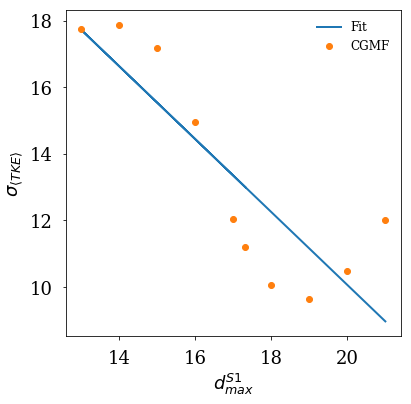

[ 0.14157331  8.29718099]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 3.6E-04


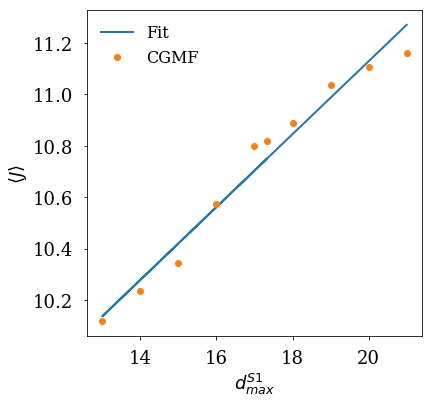

[ 0.02432296  5.70492406]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 3.6E-04


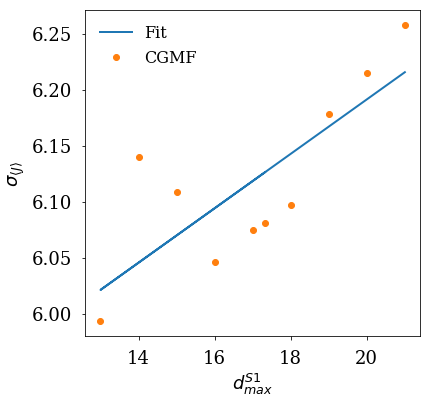

[ 0.15872501  1.13304794]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\overline{\nu}$. 
chi^2/dof = 1.8E-03


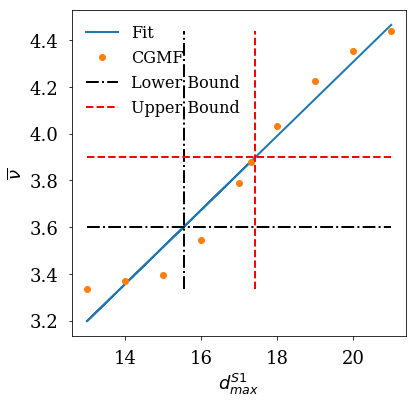

[ 0.80471756  0.04400911]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 4.3E-02


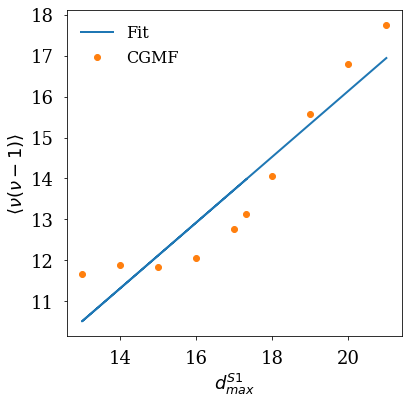

[  3.32754753 -13.93138787]
BAD LINEAR FIT between $d_{max}^{S1}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 0.5


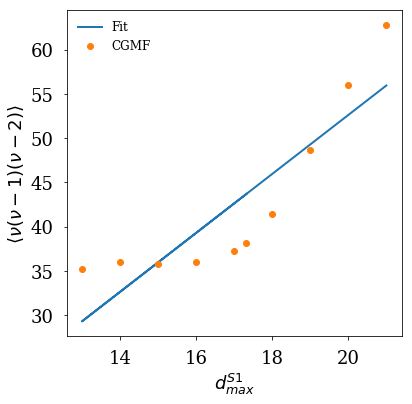

[ 0.13435607  6.98040714]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 5.8E-04


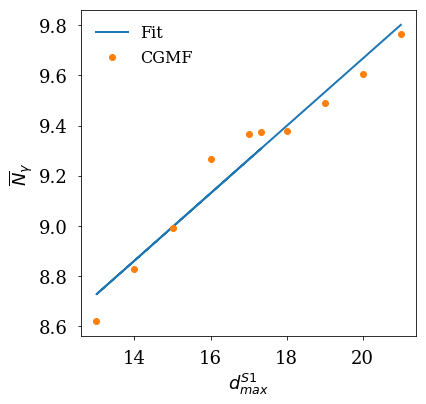

[  2.14782098  55.04266867]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 8.5E-03


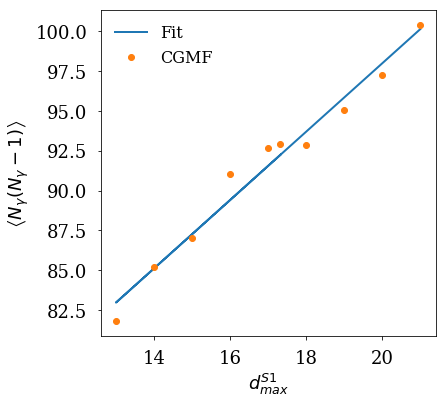

[  28.60574051  469.85244593]
BAD LINEAR FIT between $d_{max}^{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 0.1


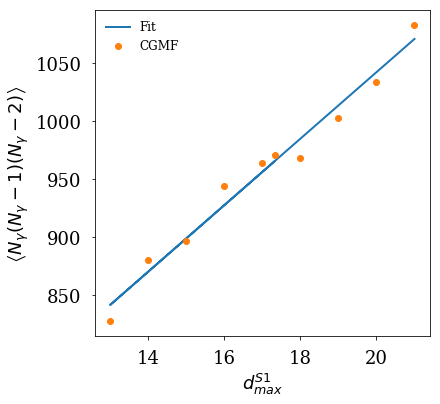

[ 0.01850037  1.60969607]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 6.8E-04


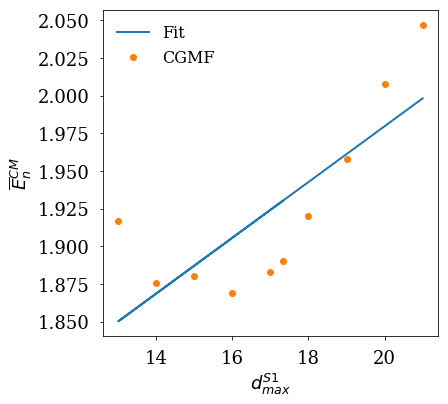

[ 0.01559469  1.3570865 ]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 9.1E-04


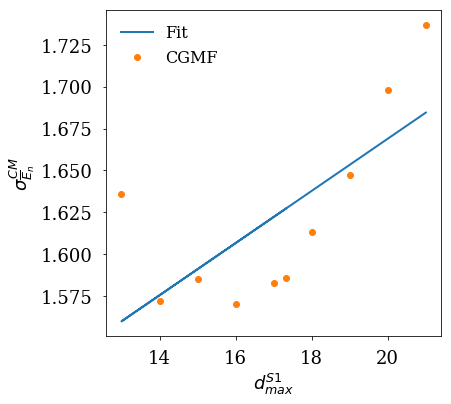

[ 0.01932561  0.58104036]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 4.3E-04


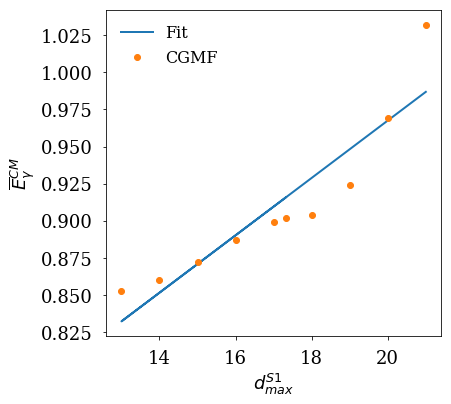

[ 0.02162692  0.52545376]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 1.4E-03


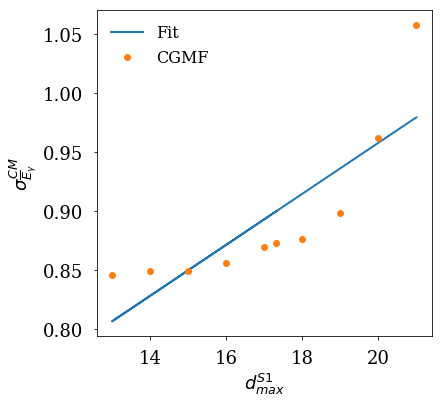

[ 0.01658408  1.86253497]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 4.5E-04


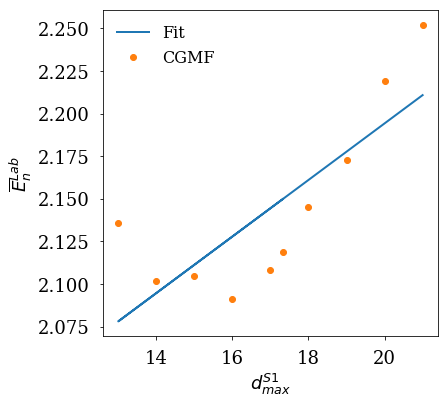

[ 0.01566235  1.39963411]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 8.2E-04


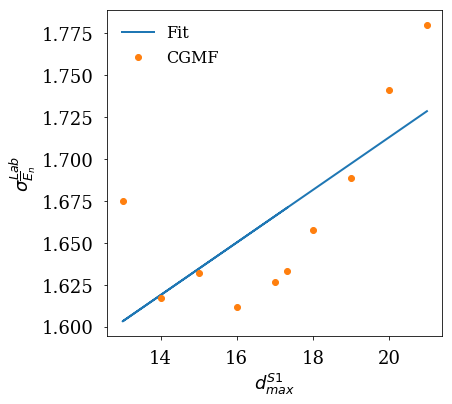

[ 0.01364583  0.50558016]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 1.9E-04


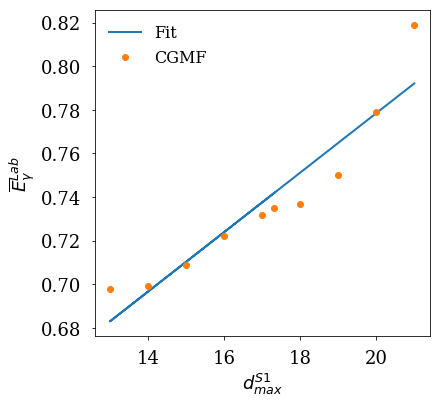

[ 0.01881035  0.52701645]
ACCEPTABLE LINEAR FIT between $d_{max}^{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 9.2E-04


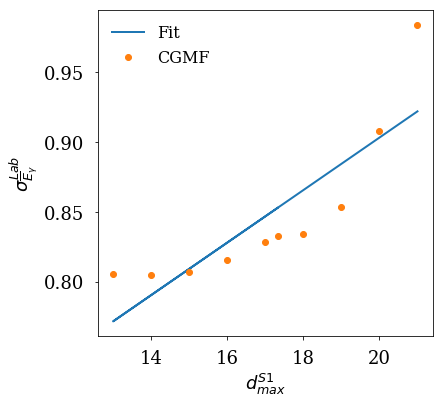

[  0.09410789  31.80589605]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 5.7E-04


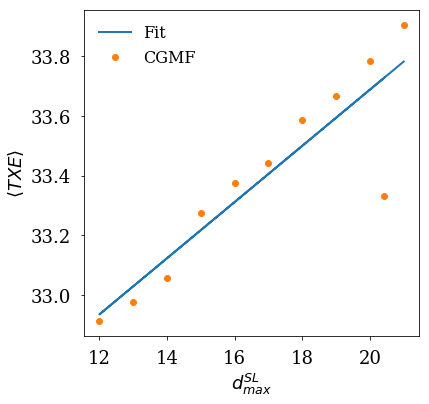

[ 0.18874746  7.9001022 ]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 1.4E-02


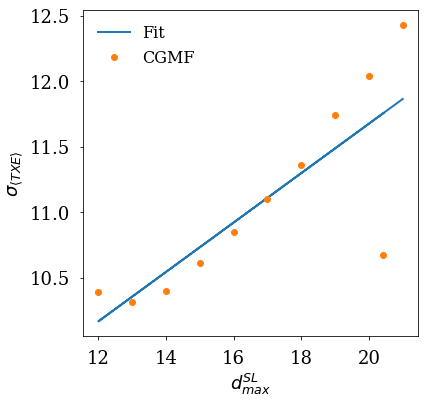

[ -9.48782105e-02   1.86312544e+02]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 1.3E-04


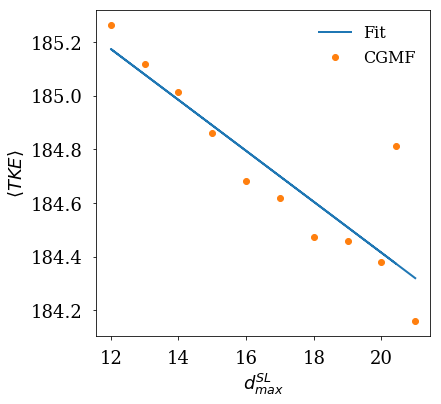

[ 0.15918978  8.90744705]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 1.2E-02


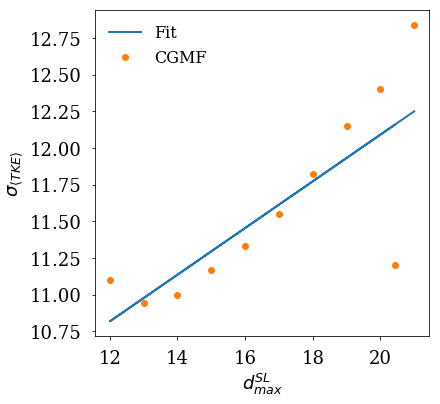

[  7.86968297e-03   1.06898862e+01]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 2.5E-05


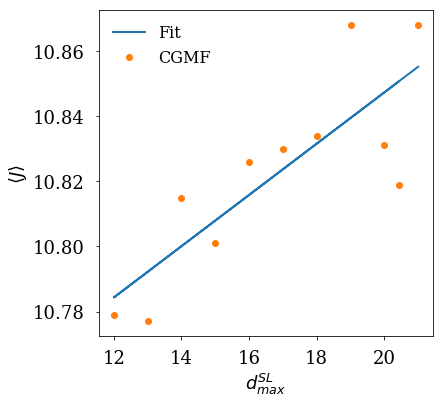

[  4.64597839e-03   6.00168274e+00]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 4.2E-05


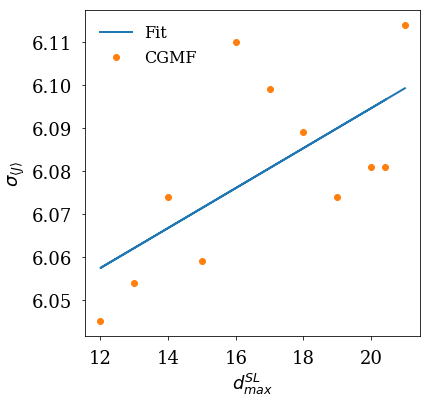

[ 0.00690023  3.765501  ]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\overline{\nu}$. 
chi^2/dof = 3.3E-05


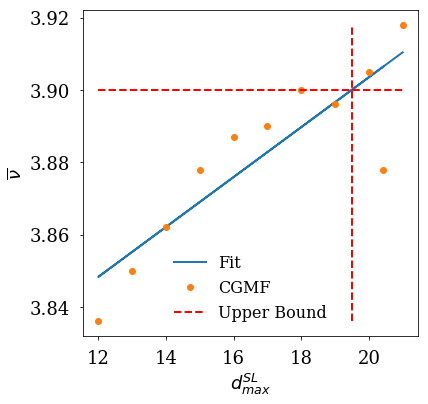

[  0.06446626  12.11365591]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 8.9E-04


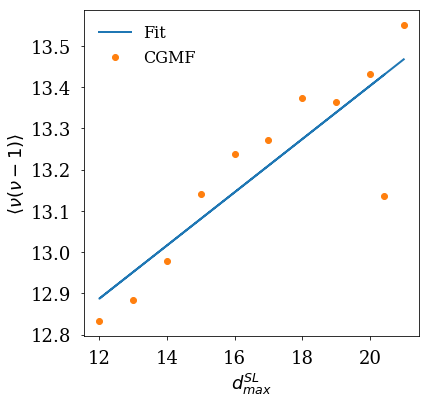

[  0.39645208  32.09882546]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 1.3E-02


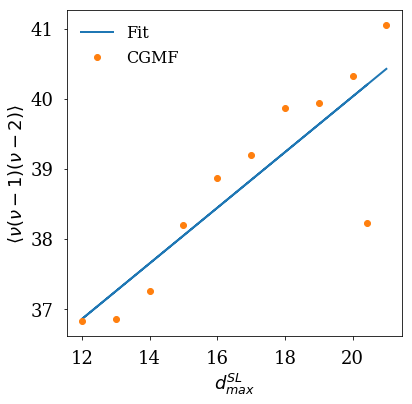

[ 0.01090536  9.19498648]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 4.0E-05


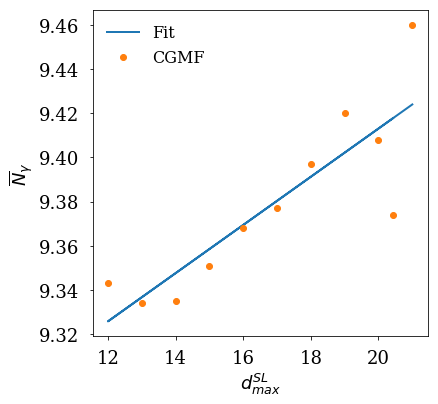

[  0.24876614  88.84600374]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 2.1E-03


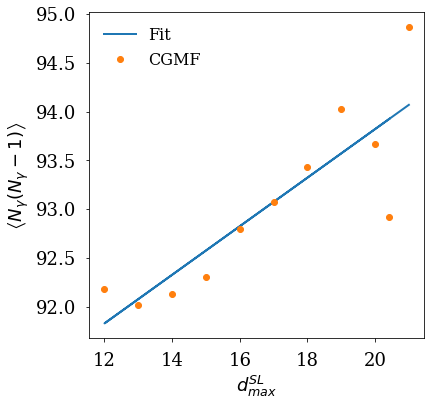

[   4.5233593   896.04609598]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 6.3E-02


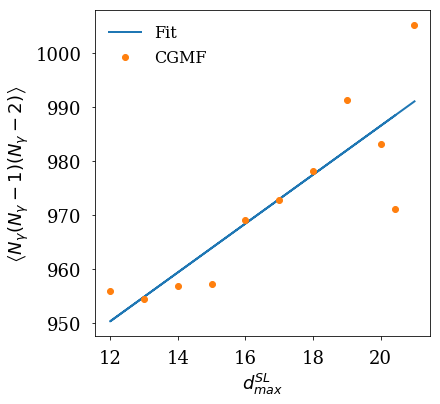

[ 0.00327694  1.83621521]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 1.7E-05


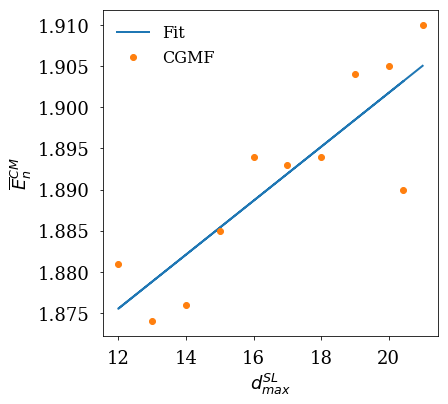

[ 0.00388827  1.52509187]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 3.3E-05


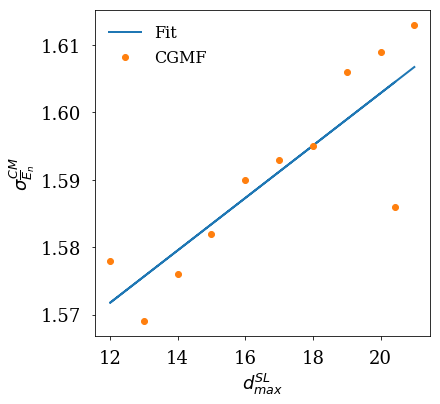

[ 0.00366032  0.84429796]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 4.7E-05


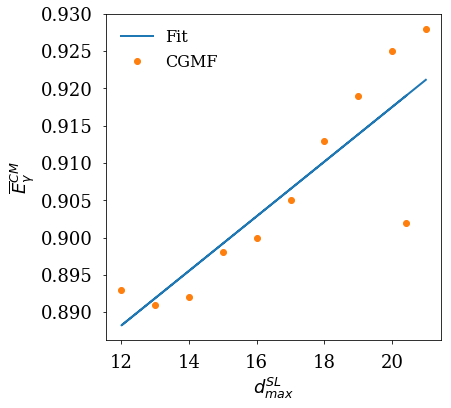

[ 0.0085851   0.74657183]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 4.2E-04


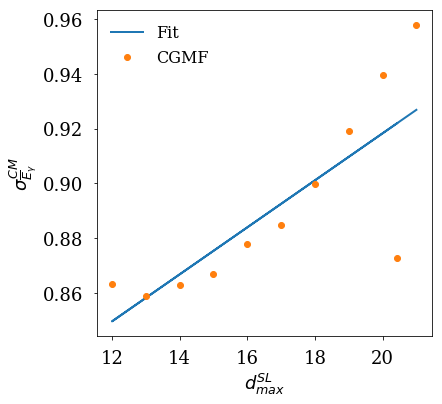

[ 0.00274111  2.07188406]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 8.0E-06


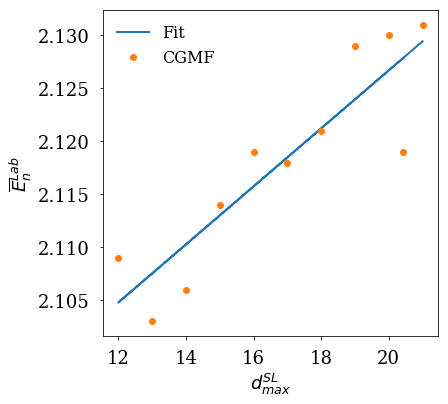

[ 0.00375946  1.57208129]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 2.3E-05


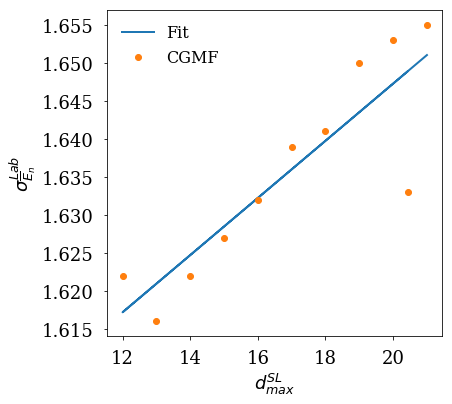

[ 0.00240962  0.69665377]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 2.6E-05


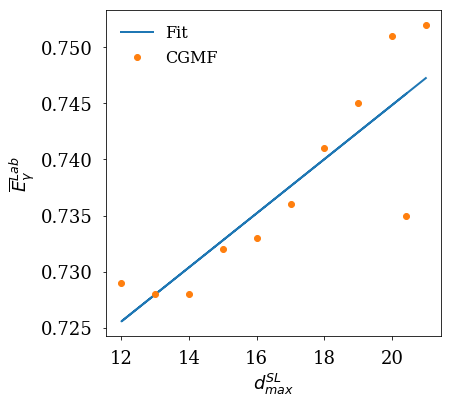

[ 0.00677872  0.73163107]
ACCEPTABLE LINEAR FIT between $d_{max}^{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 2.6E-04


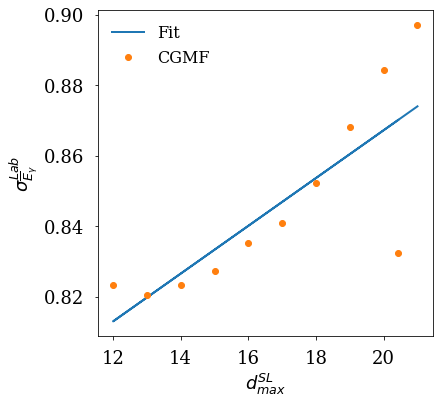

[  4.94118322  31.11320261]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 2.1E-05


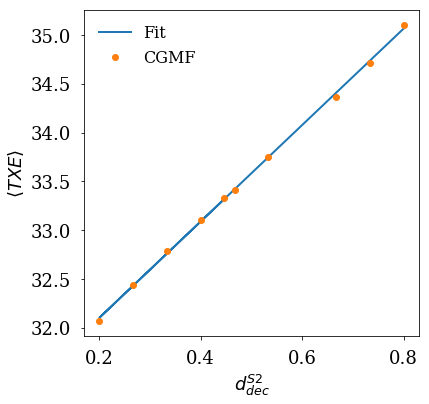

[ 8.00488968  7.05563046]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 7.3E-04


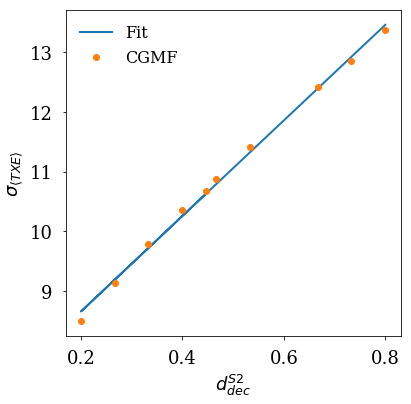

[  -5.01969427  187.04694385]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 8.2E-06


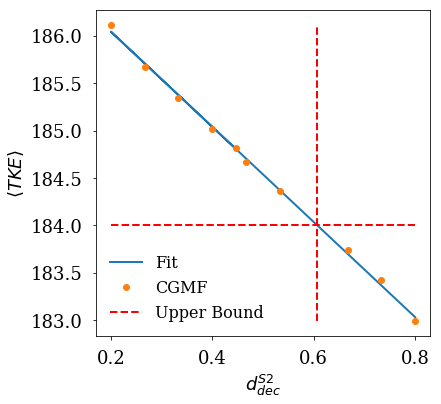

[ 8.38994406  7.40643311]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 5.9E-04


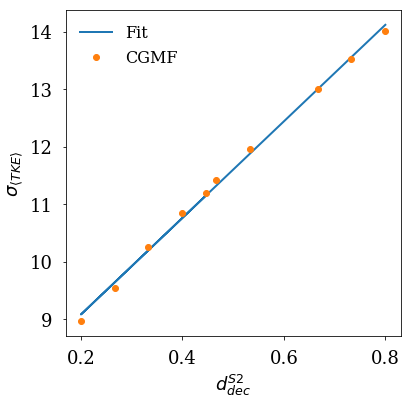

[  0.26450326  10.70792172]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 1.5E-05


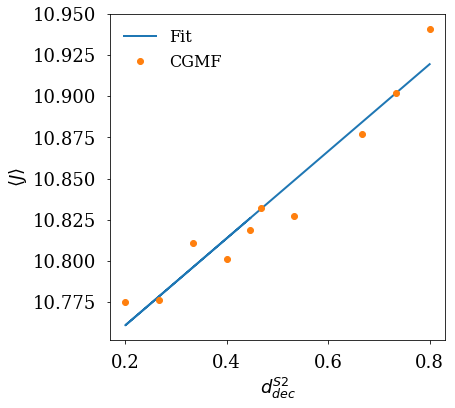

[ 0.25590683  5.96668755]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 1.9E-05


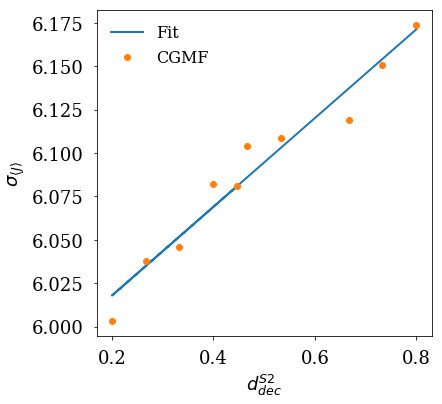

[ 0.51231998  3.65032974]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\overline{\nu}$. 
chi^2/dof = 5.7E-06


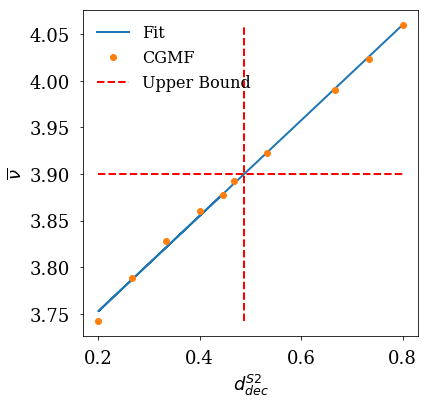

[  5.92723727  10.50076082]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 1.4E-04


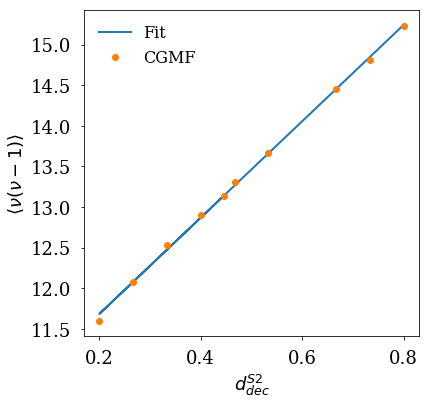

[ 37.62909434  21.57714088]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 7.7E-04


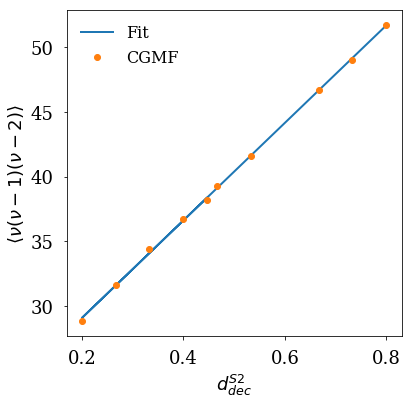

[ 0.19836764  9.27907104]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 1.2E-05


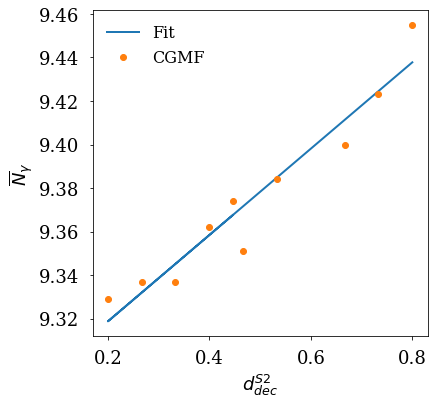

[  4.05112267  90.94792596]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 4.1E-04


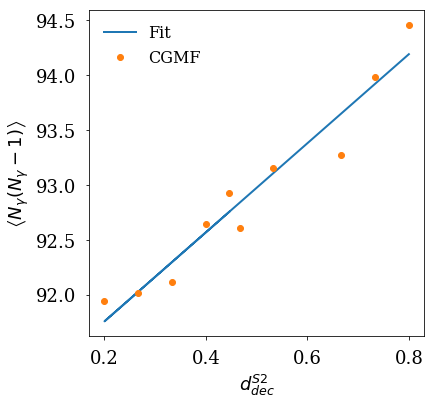

[  64.92471681  937.76848223]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 1.5E-02


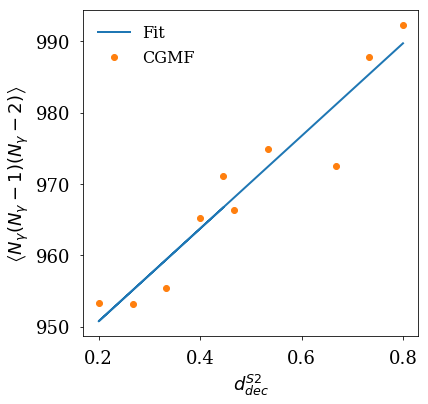

[ 0.19371264  1.80252685]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 4.9E-06


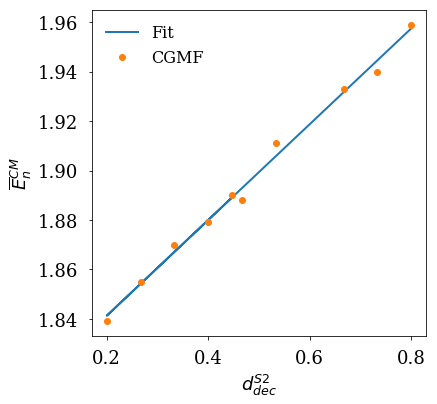

[ 0.13919408  1.52684655]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 3.5E-06


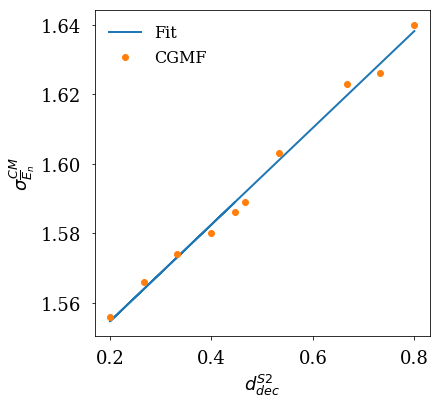

[ 0.07075029  0.86881441]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 7.1E-06


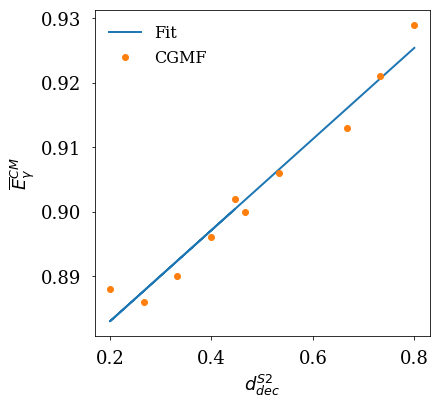

[ 0.09222888  0.83311589]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 1.4E-05


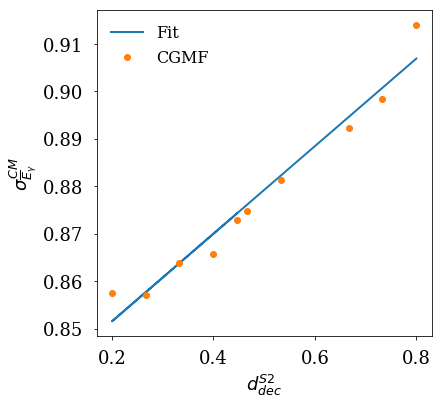

[ 0.12950433  2.0585422 ]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 3.8E-06


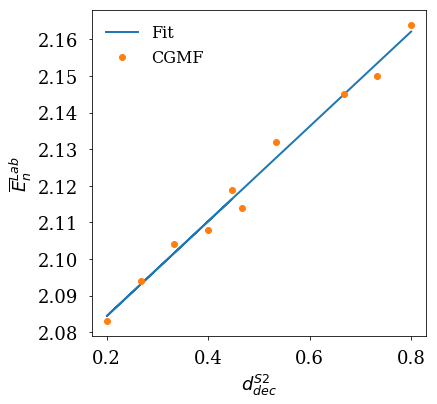

[ 0.13290303  1.57379519]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 4.4E-06


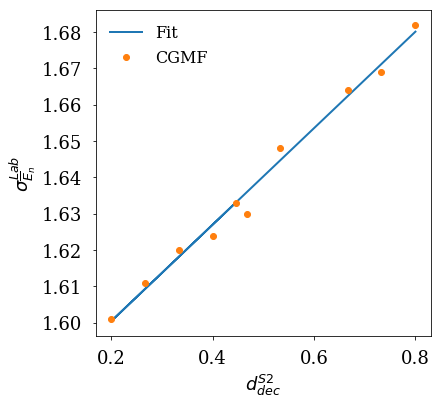

[ 0.04925025  0.71193333]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 3.7E-06


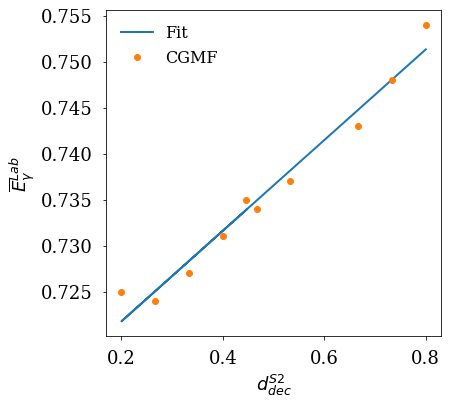

[ 0.07463739  0.79943072]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 1.1E-05


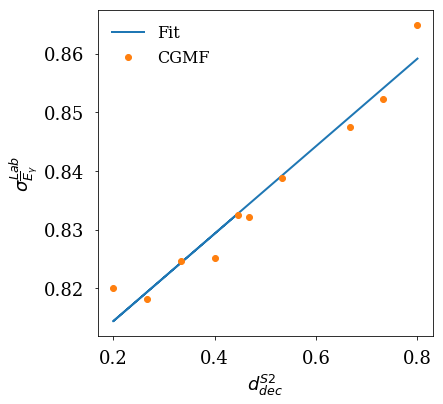

[  0.99051091  33.20498972]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 5.1E-05


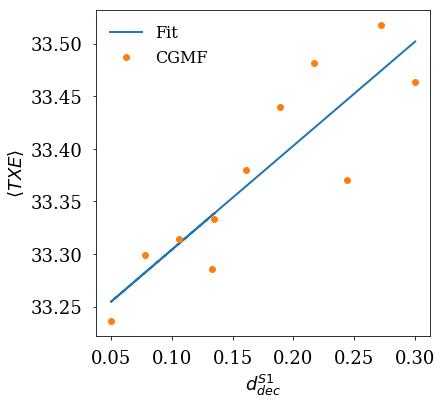

[  2.56433579  10.35783882]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 3.4E-05


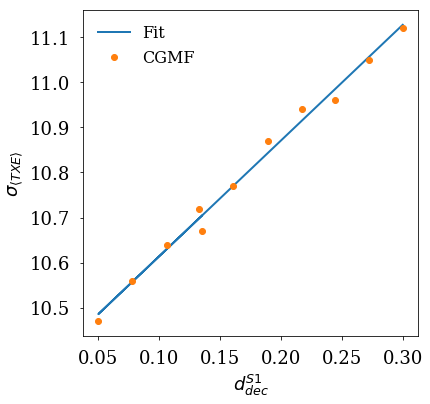

[  -1.07328193  184.93373968]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 1.3E-05


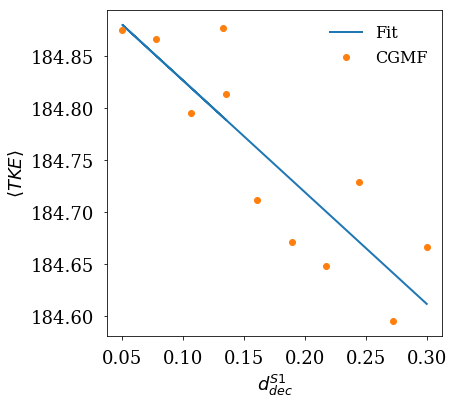

[  1.52589524  11.03124432]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 8.0E-05


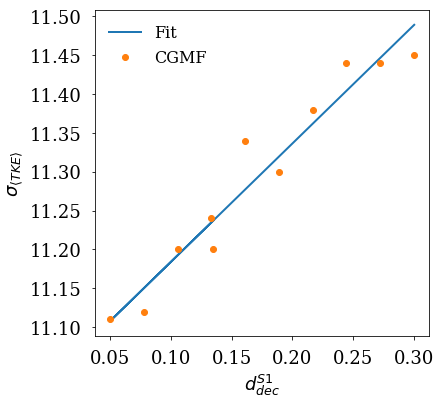

[ -0.04145618  10.83964954]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 6.7E-06


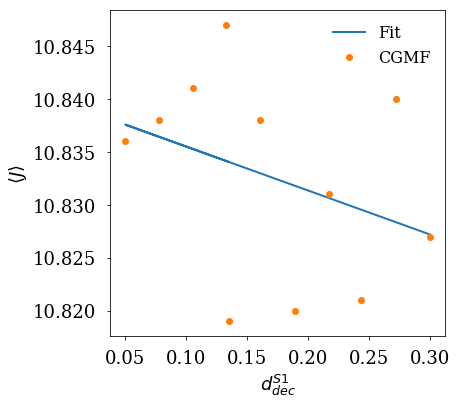

[  9.87951470e-04   6.08428525e+00]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 1.6E-05


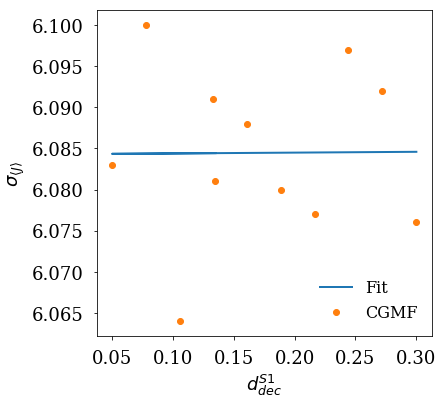

[ 0.09102168  3.86885674]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\overline{\nu}$. 
chi^2/dof = 7.0E-06


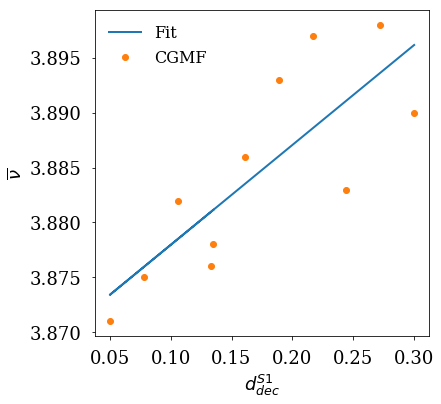

[  1.40952268  12.97845907]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 1.1E-04


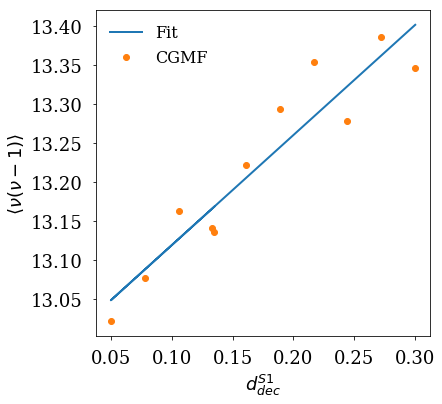

[  7.17381229  37.4553058 ]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 7.9E-04


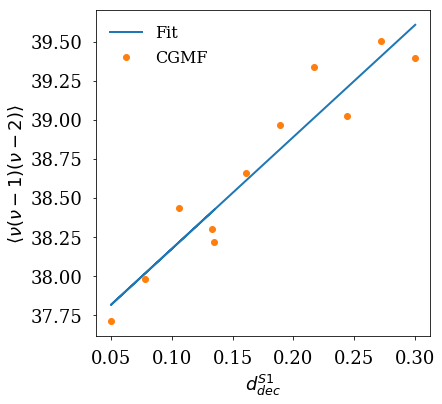

[-0.05053106  9.378841  ]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 1.9E-06


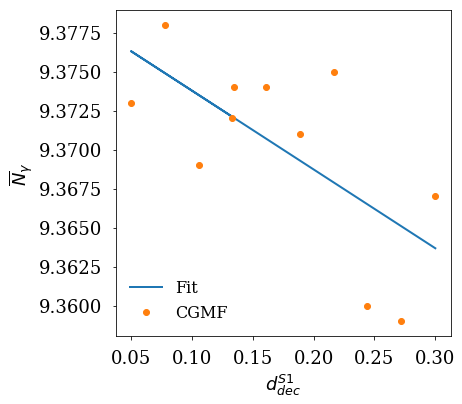

[ -0.98045787  92.99401483]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 1.8E-04


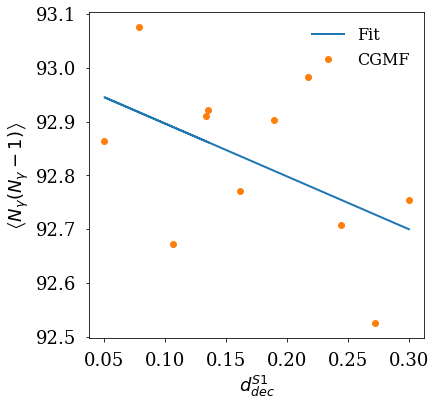

[ -12.06613398  970.38042387]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 1.0E-02


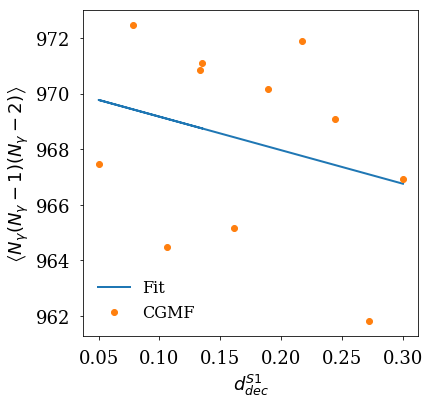

[ 0.06188131  1.88412307]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 2.3E-06


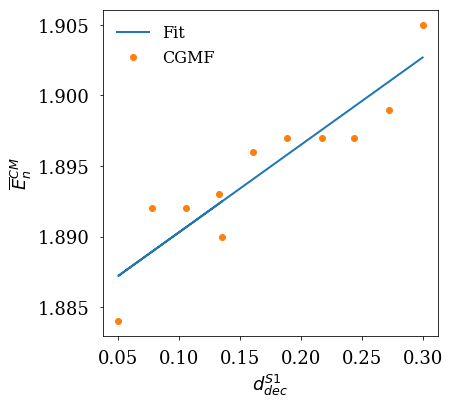

[ 0.04840682  1.58352301]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 8.3E-06


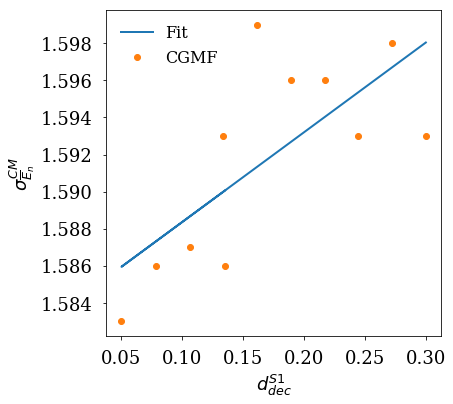

[ 0.01815536  0.8975252 ]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 2.9E-06


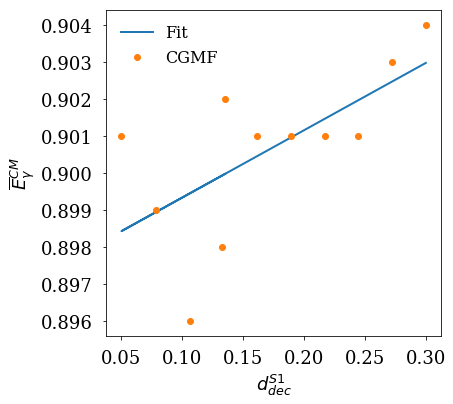

[ 0.02179538  0.86868325]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 5.8E-06


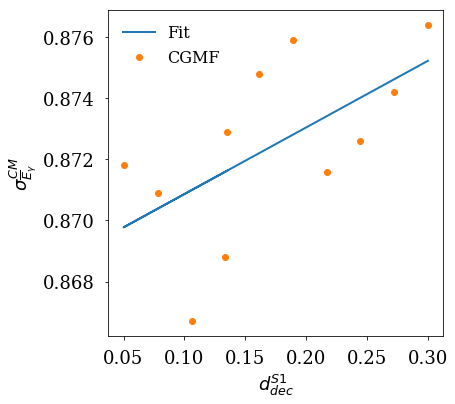

[ 0.05076475  2.11157349]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 9.8E-07


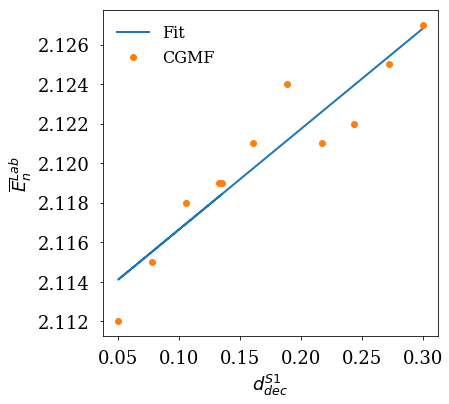

[ 0.0462644  1.6284356]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 3.0E-06


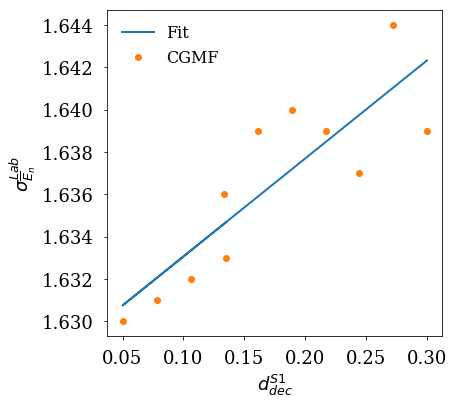

[ 0.01085767  0.73204848]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 1.6E-06


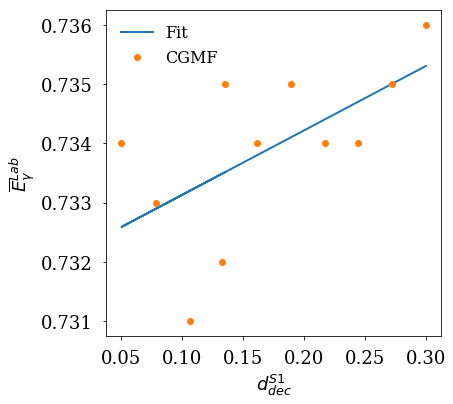

[ 0.01613523  0.82858046]
ACCEPTABLE LINEAR FIT between $d_{dec}^{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 4.2E-06


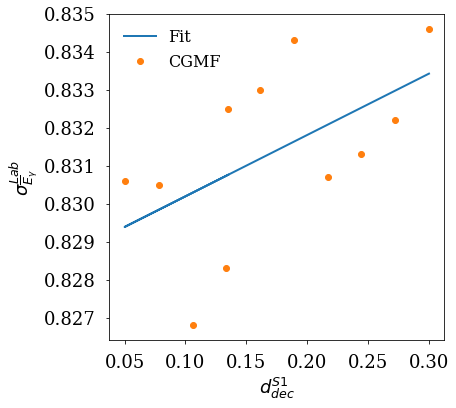

[ -4.98141582e-03   3.33500941e+01]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 2.6E-05


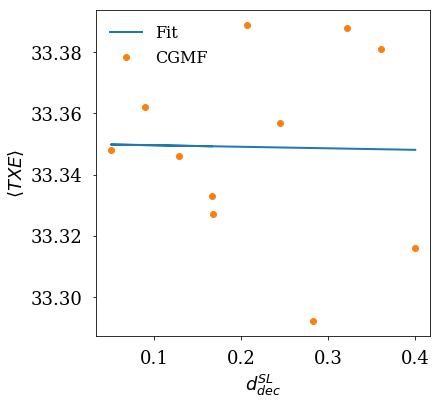

[  0.18525085  10.67476672]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 4.2E-05


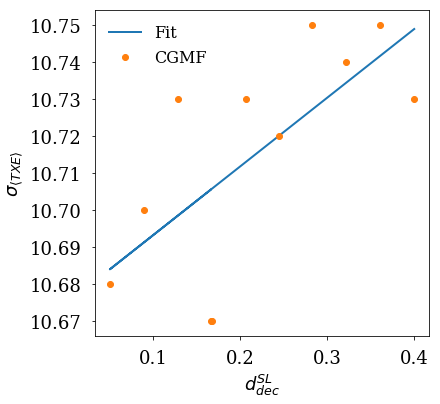

[ -1.02307002e-01   1.84788470e+02]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 9.2E-06


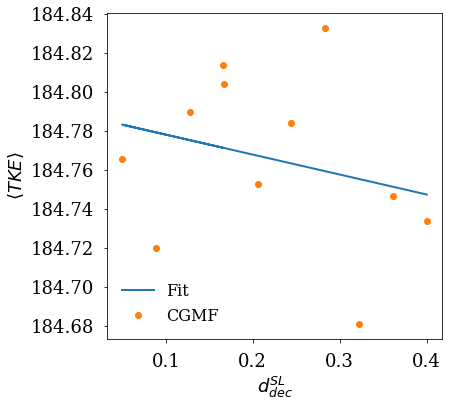

[  0.17669928  11.20119041]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 3.3E-05


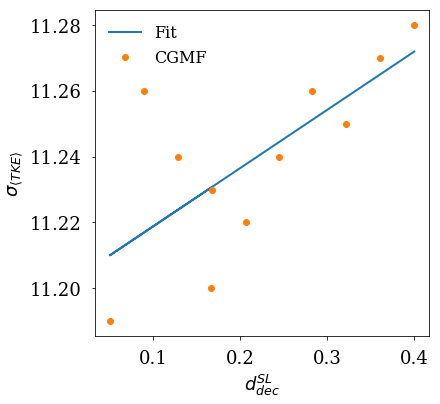

[  0.01367611  10.82826896]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 9.8E-06


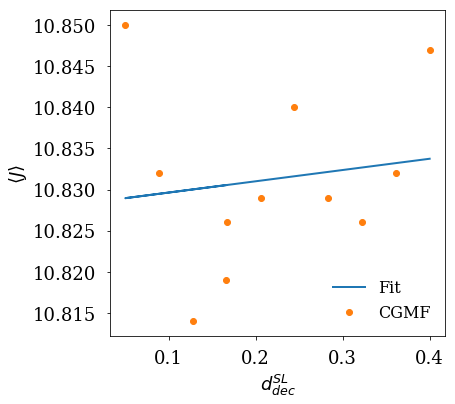

[ -2.12400849e-03   6.08092105e+00]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 2.0E-05


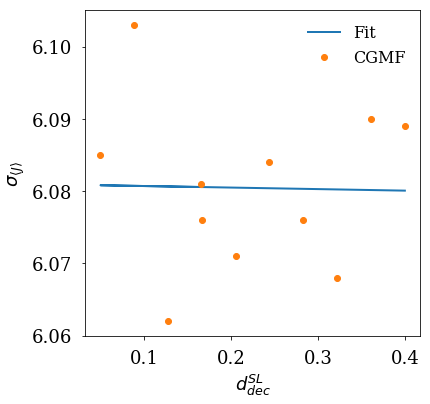

[  1.91039717e-03   3.88330768e+00]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\overline{\nu}$. 
chi^2/dof = 5.6E-06


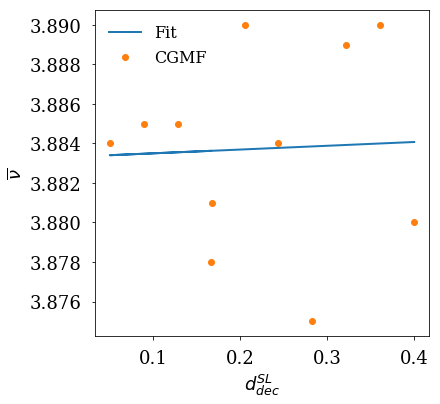

[  0.06294485  13.17553866]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 7.9E-05


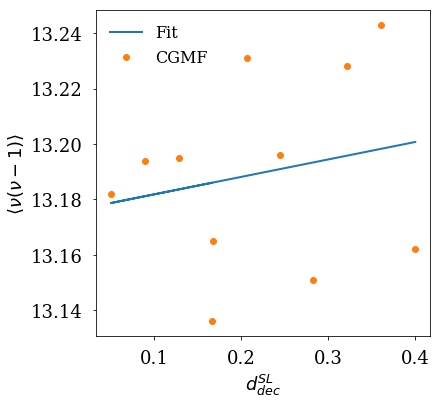

[  0.62114111  38.3803021 ]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 5.1E-04


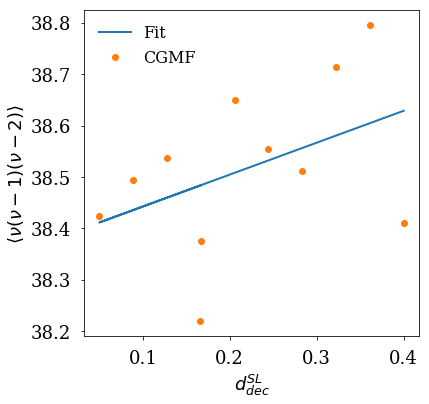

[ 0.0497928   9.36188187]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 1.5E-05


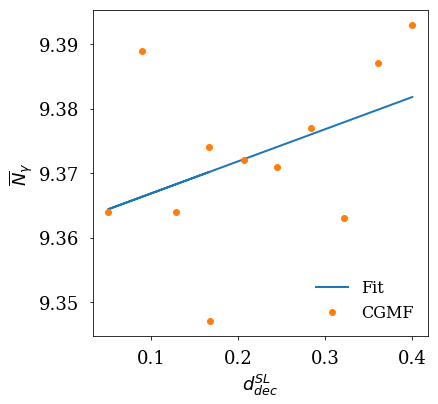

[  1.1787948   92.58636652]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 8.5E-04


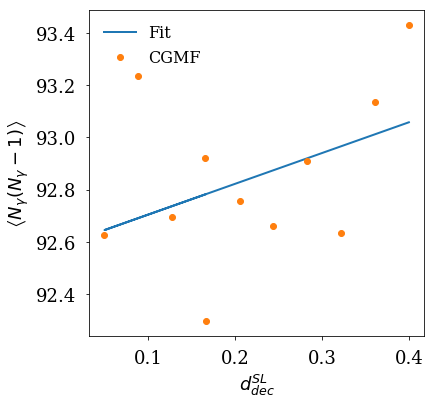

[  21.5091568   963.40126156]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 3.2E-02


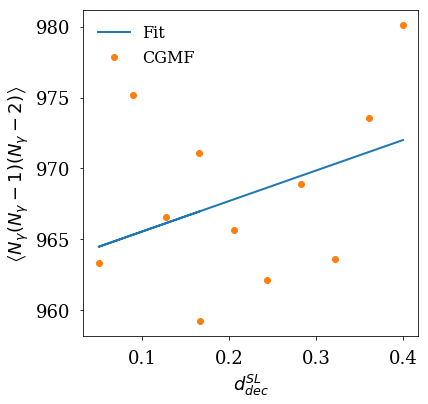

[ 0.01233178  1.88965513]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 4.0E-06


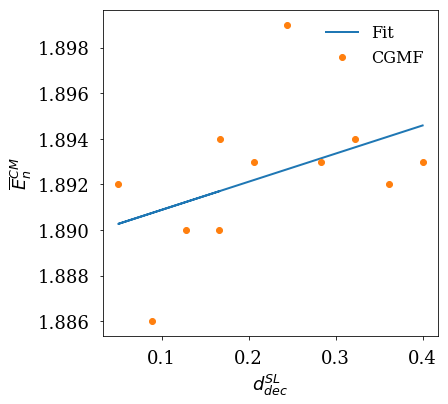

[ 0.0112858  1.5872485]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 4.8E-06


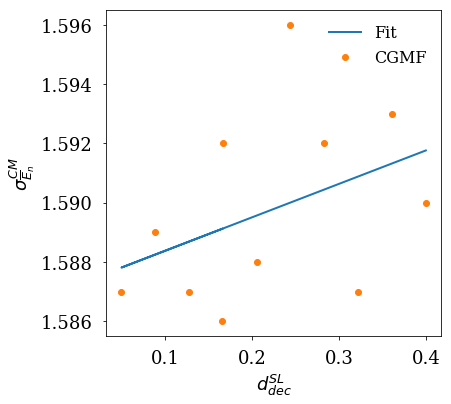

[-0.00705629  0.90082255]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 1.6E-06


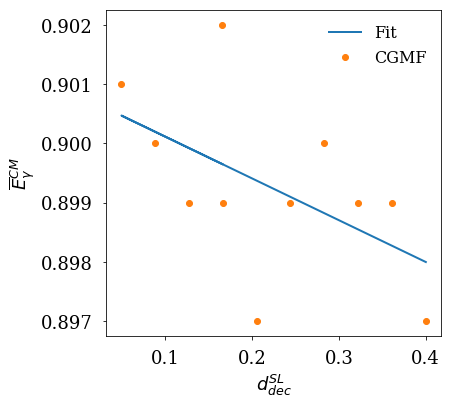

[ 0.0014804   0.87110212]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 4.6E-06


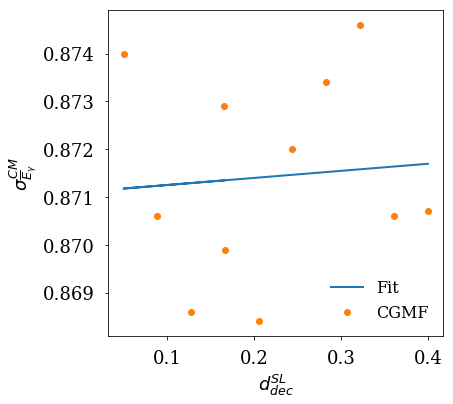

[ 0.00394683  2.11786041]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 6.3E-06


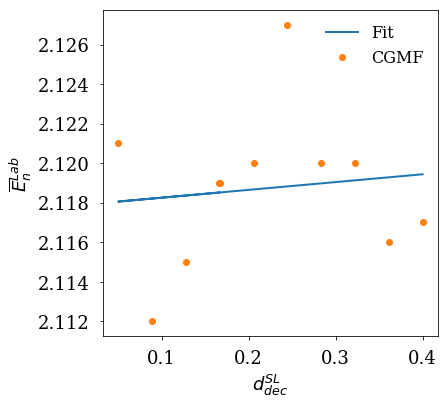

[ 0.00248857  1.63363524]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 3.3E-06


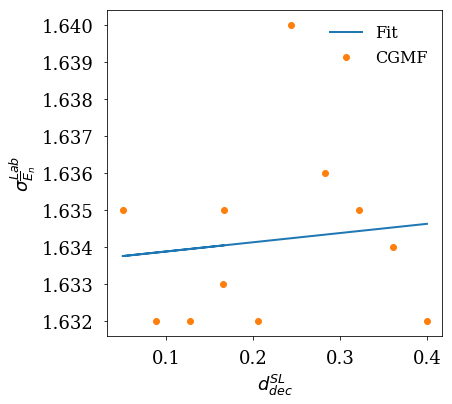

[-0.00539155  0.73409327]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 1.4E-06


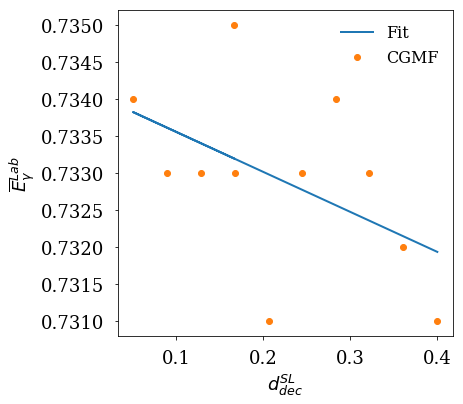

[-0.00137231  0.83087414]
ACCEPTABLE LINEAR FIT between $d_{dec}^{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 4.0E-06


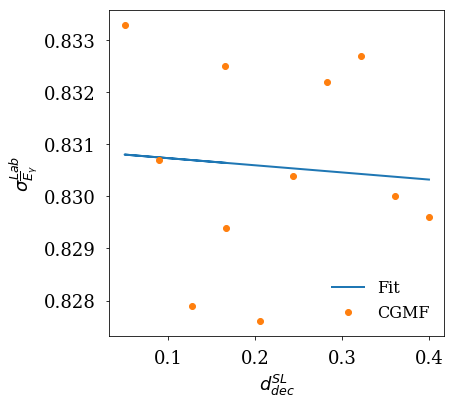

[  -0.47836734  102.65951089]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 9.3E-04


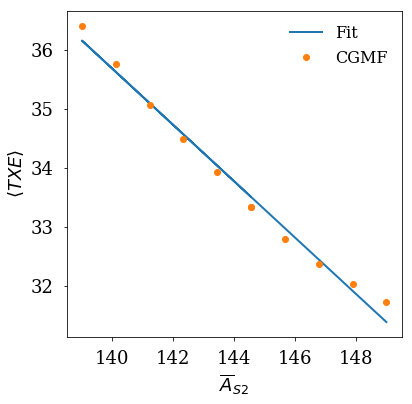

[ -0.12098398  28.19948281]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 7.6E-05


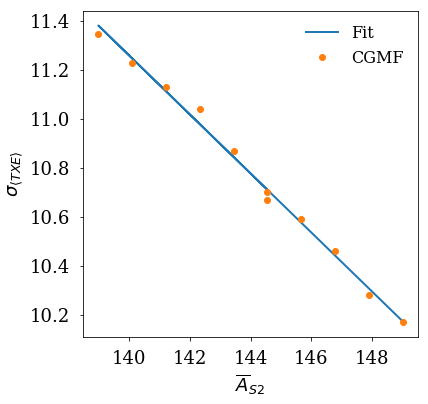

[  -0.34429714  234.45951125]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 5.2E-05


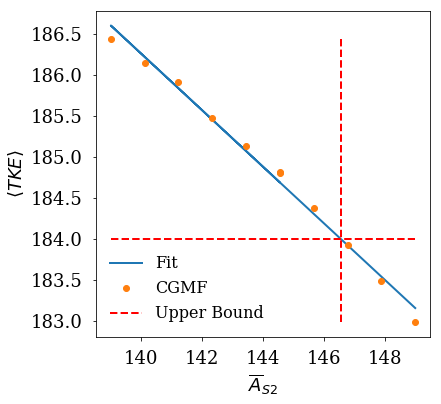

[ 0.08327361 -0.78278292]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 1.3E-04


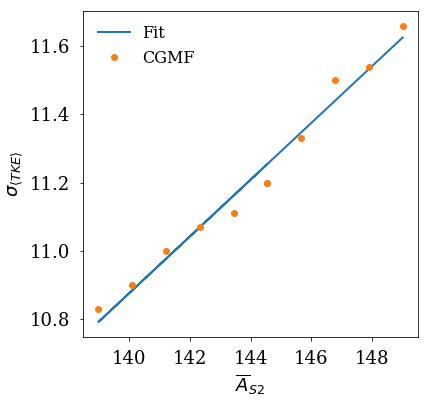

[ -3.16030434e-03   1.12823307e+01]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 2.3E-05


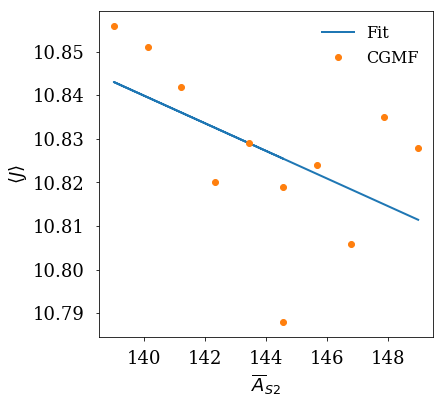

[ 0.01233964  4.30111868]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 5.0E-05


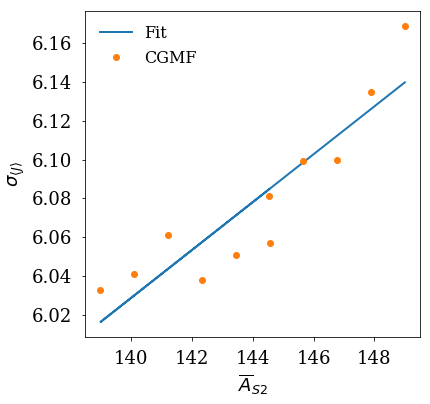

[-0.04202656  9.95789881]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\overline{\nu}$. 
chi^2/dof = 7.5E-06


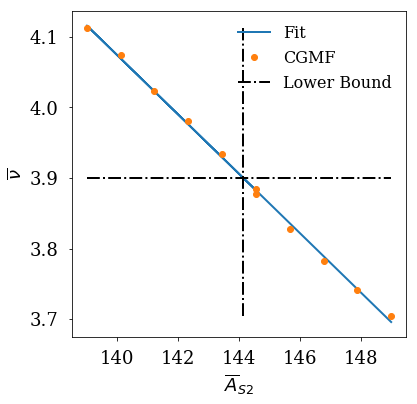

[ -0.2738789   52.76099008]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 1.1E-04


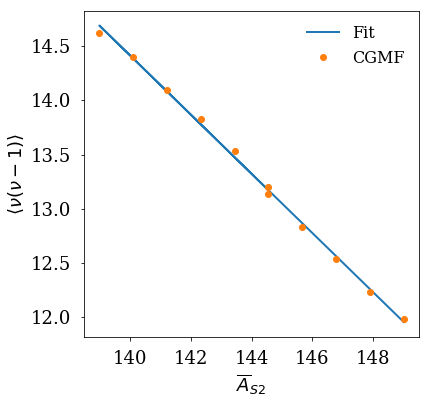

[  -1.08939574  195.79439951]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 1.6E-03


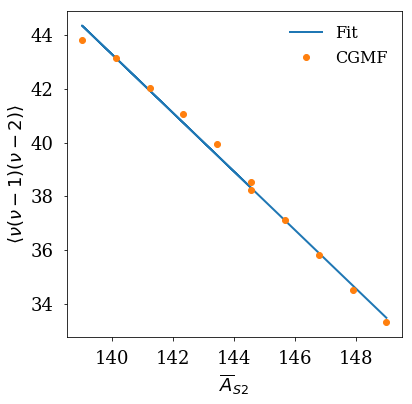

[ 0.05906424  0.80510614]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 7.0E-05


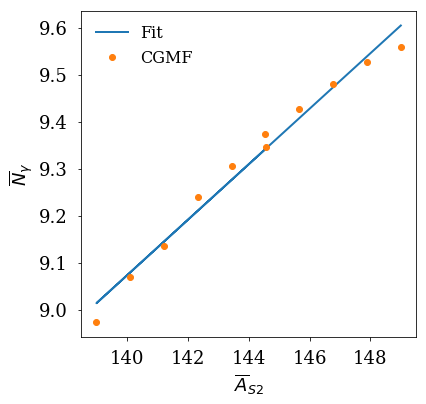

[  1.11601687 -69.04524741]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 2.4E-03


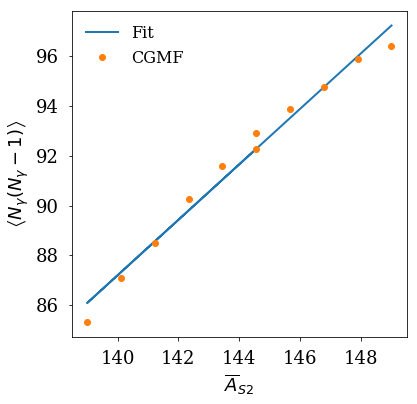

[   16.7875212  -1466.91174567]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 5.8E-02


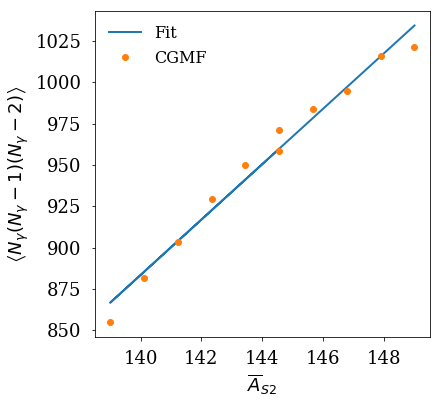

[-0.0255812   5.59786415]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 4.2E-05


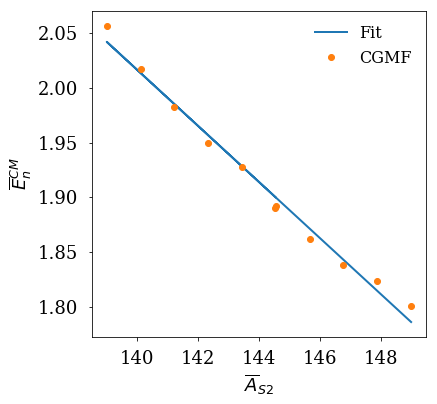

[-0.02156088  4.71164882]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 2.0E-05


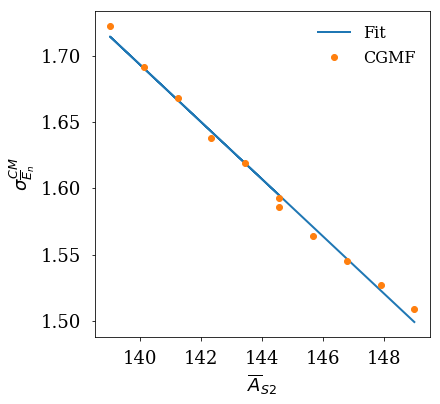

[-0.0091408   2.23027176]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 9.8E-05


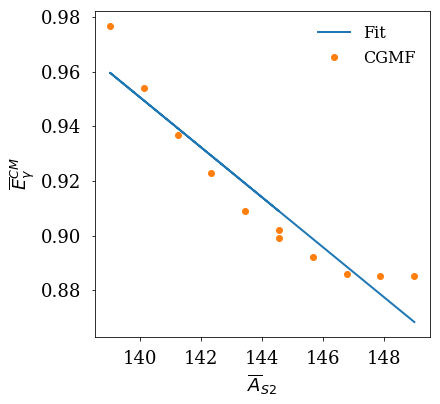

[-0.01159992  2.55288843]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 3.7E-05


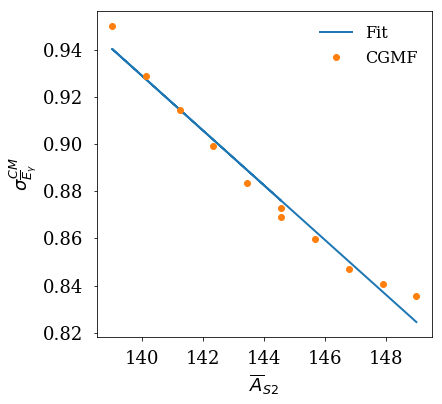

[-0.02536845  5.78894562]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 1.1E-05


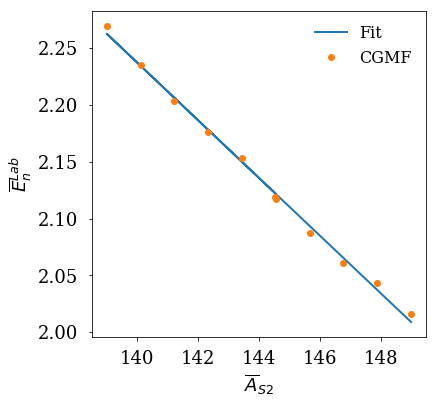

[-0.02110139  4.68891454]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 1.2E-05


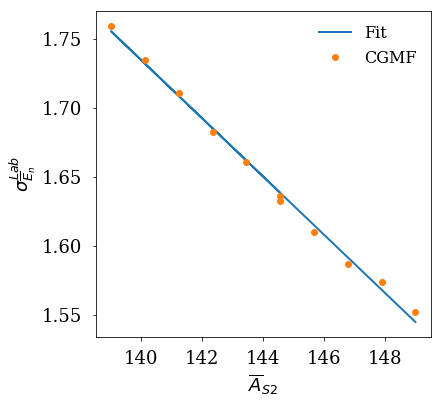

[-0.00802029  1.90086254]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 8.6E-05


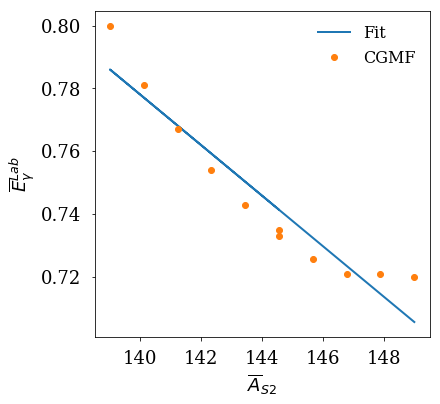

[-0.01051764  2.35664131]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 4.4E-05


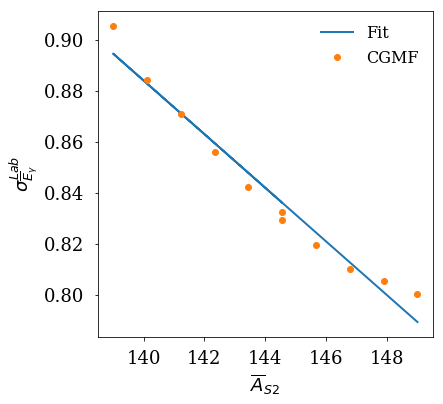

[ -0.09997652  46.90446672]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 3.4E-04


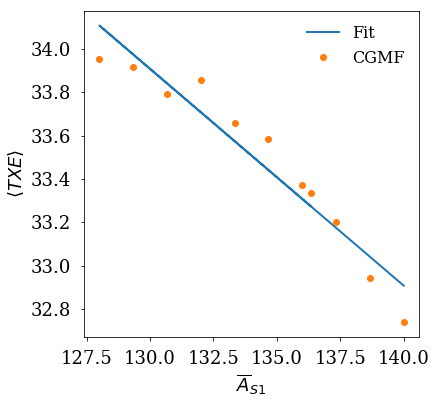

[ 0.04455006  4.67359097]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 4.3E-04


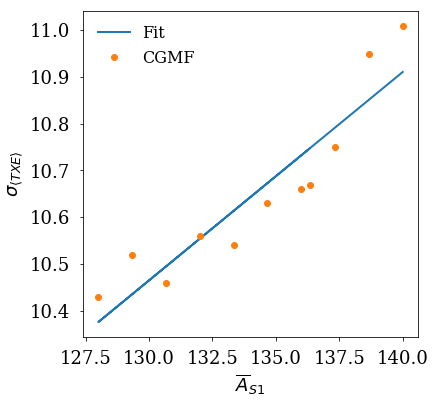

[ -3.49528059e-02   1.89535437e+02]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 1.3E-05


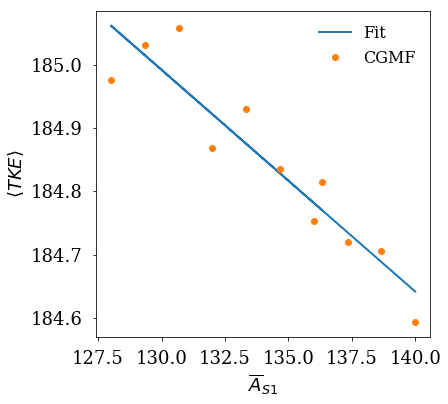

[ -0.03409509  15.85413983]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 7.3E-05


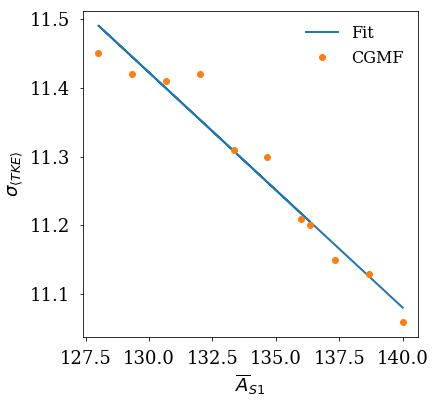

[ -1.00927877e-02   1.22059332e+01]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 3.8E-05


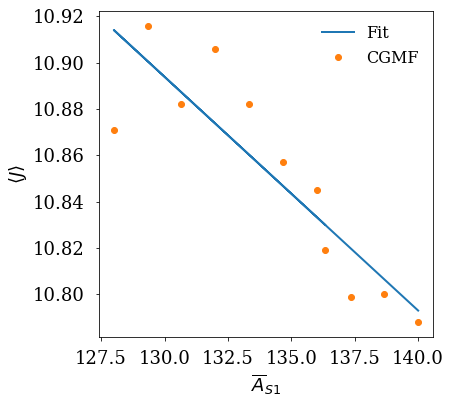

[ -4.32333555e-03   6.67415103e+00]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 3.4E-05


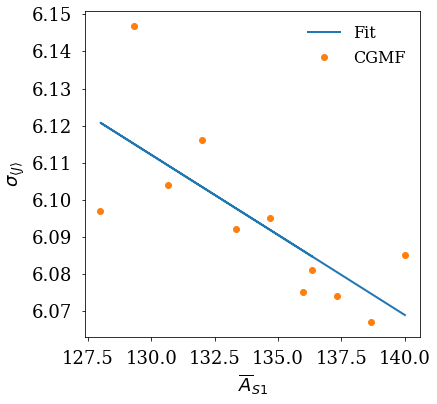

[ -3.84296320e-03   4.39458856e+00]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\overline{\nu}$. 
chi^2/dof = 3.9E-05


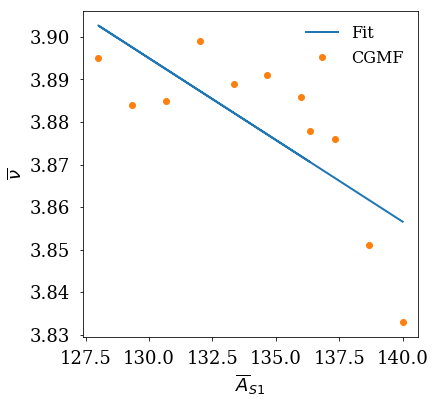

[ -0.01595232  15.29171384]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 2.8E-04


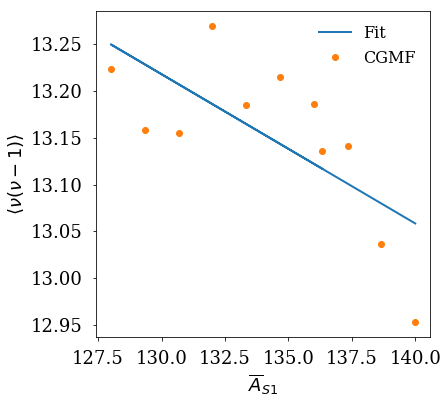

[ -4.07659776e-02   4.37859049e+01]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 1.1E-03


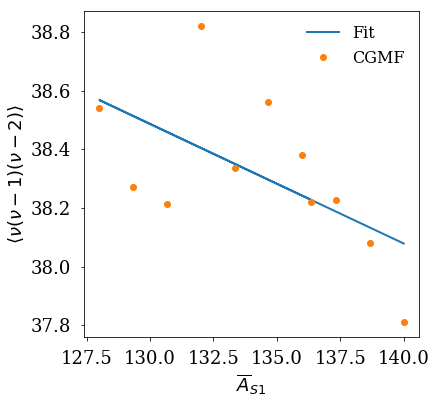

[ 0.01166728  7.79893289]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 6.2E-05


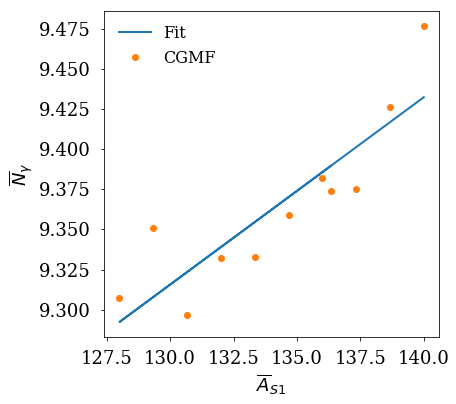

[  0.18607182  67.78217786]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 2.6E-03


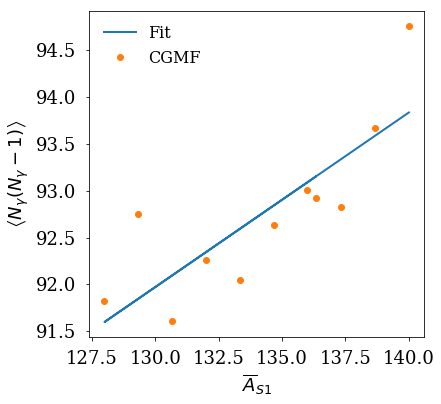

[   2.33530998  654.2105898 ]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 6.2E-02


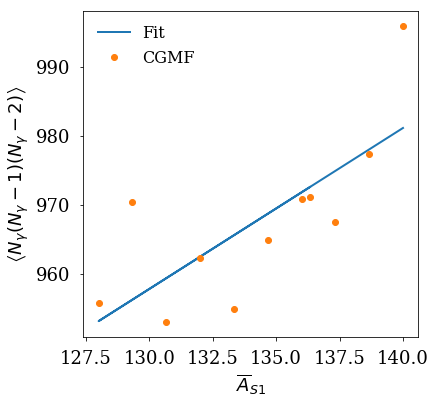

[-0.00336102  2.34717951]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 1.9E-05


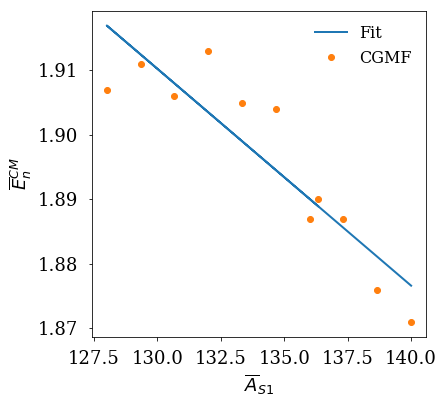

[-0.00300898  1.99620335]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 1.3E-05


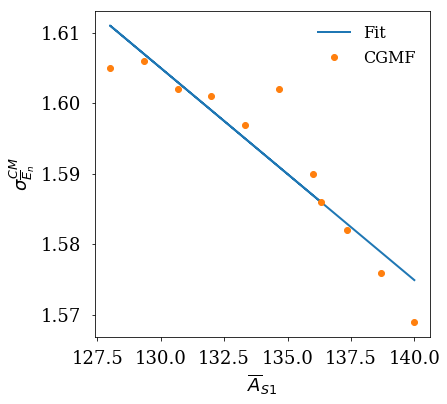

[-0.00356394  1.38559499]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 9.0E-06


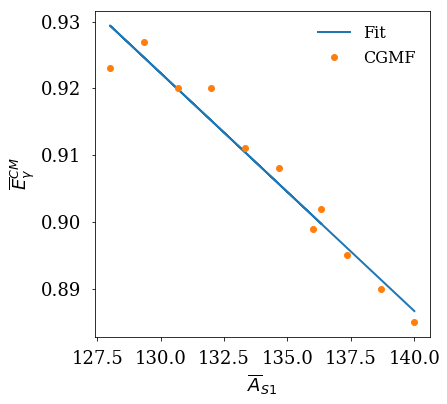

[-0.00228143  1.18226747]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 8.1E-06


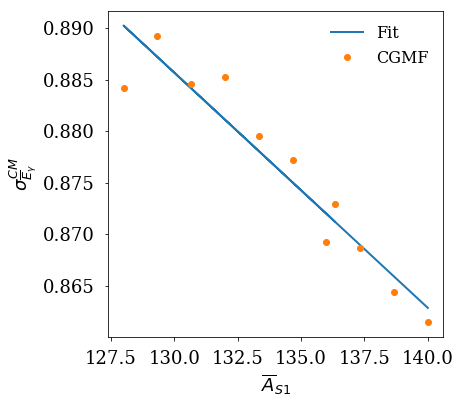

[-0.00274229  2.48950121]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 2.0E-05


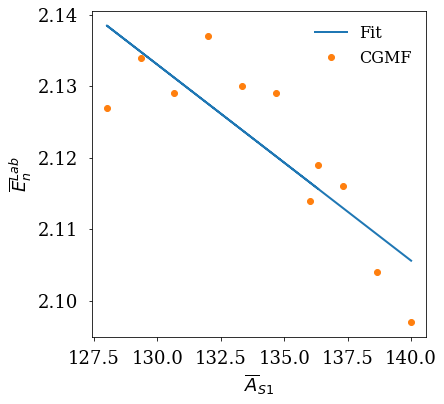

[-0.00283516  2.01714773]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 1.2E-05


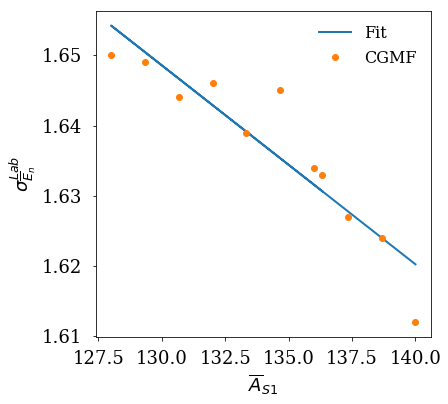

[-0.00286136  1.12293688]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 6.6E-06


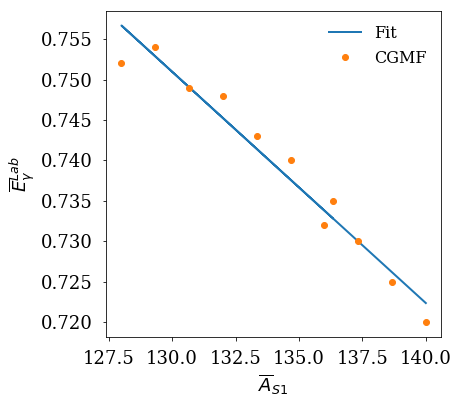

[-0.00278306  1.20958209]
ACCEPTABLE LINEAR FIT between $\overline{A}_{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 1.2E-05


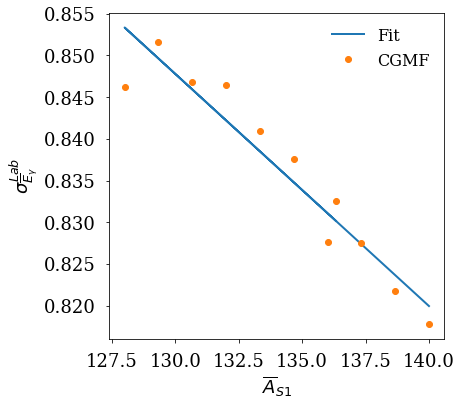

[  0.2328153   31.90314371]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 2.9E-05


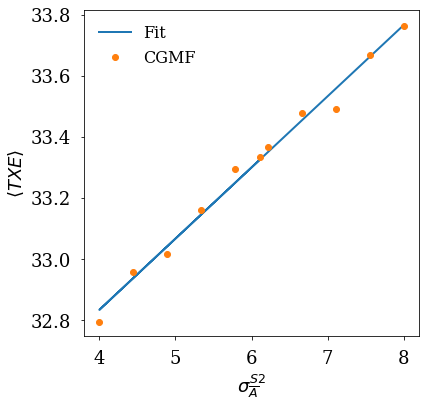

[ 0.13335778  9.8748834 ]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 9.5E-05


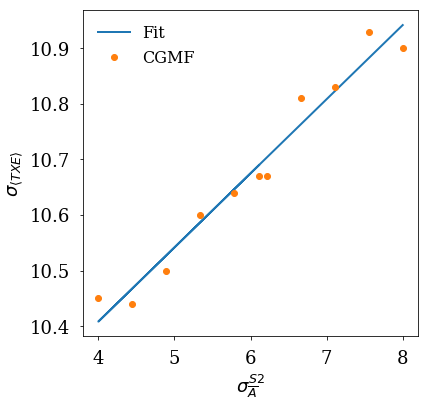

[ -9.68416812e-02   1.85367928e+02]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 3.5E-06


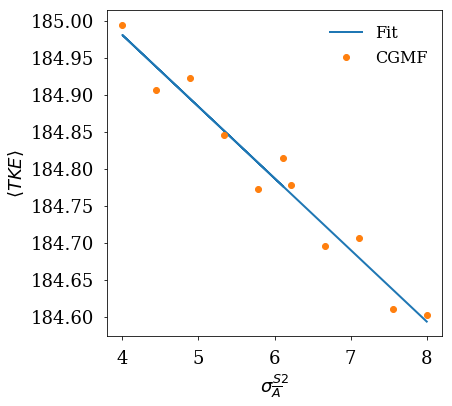

[  0.09394271  10.6672225 ]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 1.1E-04


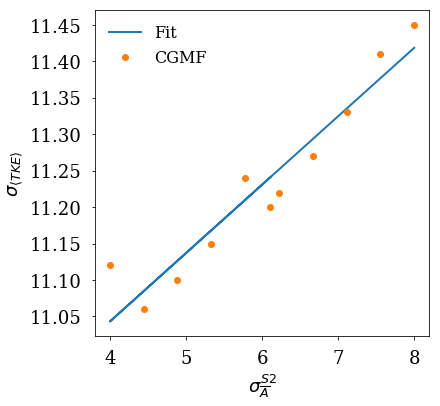

[  4.13028364e-03   1.08059043e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 2.4E-05


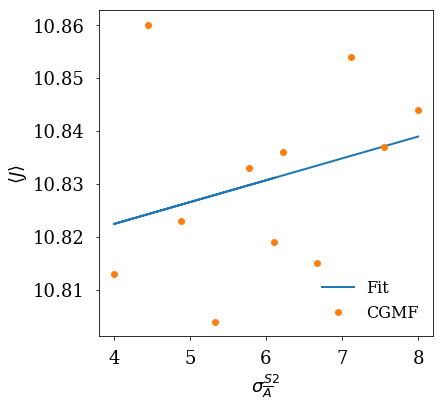

[ 0.01883134  5.96764185]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 2.2E-05


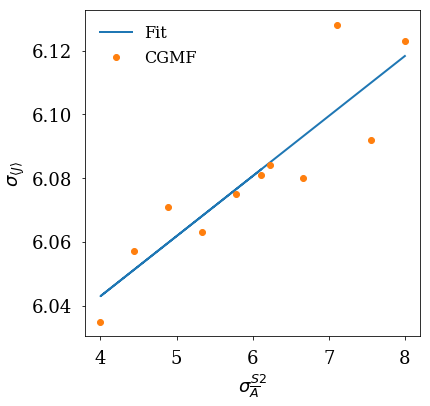

[ -2.51927314e-04   3.88251408e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\overline{\nu}$. 
chi^2/dof = 7.1E-06


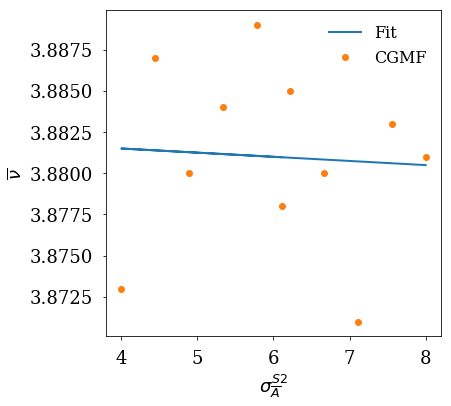

[ -0.02473308  13.31328219]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 9.8E-05


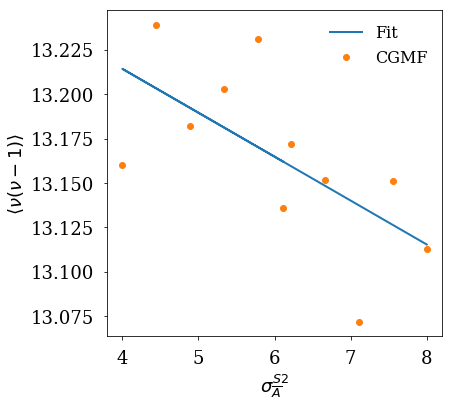

[ -0.27165858  40.00766804]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 6.6E-04


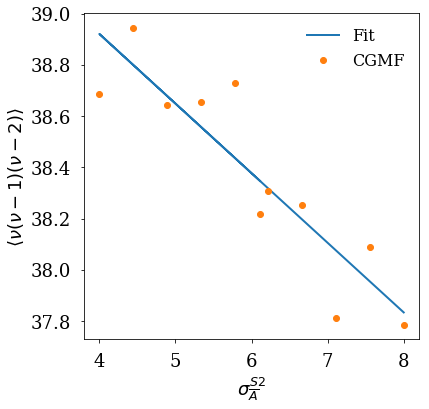

[-0.04243145  9.63110393]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 5.8E-06


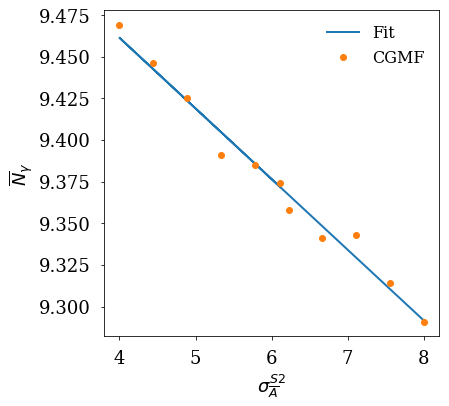

[ -0.69866115  97.09904442]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 3.4E-04


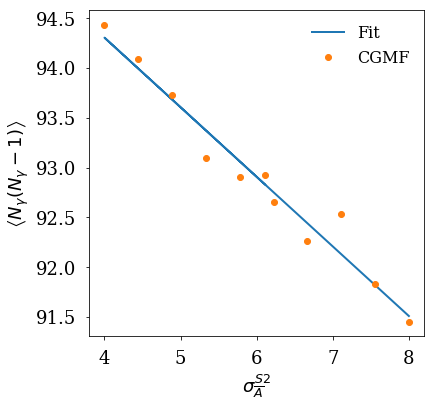

[   -8.28663185  1018.66174833]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 1.3E-02


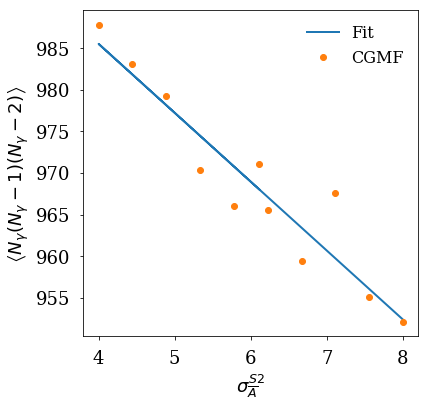

[ 0.01604082  1.79314011]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 3.0E-06


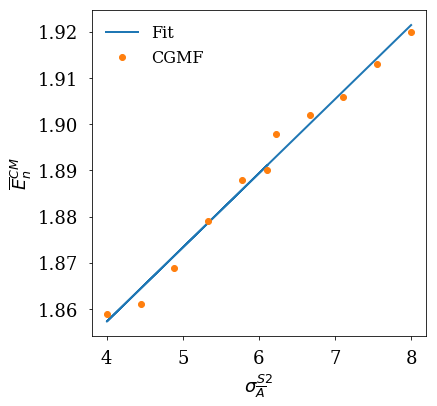

[ 0.01666141  1.48631945]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 5.4E-06


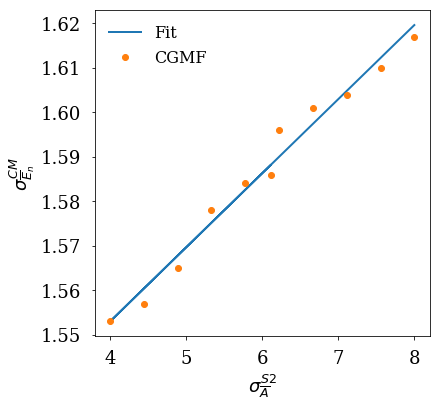

[ 0.01296111  0.81964921]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 4.1E-06


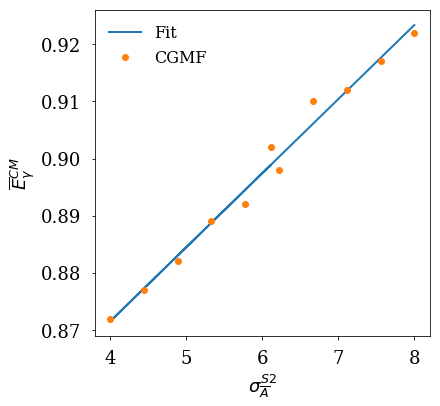

[ 0.00747176  0.82507656]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 3.5E-06


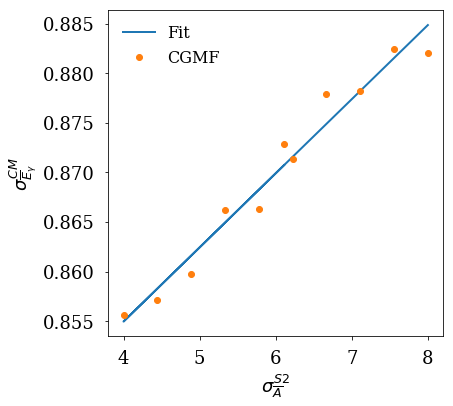

[ 0.01003424  2.05587606]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 2.6E-06


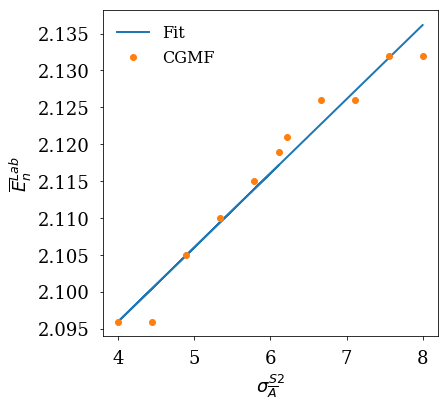

[ 0.0143704   1.54536115]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 3.2E-06


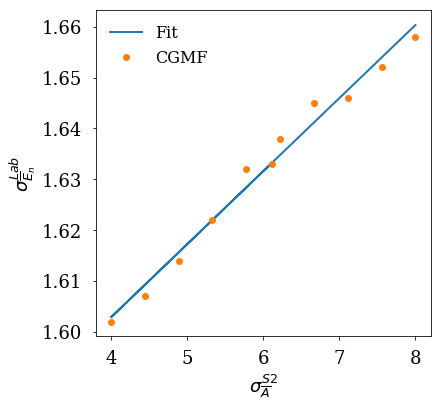

[ 0.01091105  0.66587916]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 2.8E-06


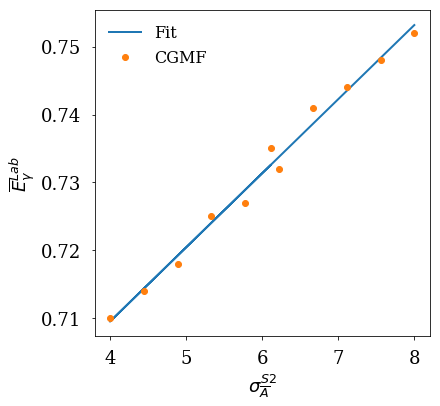

[ 0.00852715  0.77761548]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S2}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 3.9E-06


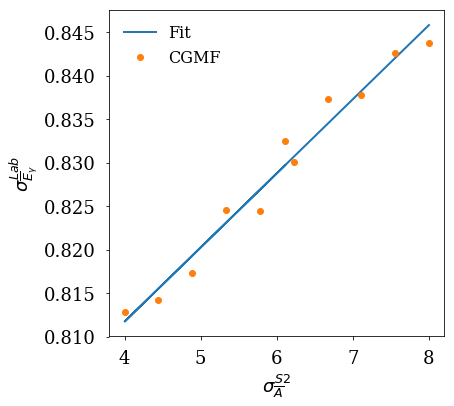

[ -2.66857999e-02   3.34169148e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 2.5E-05


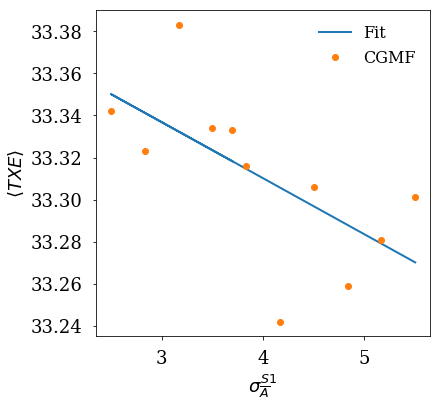

[  0.04500219  10.52850768]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 7.2E-05


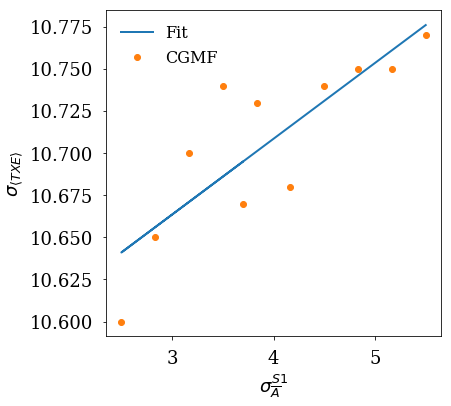

[ -5.43988801e-02   1.85004092e+02]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 4.0E-06


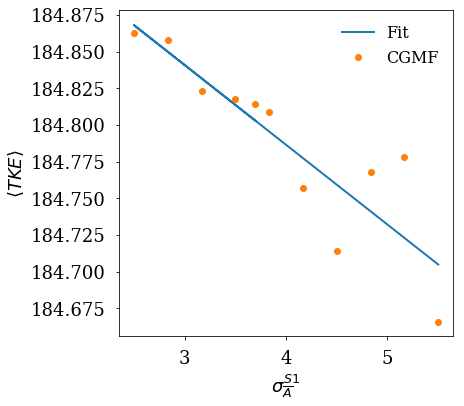

[ -0.02837925  11.33182362]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 5.4E-05


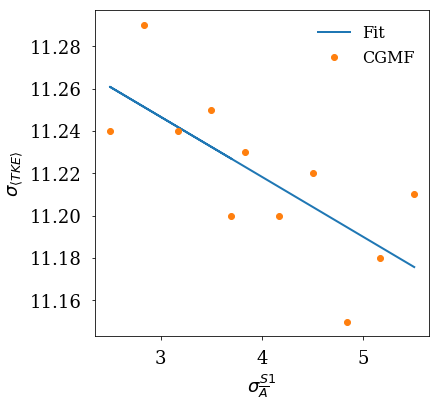

[  3.45687195e-03   1.08100862e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 3.9E-05


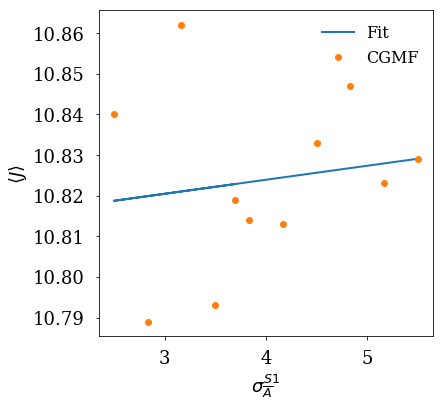

[  4.56127114e-03   6.06015370e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 2.9E-05


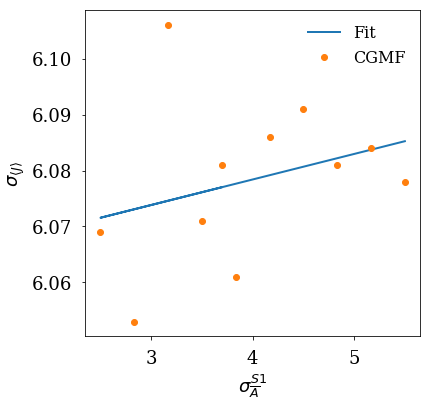

[-0.00598107  3.901759  ]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\overline{\nu}$. 
chi^2/dof = 4.9E-06


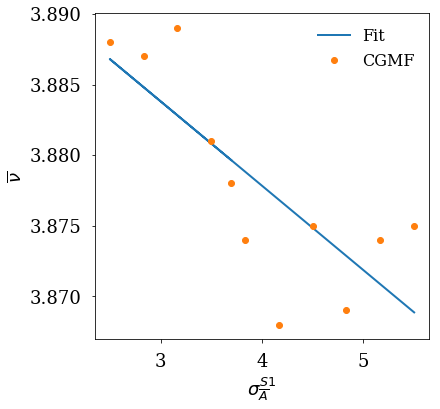

[ -0.02591345  13.25402856]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 8.0E-05


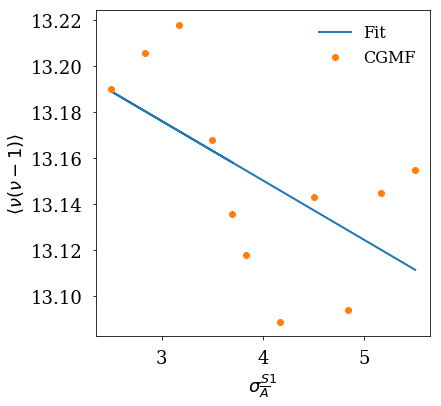

[ -0.06381172  38.58784699]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 6.1E-04


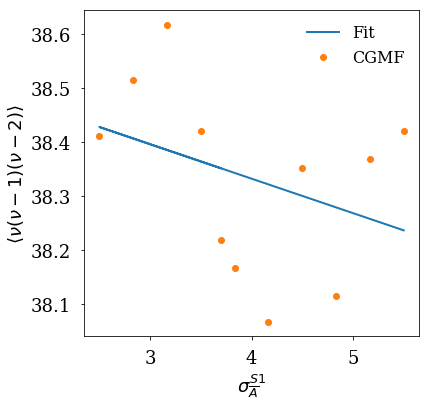

[ 0.01410498  9.31569716]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 3.1E-05


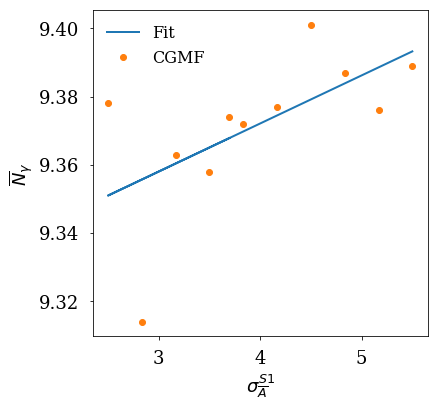

[  0.22097091  91.95049592]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 1.2E-03


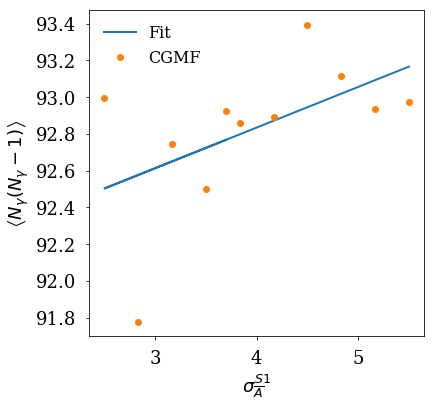

[   2.43848735  958.04435063]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 2.8E-02


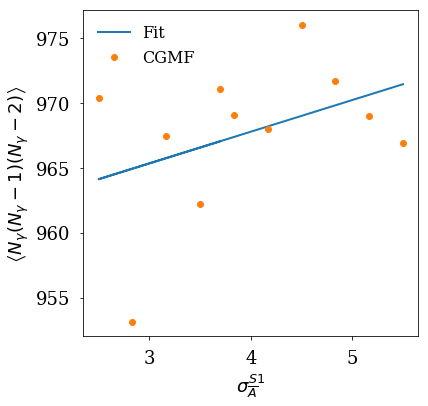

[ -1.41103753e-03   1.89760515e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 4.5E-06


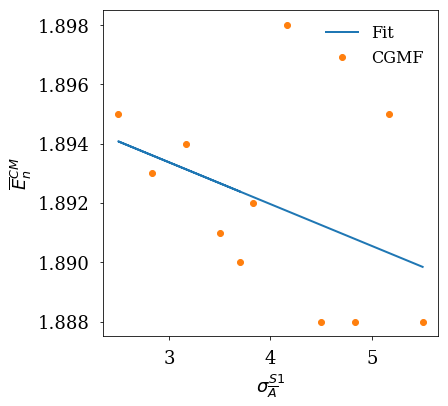

[ -5.55643809e-04   1.59157086e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 6.4E-06


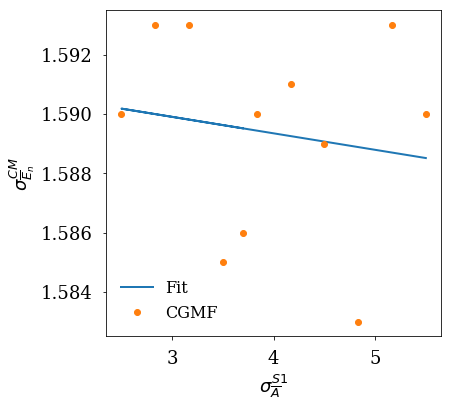

[ -8.07371238e-04   9.02025354e-01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 5.0E-06


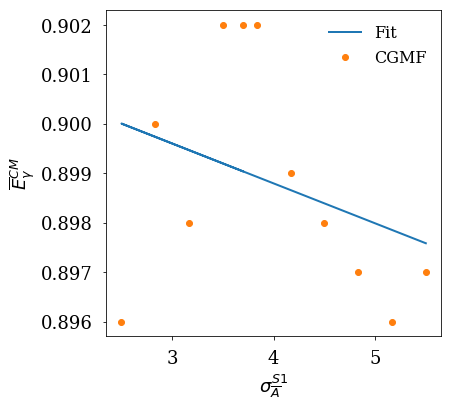

[-0.00122363  0.87561524]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 3.7E-06


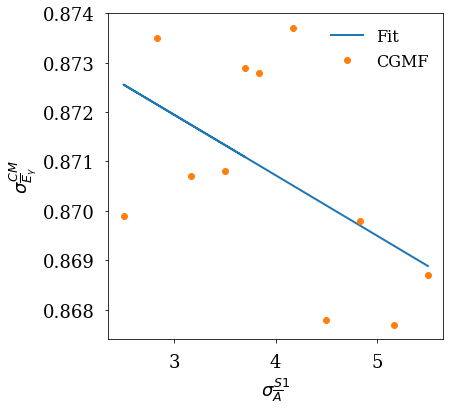

[ -2.00501482e-03   2.12623738e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 5.9E-06


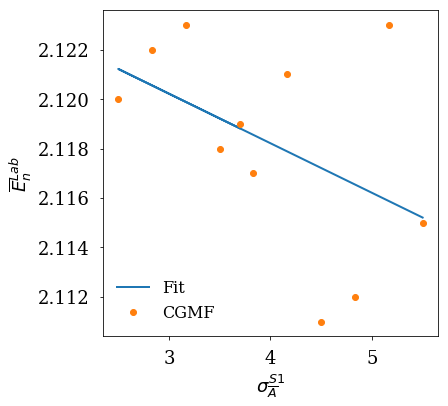

[ -9.99598742e-04   1.63887986e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 6.3E-06


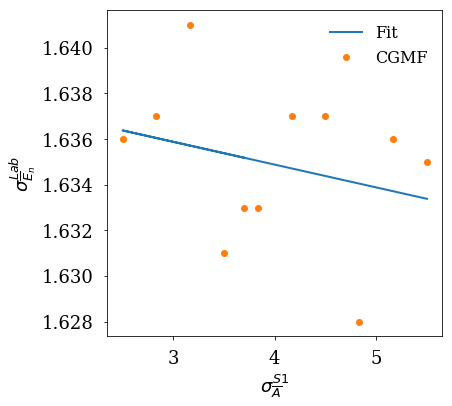

[-0.00080154  0.73627493]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 2.8E-06


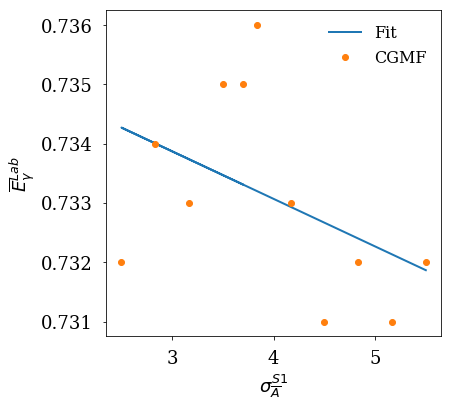

[-0.00109898  0.83451102]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{S1}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 3.2E-06


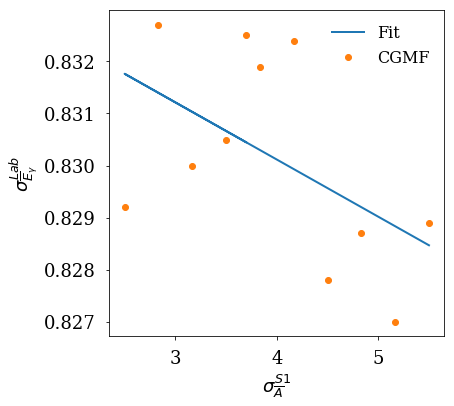

[ -2.09818794e-02   3.36768657e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\left \langle TXE \right \rangle$. 
chi^2/dof = 1.7E-05


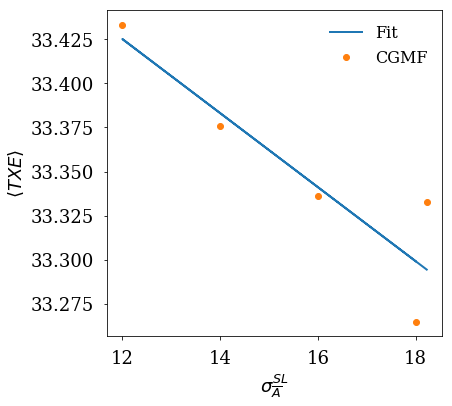

[ -0.02619335  11.12380023]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\sigma_{\left \langle TXE \right \rangle}$. 
chi^2/dof = 3.5E-05


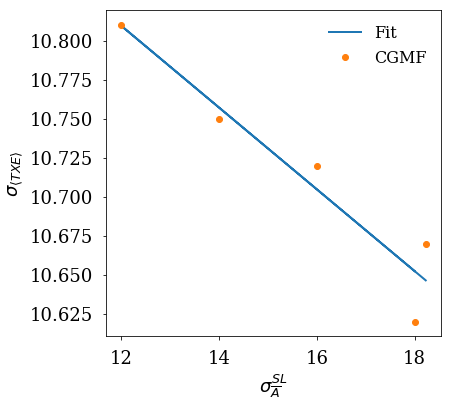

[  4.90373732e-03   1.84745680e+02]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\left \langle TKE \right \rangle$. 
chi^2/dof = 1.8E-06


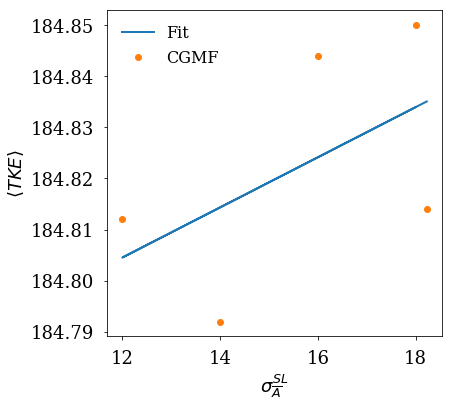

[  1.86770577e-03   1.11667794e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\sigma_{\left \langle TKE \right \rangle}$. 
chi^2/dof = 2.9E-05


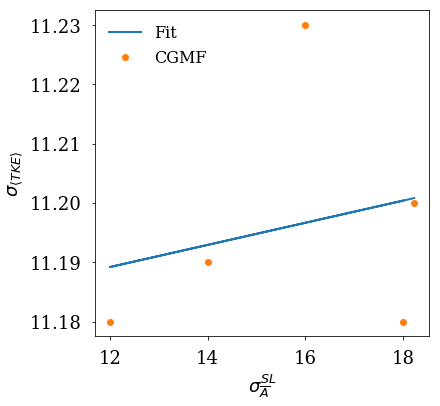

[ -6.94688824e-03   1.09328855e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\left \langle J \right \rangle$. 
chi^2/dof = 5.4E-06


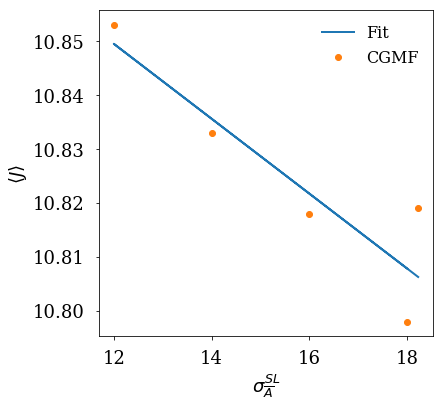

[ -1.49982732e-03   6.10306510e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\sigma_{\left \langle J \right \rangle}$. 
chi^2/dof = 2.5E-05


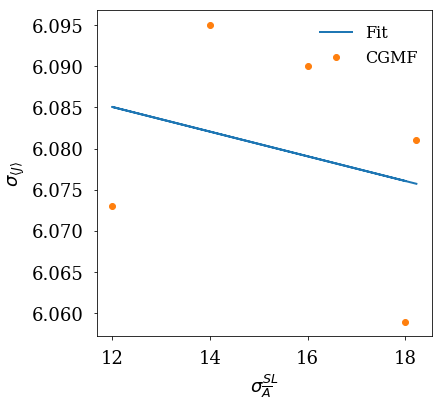

[ -8.46172669e-04   3.89463854e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\overline{\nu}$. 
chi^2/dof = 3.6E-07


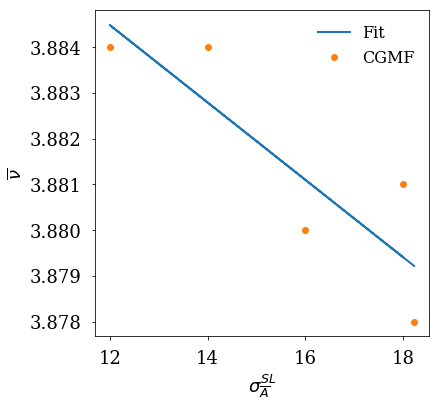

[ -8.89103353e-03   1.33045020e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\left \langle \nu(\nu-1) \right \rangle$. 
chi^2/dof = 8.9E-06


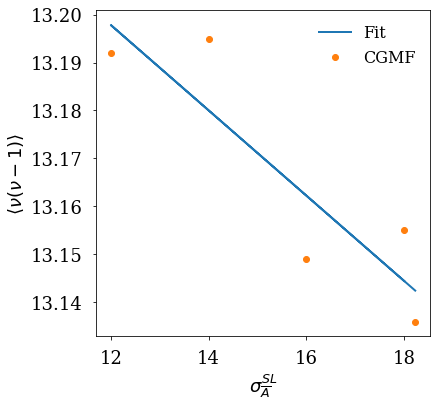

[ -0.04591064  39.09148114]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\left \langle \nu(\nu-1)(\nu-2) \right \rangle$. 
chi^2/dof = 1.8E-04


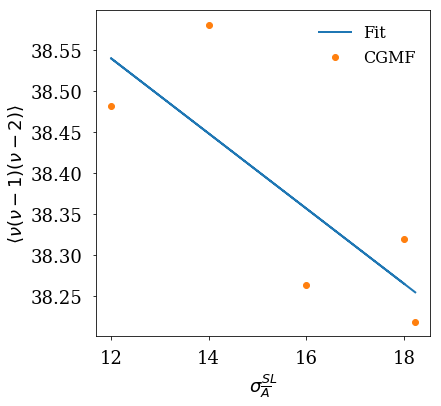

[ -4.24999794e-03   9.42449207e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\overline{N}_{\gamma}$. 
chi^2/dof = 3.1E-05


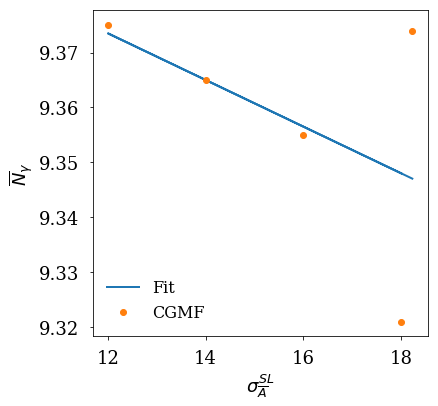

[ -6.26542418e-02   9.34700381e+01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$. 
chi^2/dof = 1.7E-03


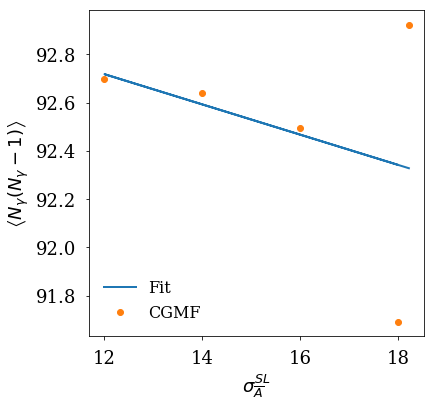

[ -6.52767966e-01   9.71746685e+02]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$. 
chi^2/dof = 6.1E-02


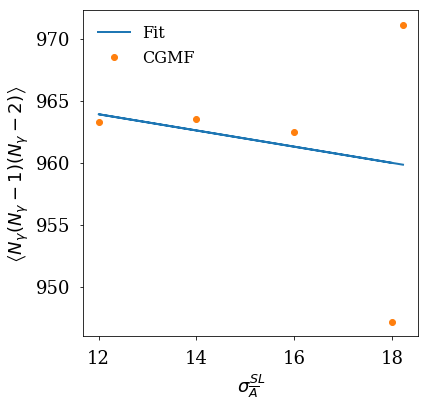

[ -1.42810437e-03   1.91434298e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\overline{E}_{n}^{CM}$. 
chi^2/dof = 6.6E-07


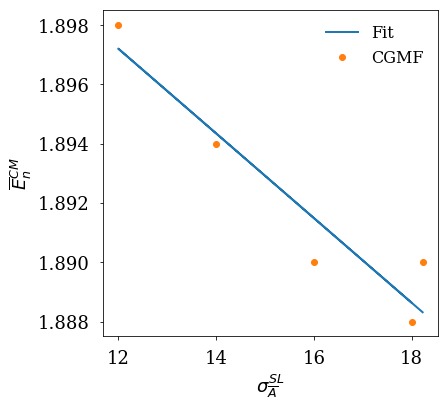

[-0.00166841  1.6159026 ]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\sigma_{\overline{E}_{n}}^{CM}$. 
chi^2/dof = 1.5E-06


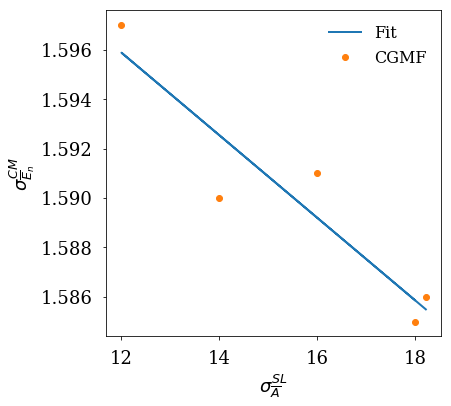

[ -5.44354467e-04   9.09716535e-01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\overline{E}_{\gamma}^{CM}$. 
chi^2/dof = 3.2E-06


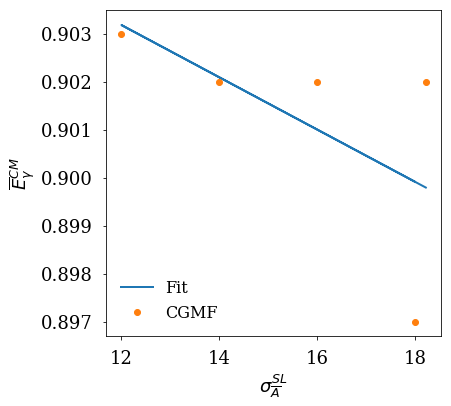

[-0.00143505  0.89645157]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{CM}$. 
chi^2/dof = 4.7E-06


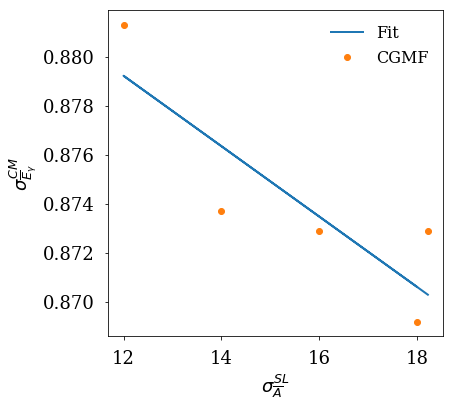

[ -1.05113170e-03   2.13444517e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\overline{E}_{n}^{Lab}$. 
chi^2/dof = 2.9E-06


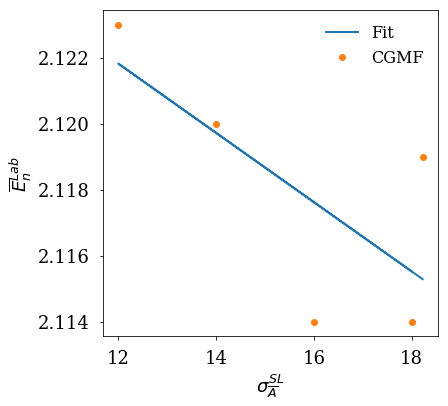

[ -1.44063012e-03   1.65733895e+00]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\sigma_{\overline{E}_{n}}^{Lab}$. 
chi^2/dof = 1.7E-06


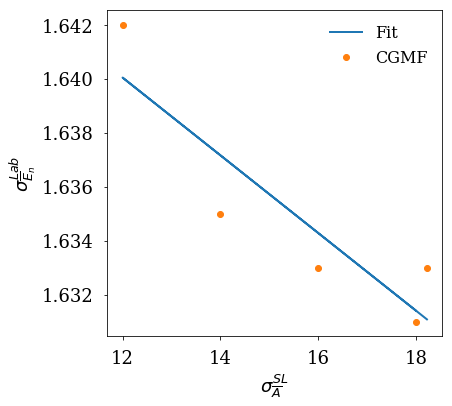

[ -5.06777233e-04   7.42728631e-01]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\overline{E}_{\gamma}^{Lab}$. 
chi^2/dof = 1.5E-06


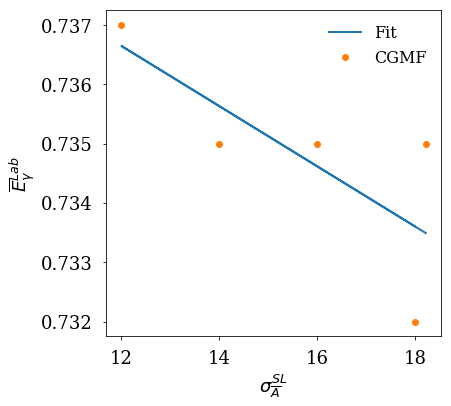

[-0.00118177  0.851849  ]
ACCEPTABLE LINEAR FIT between $\sigma_{\overline{A}}^{SL}$ and $\sigma_{\overline{E}_{\gamma}}^{Lab}$. 
chi^2/dof = 3.2E-06


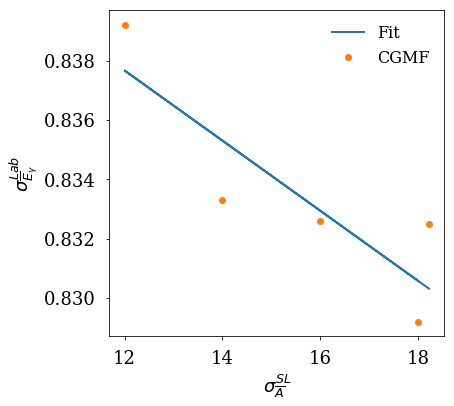

In [6]:
# rembember that the nominal values for the parameters and responses is the first element of each array

SRx = {}
ki = 0

for k in param_keys:
    SRx[k] = {}
    Ri = 0
    for R in response_keys:
        SRx[k][R] = get_SRx(Rdata[k][k], Rdata[k][R], Rdata[k][k][0], Rdata[k][R][0])
        test_SRx(Rdata[k][k], Rdata[k][R], Rdata[k][k][0], Rdata[k][R][0], param_labels[ki], response_labels[Ri])
        Ri +=1
    ki +=1

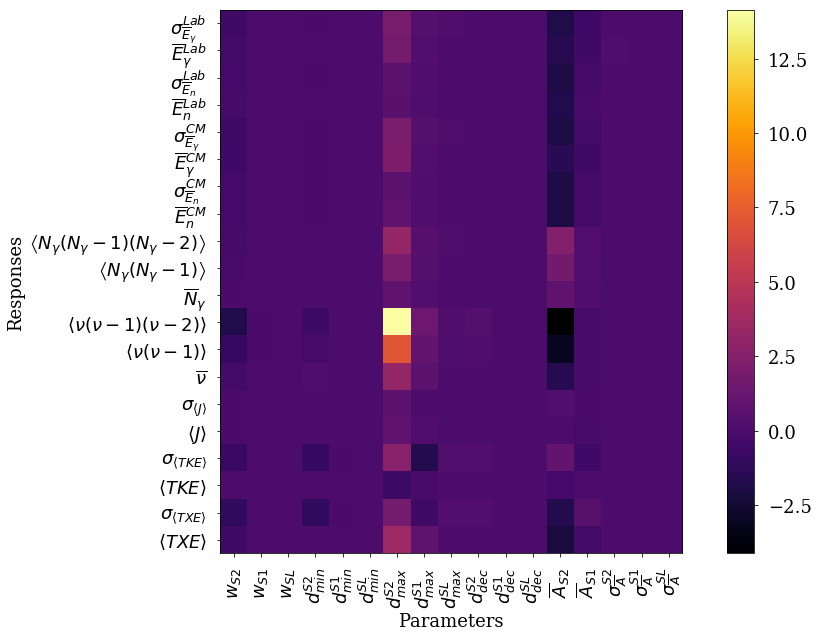

In [7]:
# Make the cool overall imshow plot with all responses and parameters

fig, axes = pl.subplots(1, 1, figsize=(10,10))

# transfer SRx library to a 2d array
SRxArr = np.zeros((len(response_keys), len(param_keys)))

for i in range(len(response_keys)):
    for j in range(len(param_keys)):
        SRxArr[i,j] = SRx[param_keys[j]][response_keys[i]]
        


plt.xlabel('Parameters')
plt.xticks(np.linspace(0,len(param_keys)-1, len(param_keys)), param_labels, rotation='vertical')
plt.ylabel('Responses')
plt.yticks(np.linspace(0,len(response_keys)-1, len(response_keys)), response_labels)
plt.imshow(SRxArr,  origin="lower")
plt.colorbar(fraction=0.06, pad=0.08)
plt.show()

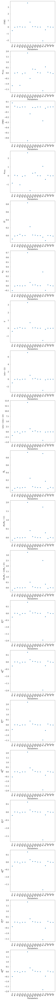

In [8]:
fig, axes = pl.subplots(20,1, figsize=(8,180))

i = 1
for k in range(len(response_keys)):
    plt.subplot(20,1,i)
    plt.plot(np.linspace(0,len(param_keys)-1, len(param_keys)), SRxArr[k,:], 'o')
    plt.xticks(np.linspace(0,len(param_keys)-1, len(param_keys)), param_labels, rotation='vertical')
    plt.xlabel('Parameters')
    plt.ylabel(response_labels[k])
    i+=1

***************************************
Parameter: w0
***************************************


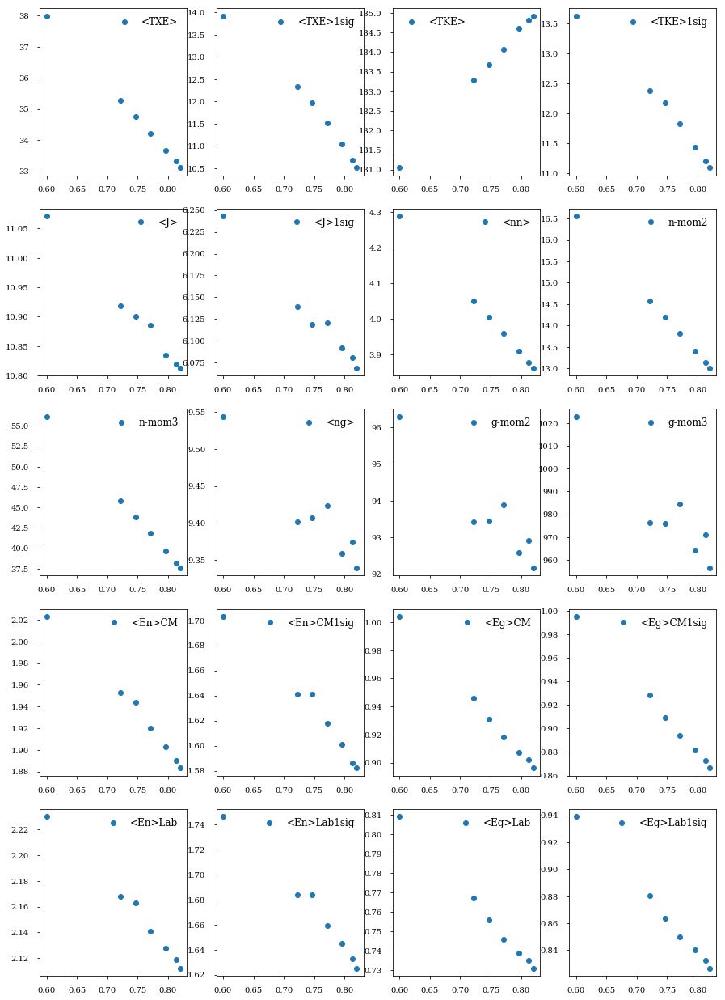

***************************************
Parameter: w1
***************************************


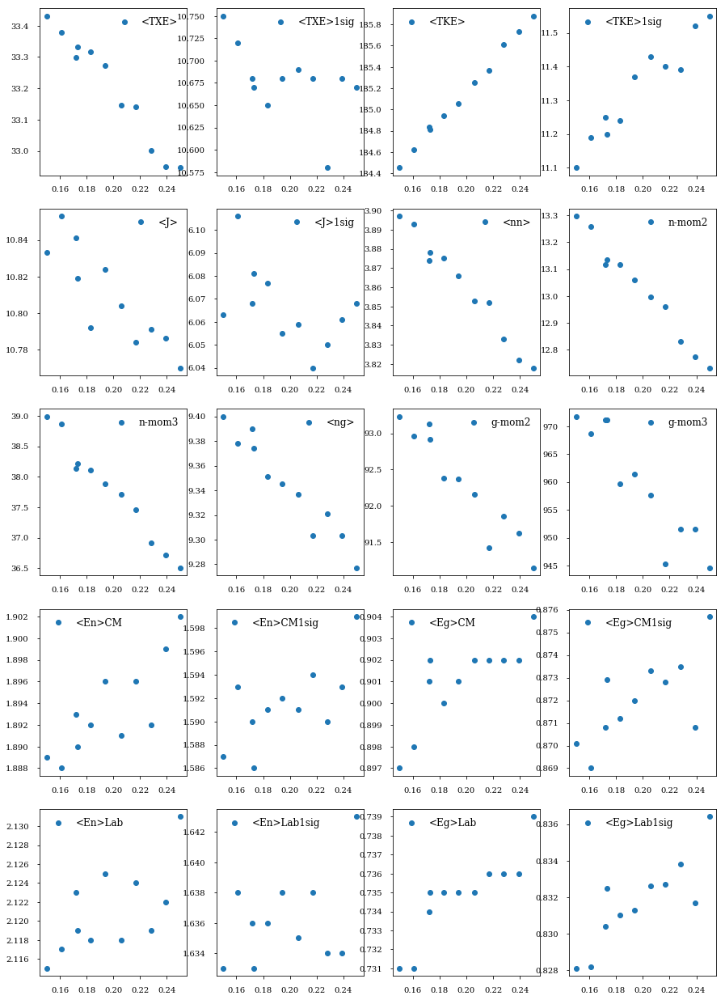

***************************************
Parameter: w2
***************************************


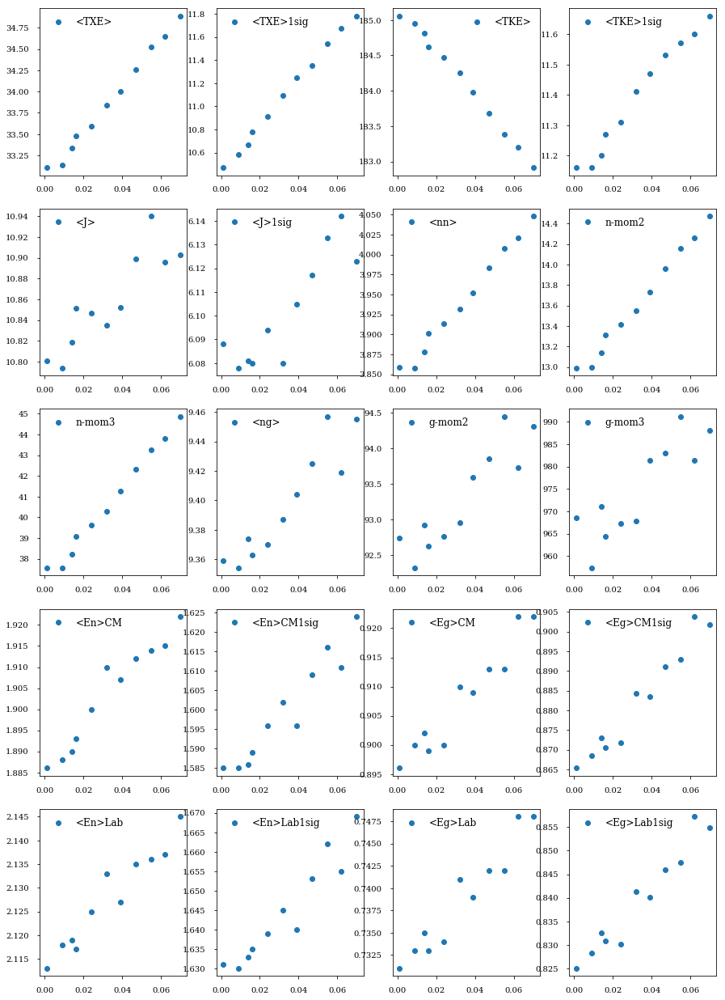

***************************************
Parameter: dmin0
***************************************


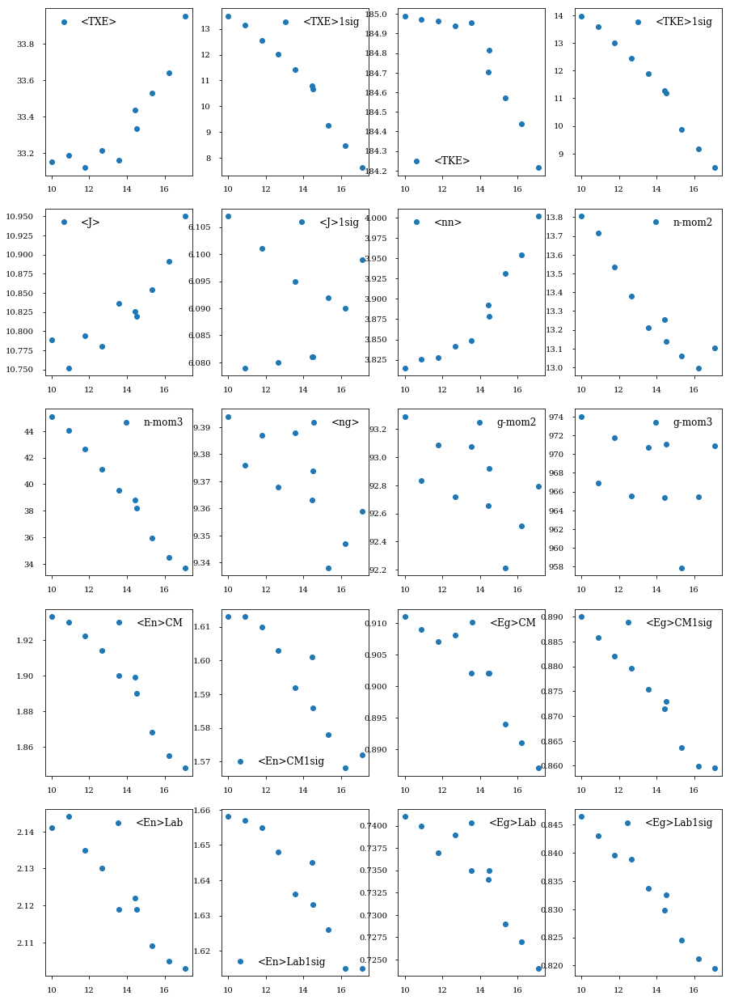

***************************************
Parameter: dmin1
***************************************


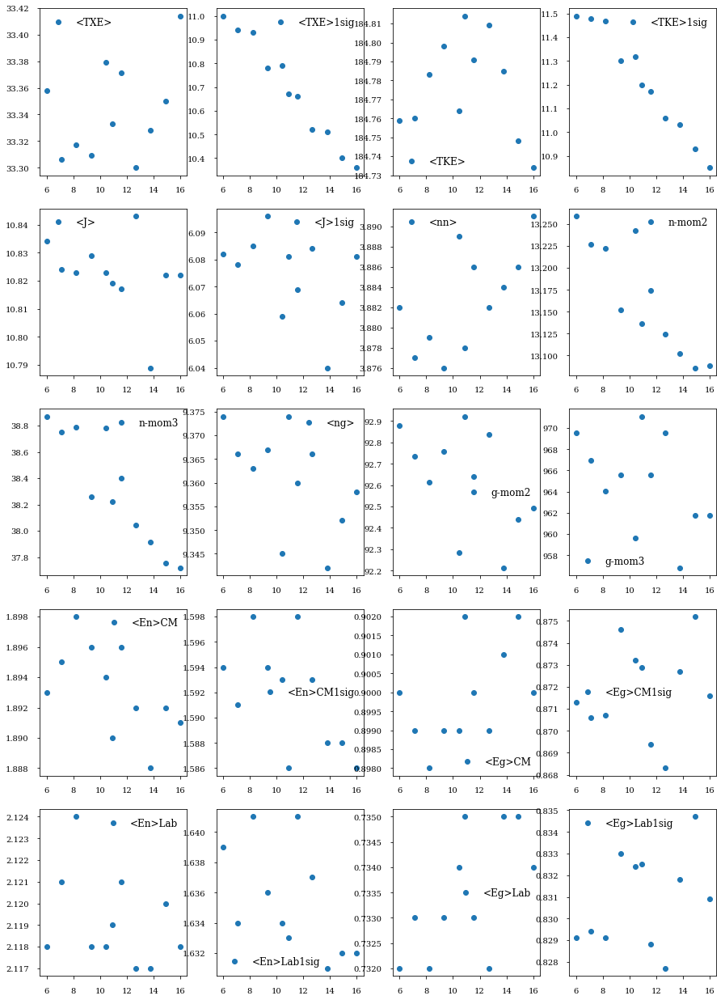

***************************************
Parameter: dmin2
***************************************


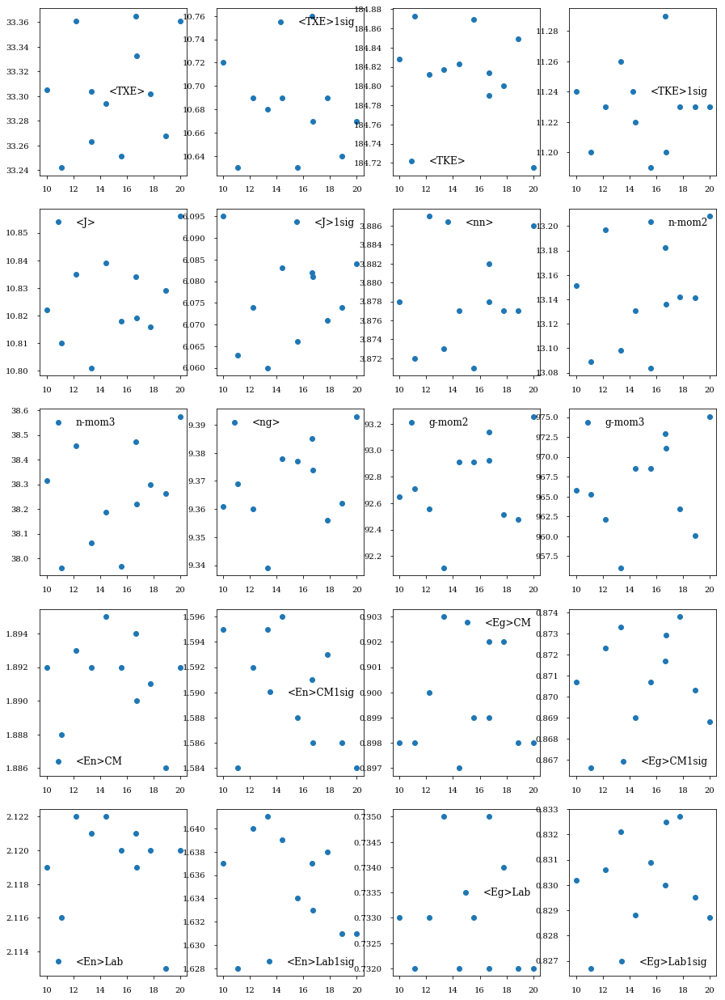

***************************************
Parameter: dmax0
***************************************


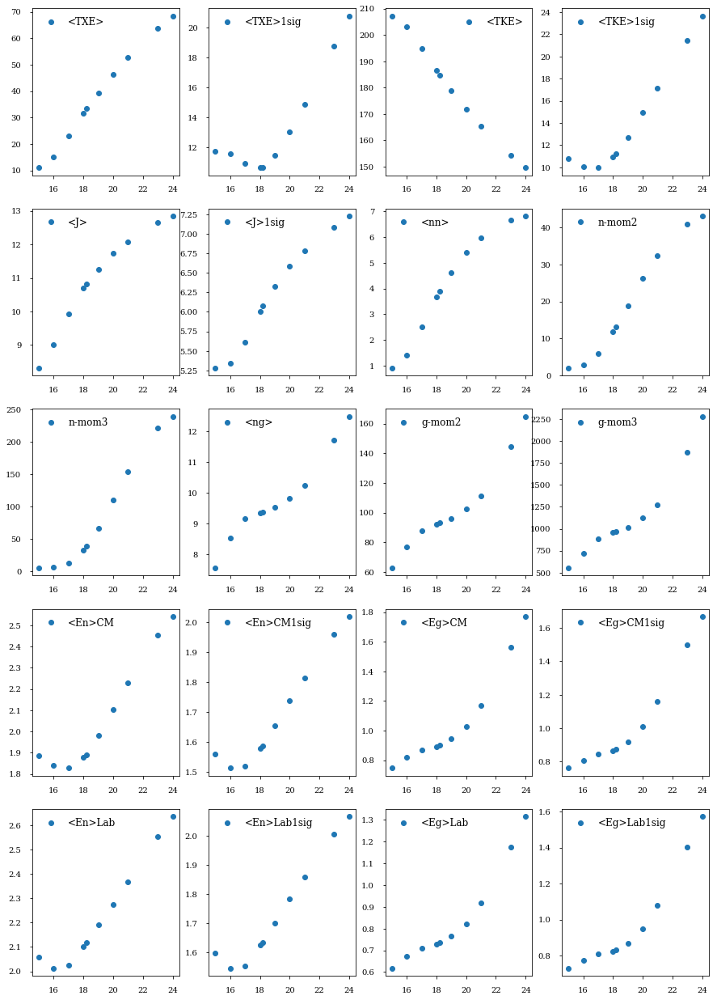

***************************************
Parameter: dmax1
***************************************


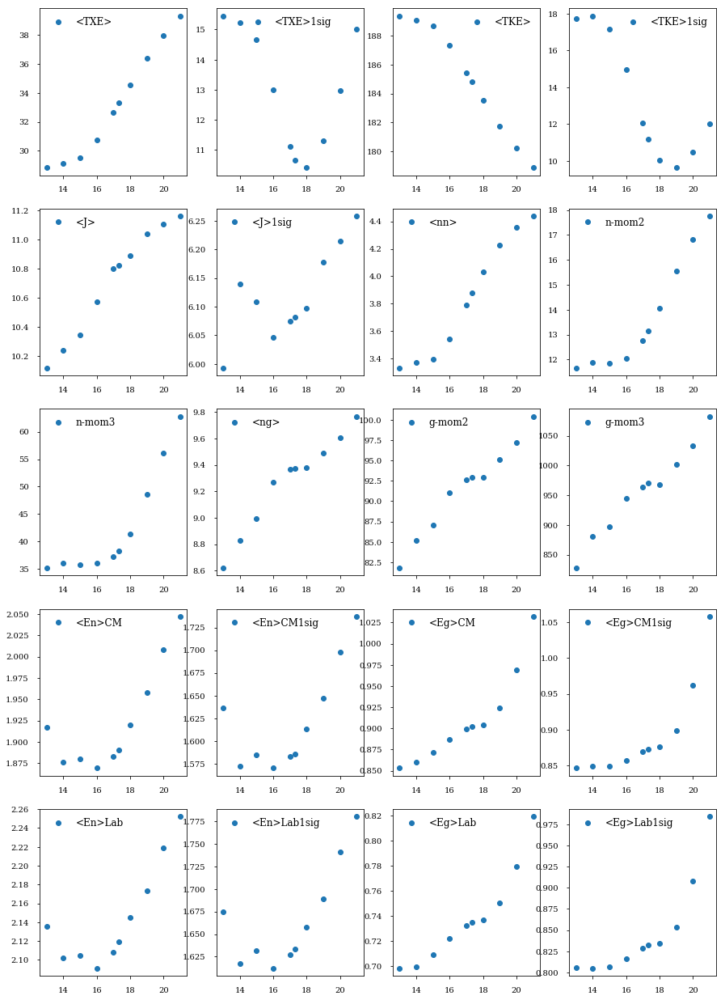

***************************************
Parameter: dmax2
***************************************


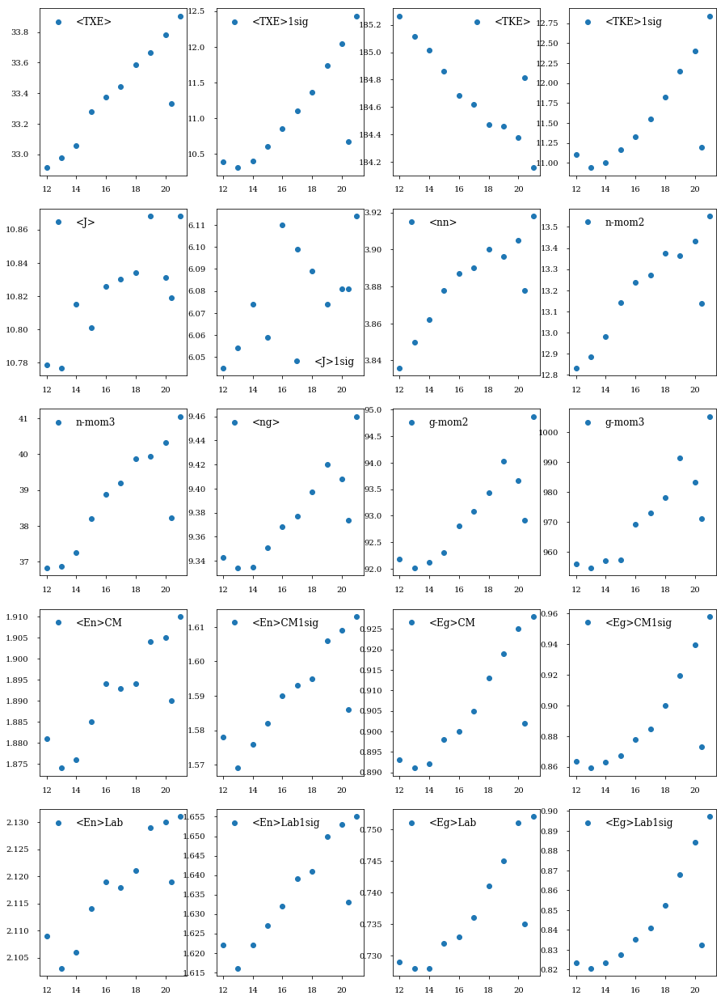

***************************************
Parameter: ddec0
***************************************


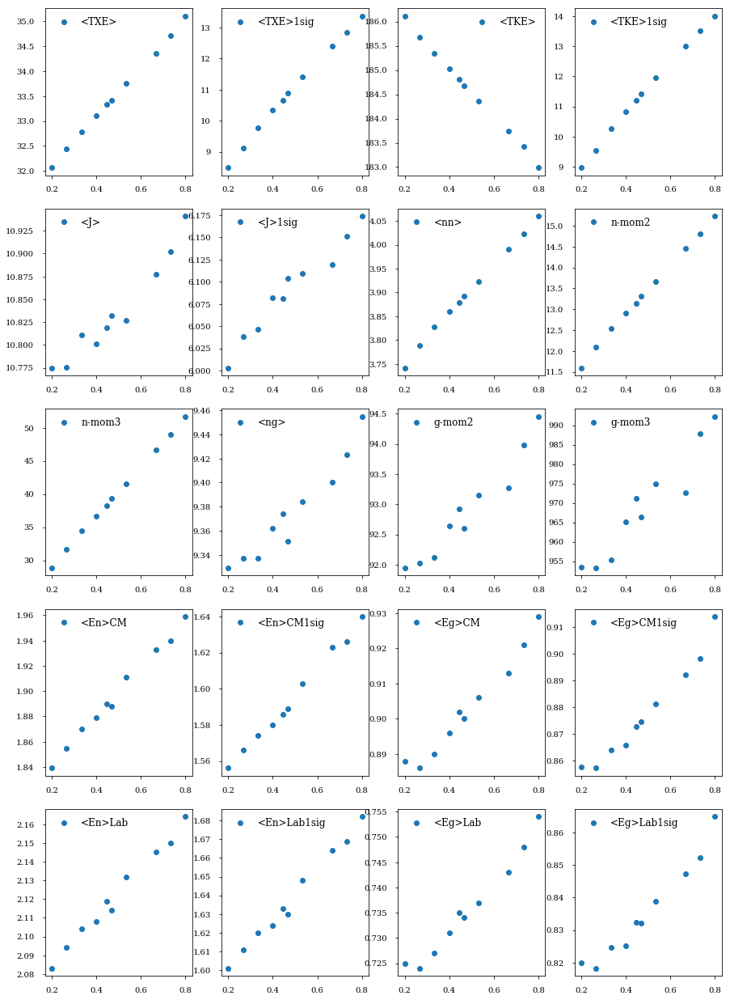

***************************************
Parameter: ddec1
***************************************


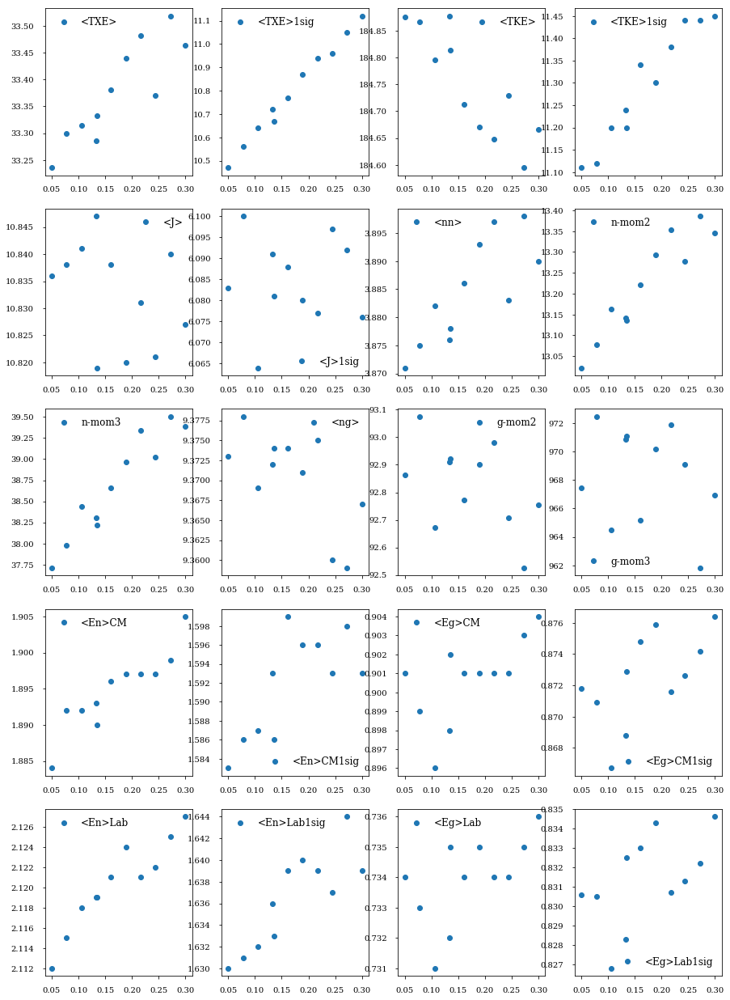

***************************************
Parameter: ddec2
***************************************


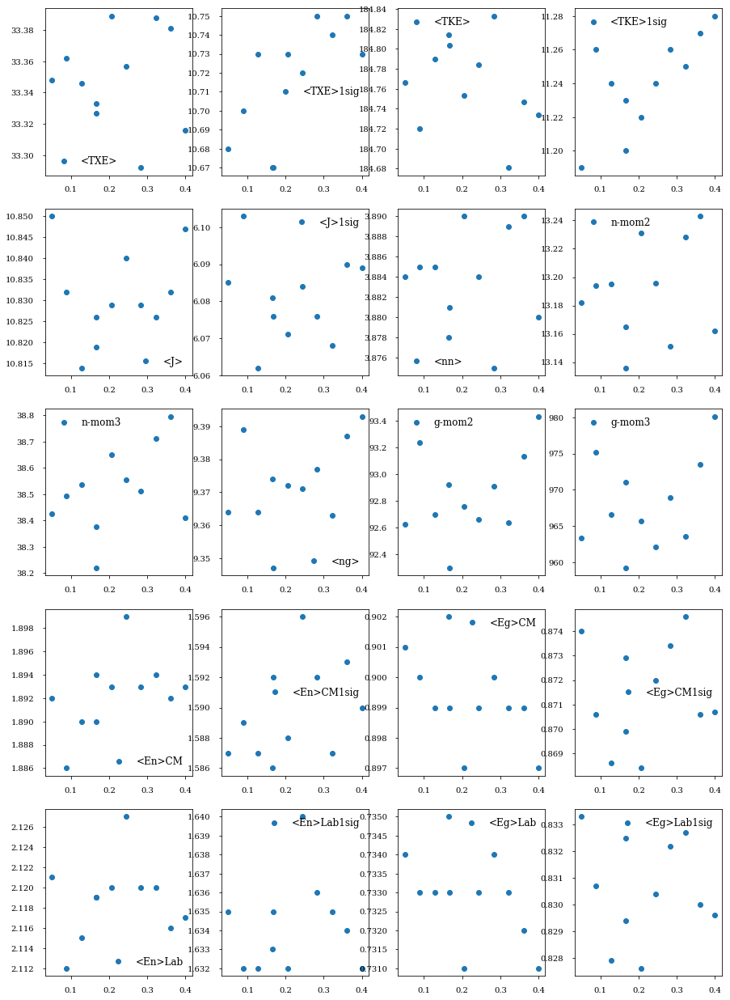

***************************************
Parameter: Abar0
***************************************


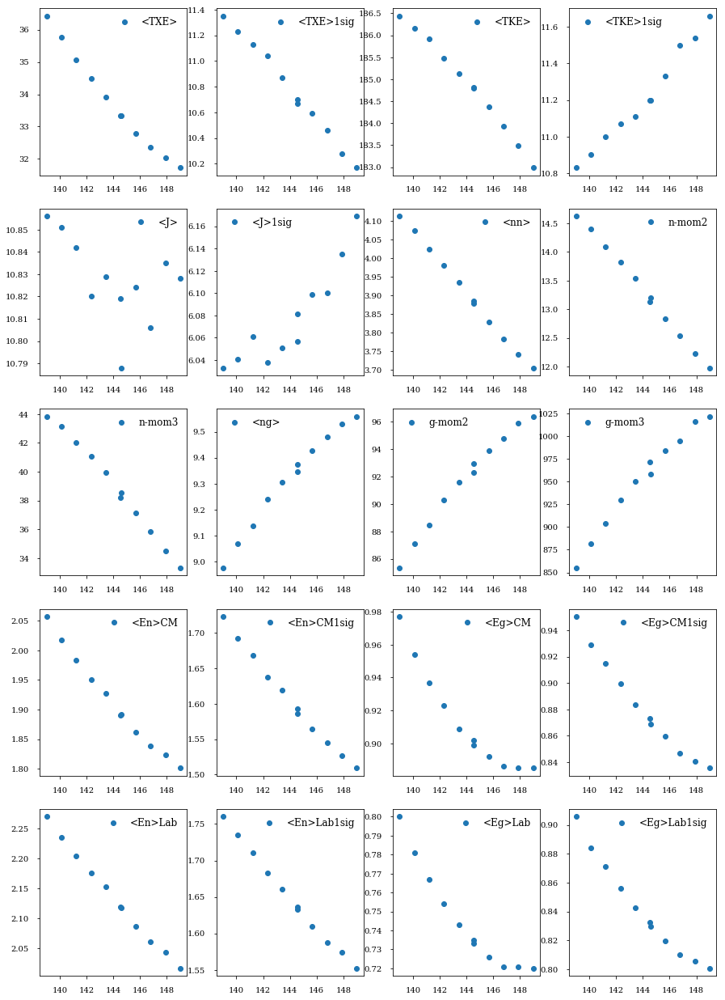

***************************************
Parameter: Abar1
***************************************


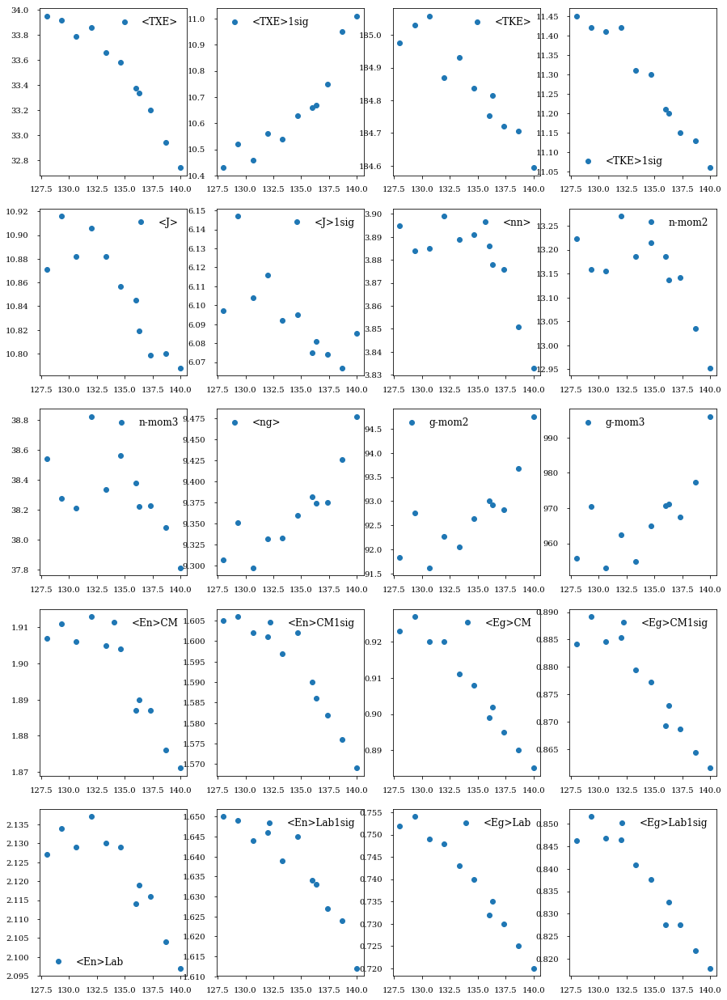

***************************************
Parameter: sigA0
***************************************


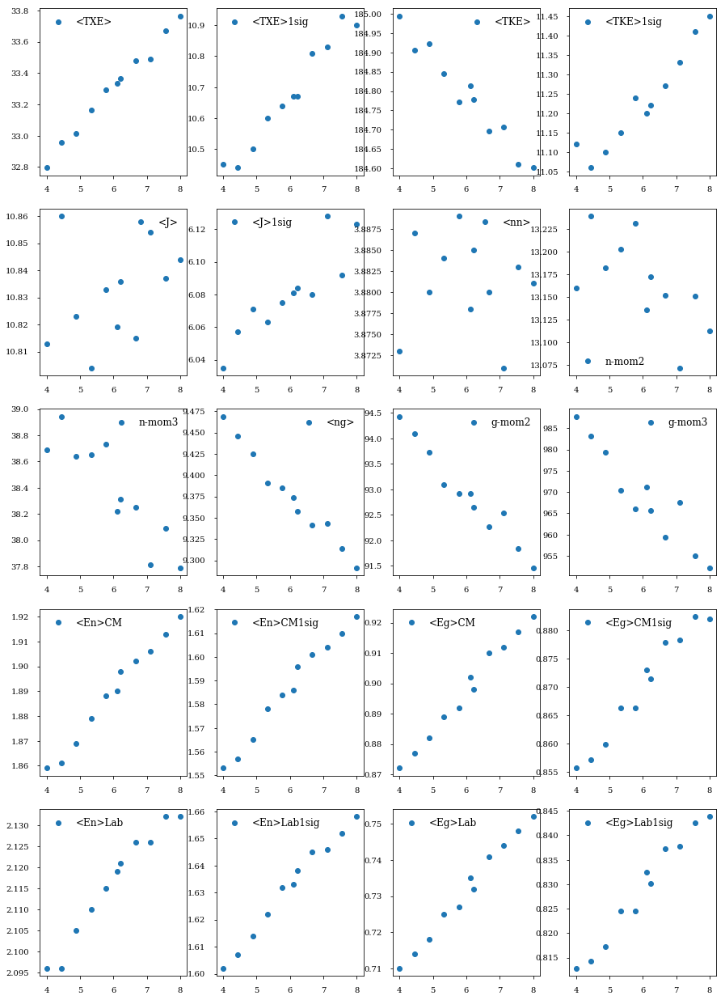

***************************************
Parameter: sigA1
***************************************


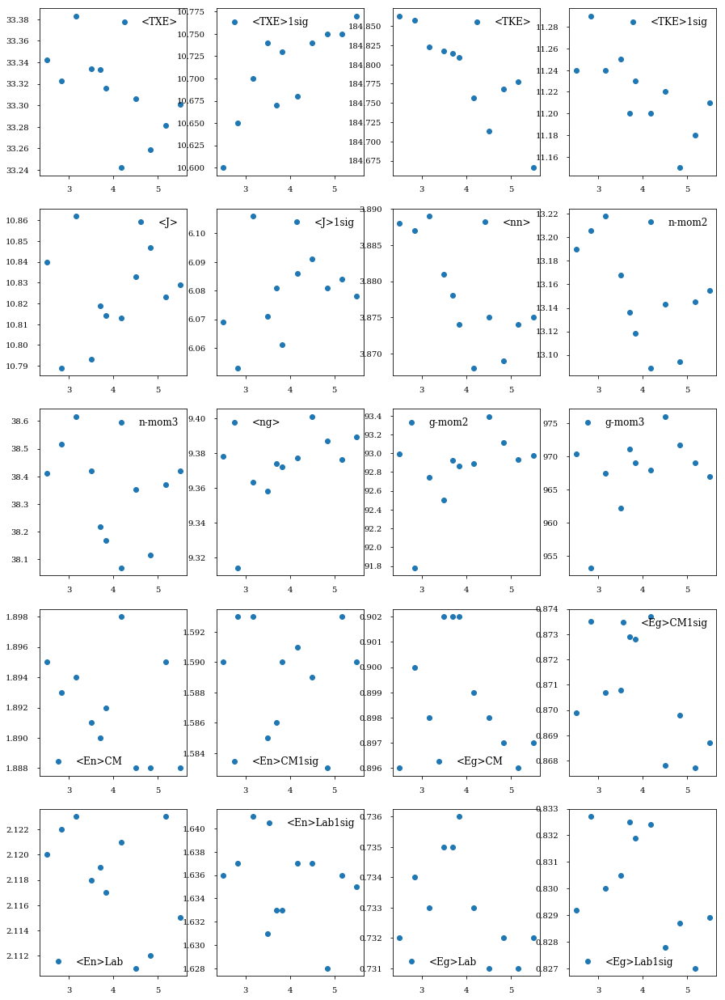

***************************************
Parameter: sigA2
***************************************


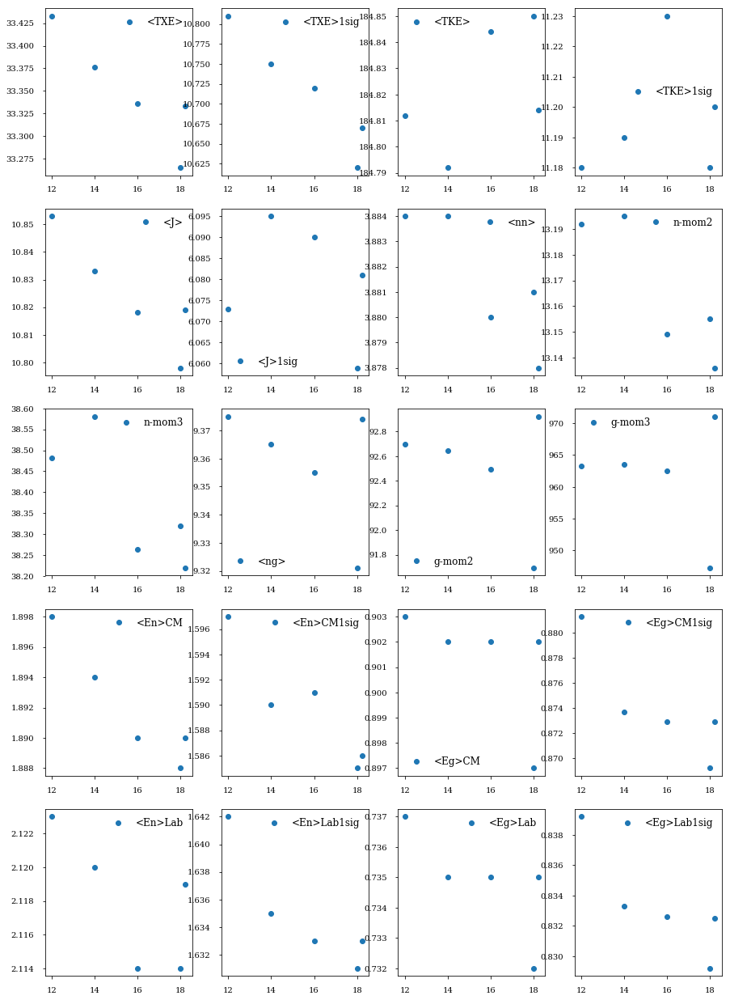

In [9]:
mpl.rcParams['axes.labelsize'] = 10.
mpl.rcParams['xtick.labelsize'] = 10.
mpl.rcParams['ytick.labelsize'] = 10.
mpl.rcParams['lines.linewidth'] = 2.

for x in param_keys:
    print("***************************************")
    print("Parameter: {}".format(x))
    print("***************************************")
    fig, axes = pl.subplots(5,4, figsize=(15, 22))

    i = 1
    for R in response_keys:
        plt.subplot(5,4,i)
        plt.plot(Rdata[x][x],Rdata[x][R], 'o' ,label = R)
        lg = plt.legend(numpoints=1,fontsize=12, loc='best')
        lg.draw_frame(False)
        i+=1
    plt.show()